## Libraries

In [67]:
import importlib as imp
import products_df as pro
import models as mod
%load_ext autoreload
%autoreload 2

In [68]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd

pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 1000)       # Increase width of the display
pd.set_option('display.colheader_justify', 'center')  # Center align column headers




In [69]:

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from IPython.display import display, clear_output




# Loading the Transaction Data

In [4]:


# Set base directory
base_dir = "./Data/"

# Define file path for main_df
df_path = f"{base_dir}model_data.parquet"

# Load main_df
df = pd.read_parquet(df_path)

# Confirm successful loading
print(f"main_df loaded successfully! Shape: {df.shape}")

main_df loaded successfully! Shape: (15550375, 27)


In [5]:
main_df=df.copy()

In [ ]:
main_df.head()

,CD_TICKET_UNIQUE,DT_VENTE,TS_VENTE,MT_TTC_NET,TX_TVA,QT_UVC,QT_POIDS,IS_PROMO_NATIONALE,IS_PROMO_MAGASIN,CITY_NAME,LB_METIER,LB_SOUS_RAYON,LB_FAMILLE,LB_SOUS_FAMILLE,CD_ARTICLE,LB_ARTICLE,CUSTOMER_ID,PAYMENT_TYPE,year,quarter,month,year_month,day_of_week,day_category,hour,time_of_day,Holiday
0,3958217001061530172,2022-10-15,2022-10-15 10:15:00,2.25,0.055,1.0,0.0,0,0,Meyzieu,Traiteur,Elaborés,Surimis,Bâtonnets,T186,Bâtonnets saveur crabe 400g,UNKNOWN_CASH,CASH,2022,2022Q4,10,2022-10,Saturday,Weekend,10,Morning,None
1,3958238601061530198,2022-10-15,2022-10-15 10:51:00,4.99,0.055,1.0,0.0,0,0,Meyzieu,Traiteur,Elaborés,Poissons fumés,Saumons fumés,T147,Saumon fumé Prix Malin 160g,UNKNOWN_CASH,CASH,2022,2022Q4,10,2022-10,Saturday,Weekend,10,Morning,None
2,3958245801061530209,2022-10-15,2022-10-15 11:03:00,2.95,0.055,1.0,0.0,0,0,Meyzieu,Traiteur,Elaborés,Tartinables,Tarti Classiques,T307,Fmg Frais* : Thon 115g,Person_21504,CARD,2022,2022Q4,10,2022-10,Saturday,Weekend,11,Morning,None
3,3958245801061530209,2022-10-15,2022-10-15 11:03:00,3.95,0.055,1.0,0.0,0,0,Meyzieu,Traiteur,Elaborés,Marinés,Marinés Mer,T439,Crevettes* déco piment 120g,Person_21504,CARD,2022,2022Q4,10,2022-10,Saturday,Weekend,11,Morning,None
4,3958245801061530209,2022-10-15,2022-10-15 11:03:00,7.45,0.055,1.0,0.0,0,0,Meyzieu,Traiteur,Elaborés,Poissons fumés,Saumons fumés,T526,Saumon bio fumé 4 tr 130g,Person_21504,CARD,2022,2022Q4,10,2022-10,Saturday,Weekend,11,Morning,None


In [7]:
main_df["PAYMENT_TYPE"].value_counts()

PAYMENT_TYPE
CARD    12754018
CASH     2796357
Name: count, dtype: int64

In [8]:
import pandas as pd

# Ensure datetime column is in datetime format
main_df['TS_VENTE'] = pd.to_datetime(main_df['TS_VENTE'], errors='coerce')

# Extract the time range
min_time = main_df['TS_VENTE'].dt.time.min()
max_time = main_df['TS_VENTE'].dt.time.max()

print(f"Time range in your dataset: {min_time} - {max_time}")


Time range in your dataset: 08:00:00 - 20:10:00


In [9]:
main_df.dtypes

CD_TICKET_UNIQUE              object
DT_VENTE              datetime64[ns]
TS_VENTE              datetime64[ns]
MT_TTC_NET                   float64
TX_TVA                       float64
QT_UVC                       float64
QT_POIDS                     float64
IS_PROMO_NATIONALE             int64
IS_PROMO_MAGASIN               int64
CITY_NAME                     object
LB_METIER                     object
LB_SOUS_RAYON                 object
LB_FAMILLE                    object
LB_SOUS_FAMILLE               object
CD_ARTICLE                    object
LB_ARTICLE                    object
CUSTOMER_ID                   object
PAYMENT_TYPE                  object
year                           int32
quarter                period[Q-DEC]
month                          int32
year_month                 period[M]
day_of_week                   object
day_category                  object
hour                           int32
time_of_day                   object
Holiday                       object
d

In [10]:
main_df.nunique()

CD_TICKET_UNIQUE      2146642
DT_VENTE                  357
TS_VENTE               221354
MT_TTC_NET               5634
TX_TVA                      2
QT_UVC                   2538
QT_POIDS                10606
IS_PROMO_NATIONALE          2
IS_PROMO_MAGASIN            2
CITY_NAME                   5
LB_METIER                   4
LB_SOUS_RAYON               6
LB_FAMILLE                117
LB_SOUS_FAMILLE           608
CD_ARTICLE               3445
LB_ARTICLE               3402
CUSTOMER_ID            338665
PAYMENT_TYPE                2
year                        2
quarter                     4
month                      12
year_month                 12
day_of_week                 7
day_category                2
hour                       13
time_of_day                 3
Holiday                     3
dtype: int64

In [11]:
main_df.shape

(15550375, 27)

In [12]:
import numpy as np

# Compute Q1 (25th percentile) and Q3 (75th percentile)
Q1 = main_df["MT_TTC_NET"].quantile(0.25)
Q3 = main_df["MT_TTC_NET"].quantile(0.75)

# Compute IQR
IQR = Q3 - Q1

# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Count outliers
outliers = main_df[(main_df["MT_TTC_NET"] < lower_bound) | (main_df["MT_TTC_NET"] > upper_bound)]
outlier_count = outliers.shape[0]

# Percentage of data that are outliers
total_count = main_df.shape[0]
outlier_percentage = (outlier_count / total_count) * 100

# Show results
print(f"Outlier Count: {outlier_count}")
print(f"Outlier Percentage: {outlier_percentage:.2f}%")
print(f"Lower Bound: {lower_bound}")
print(f"Upper Bound: {upper_bound}")

# Remove outliers
main_df_cleaned = main_df[(main_df["MT_TTC_NET"] >= lower_bound) & (main_df["MT_TTC_NET"] <= upper_bound)].copy()

# Display the number of removed outliers
outliers_removed = main_df.shape[0] - main_df_cleaned.shape[0]
print(f"Outliers removed: {outliers_removed}")


Outlier Count: 868349
Outlier Percentage: 5.58%
Lower Bound: -1.9949999999999994
Upper Bound: 7.5649999999999995
Outliers removed: 868349


The above gives the outliers removed df but we are not using it in the below 

In [13]:
main_df.shape

(15550375, 27)

In [14]:
imp.reload(pro)

<module 'products_df' from 'e:\\Prosol\\products_df.py'>

In [15]:
# Compute KPIs using the function
product_df = pro.compute_product_kpis(main_df)

In [16]:
product_df.head()

,Product_Code,Product_Name,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases
0,4000,Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729
1,4014,Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901
2,4018,poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109
3,4019,Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053
4,4020,Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437


In [17]:
# List of columns you want to check for zeros.
columns_to_check = ["Weekday_Purchases","Weekend_Purchases","Days_Since_Last_Purchase"]

# Iterate over the columns and print out whether zeros exist.
for col in columns_to_check:
    zero_count = (product_df[col] == 0).sum()
    if zero_count > 0:
        print(f"Column '{col}' contains {zero_count} zero(s).")
    else:
        print(f"Column '{col}' does not contain any zeros.")


Column 'Weekday_Purchases' contains 93 zero(s).
Column 'Weekend_Purchases' contains 209 zero(s).
Column 'Days_Since_Last_Purchase' contains 1248 zero(s).


Range: 0.0 - 39.0
Median: 2.1818181818181817
Mean: 2.318036791203003


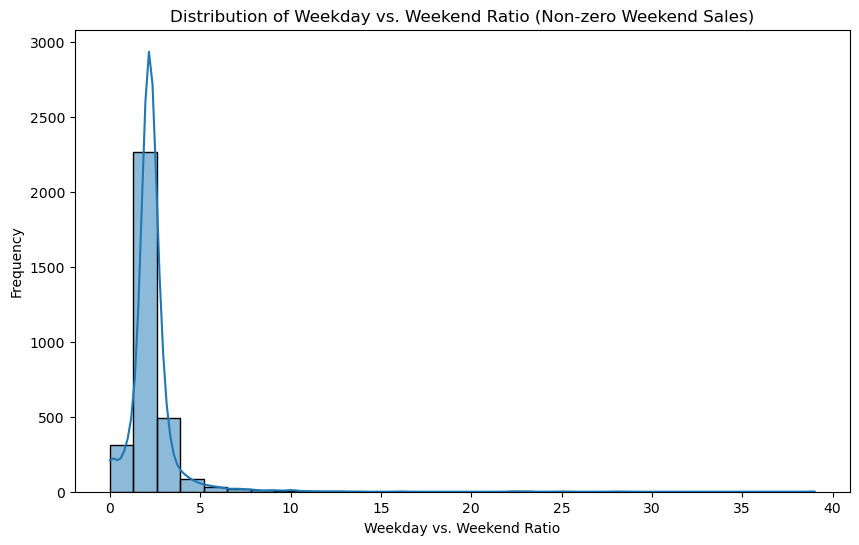

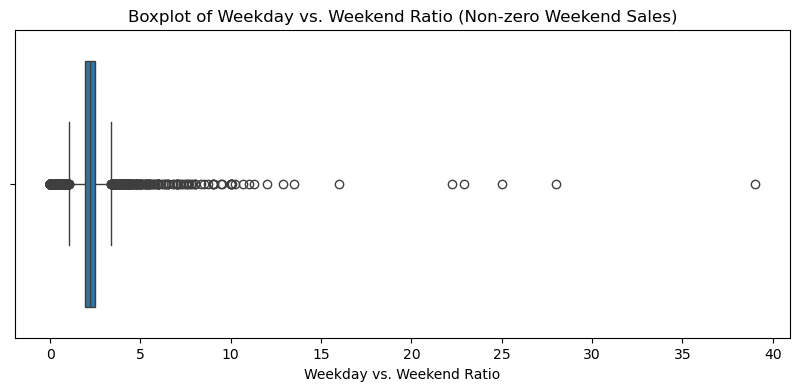

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure the DataFrame contains non-zero weekend sales to avoid division by zero.
non_zero_weekend = product_df[product_df["Weekend_Purchases"] != 0].copy()

# Calculate the ratio for these products.
non_zero_weekend["Weekday_vs_Weekend_Ratio"] = non_zero_weekend["Weekday_Purchases"] / non_zero_weekend["Weekend_Purchases"]

# Print some basic statistics for further justification
print("Range:", np.min(non_zero_weekend["Weekday_vs_Weekend_Ratio"]), "-", np.max(non_zero_weekend["Weekday_vs_Weekend_Ratio"]))
print("Median:", np.median(non_zero_weekend["Weekday_vs_Weekend_Ratio"]))
print("Mean:", np.mean(non_zero_weekend["Weekday_vs_Weekend_Ratio"]))

# Plot a histogram of the ratio.
plt.figure(figsize=(10, 6))
sns.histplot(non_zero_weekend["Weekday_vs_Weekend_Ratio"], bins=30, kde=True)
plt.title("Distribution of Weekday vs. Weekend Ratio (Non-zero Weekend Sales)")
plt.xlabel("Weekday vs. Weekend Ratio")
plt.ylabel("Frequency")
plt.show()

# Plot a boxplot of the ratio.
plt.figure(figsize=(10, 4))
sns.boxplot(x=non_zero_weekend["Weekday_vs_Weekend_Ratio"])
plt.title("Boxplot of Weekday vs. Weekend Ratio (Non-zero Weekend Sales)")
plt.xlabel("Weekday vs. Weekend Ratio")
plt.show()


Outlier Control  
- The majority of data points fall below 10, and values above 10 are rare. Capping at 10 reduces the impact of these outliers that could distort your analysis.

Stability  
- By capping the ratio at 10, you limit the influence of extreme values, ensuring that the metric remains robust and stable across your dataset.

Interpretability  
- A cap at 10 simplifies interpretation. For example, a ratio of 10 can be clearly interpreted as indicating exclusive weekday activity without the distortion from excessively high values.

Data-Driven Choice  
- The box plot confirms that most of the data lies under 10, making this cap a defensible, statistically-driven decision.


#### Additional Metrics

In [19]:
import numpy as np

# Revenue and Quantity per Purchase: if no purchases, set to 0.
product_df["Revenue_per_Purchase"] = np.where(
    product_df["Count_of_Purchases"] == 0,
    0,
    product_df["Total_Revenue"] / product_df["Count_of_Purchases"]
)
product_df["Quantity_per_Purchase"] = np.where(
    product_df["Count_of_Purchases"] == 0,
    0,
    product_df["Total_Quantity"] / product_df["Count_of_Purchases"]
)

# Revenue and Quantity per Day Since Last Purchase:
product_df["Revenue_per_Day_Since_Last_Purchase"] = product_df["Total_Revenue"] / np.where(
    product_df["Days_Since_Last_Purchase"] == 0, 1, product_df["Days_Since_Last_Purchase"]
)
product_df["Quantity_per_Day_Since_Last_Purchase"] = product_df["Total_Quantity"] / np.where(
    product_df["Days_Since_Last_Purchase"] == 0, 1, product_df["Days_Since_Last_Purchase"]
)


# Weekday vs. Weekend Ratio:
# If Weekend_Purchases == 0:
#   - If Weekday_Purchases > 0, assign a capped value (e.g., 10) to indicate exclusively weekday activity.
#   - If both are 0, assign 0.
product_df["Weekday_vs_Weekend_Ratio"] = np.where(
    product_df["Weekend_Purchases"] == 0,
    np.where(product_df["Weekday_Purchases"] > 0, 10, 0),
    product_df["Weekday_Purchases"] / product_df["Weekend_Purchases"]
)

# Time of Day Proportions:
# If Count_of_Purchases == 0, assign 0 for the proportion.
product_df["Morning_Proportion"] = np.where(
    product_df["Count_of_Purchases"] == 0,
    0,
    product_df["Morning_Purchases"] / product_df["Count_of_Purchases"]
)
product_df["Afternoon_Proportion"] = np.where(
    product_df["Count_of_Purchases"] == 0,
    0,
    product_df["Afternoon_Purchases"] / product_df["Count_of_Purchases"]
)
product_df["Evening_Proportion"] = np.where(
    product_df["Count_of_Purchases"] == 0,
    0,
    product_df["Evening_Purchases"] / product_df["Count_of_Purchases"]
)



In [20]:
product_df.shape

(3445, 43)

In [21]:
product_df.head()

,Product_Code,Product_Name,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion
0,4000,Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949
1,4014,Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850
2,4018,poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734
3,4019,Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638
4,4020,Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102


In [22]:
product_df.dtypes

Product_Code                                    object
Product_Name                                    object
Count_of_Purchases                               int64
Total_Quantity                                 float64
Total_Revenue                                  float64
Avg_Quantity                                   float64
Avg_Revenue                                    float64
Number_of_Customers                              int64
Repeat_Customers                                 int64
Repeat_Purchase_Rate                           float64
Avg_Purchase_Frequency                         float64
Average_Share_Of_Wallet                        float64
Last_Purchase_Date                      datetime64[ns]
Days_Since_Last_Purchase                         int64
Promotion_Nationale_Count                        int64
Promotion_Magasin_Count                          int64
Most_Purchased_Day_Category                     object
Most_Purchased_Time_Of_Day                      object
Hierarchy_

In [23]:
import joblib
joblib.dump(product_df, './Data/product_df.joblib')


['./Data/product_df.joblib']

# Loading Product Df

In [177]:
import joblib
product_df = joblib.load('./Data/product_df.joblib')


In [178]:
product_df.drop(columns="Product_Code", inplace=True)

In [179]:
product_df.head()

,Product_Name,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion
0,Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949
1,Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850
2,poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734
3,Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638
4,Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102


In [180]:
product_df.dtypes

Product_Name                                    object
Count_of_Purchases                               int64
Total_Quantity                                 float64
Total_Revenue                                  float64
Avg_Quantity                                   float64
Avg_Revenue                                    float64
Number_of_Customers                              int64
Repeat_Customers                                 int64
Repeat_Purchase_Rate                           float64
Avg_Purchase_Frequency                         float64
Average_Share_Of_Wallet                        float64
Last_Purchase_Date                      datetime64[ns]
Days_Since_Last_Purchase                         int64
Promotion_Nationale_Count                        int64
Promotion_Magasin_Count                          int64
Most_Purchased_Day_Category                     object
Most_Purchased_Time_Of_Day                      object
Hierarchy_METIER                                object
Hierarchy_

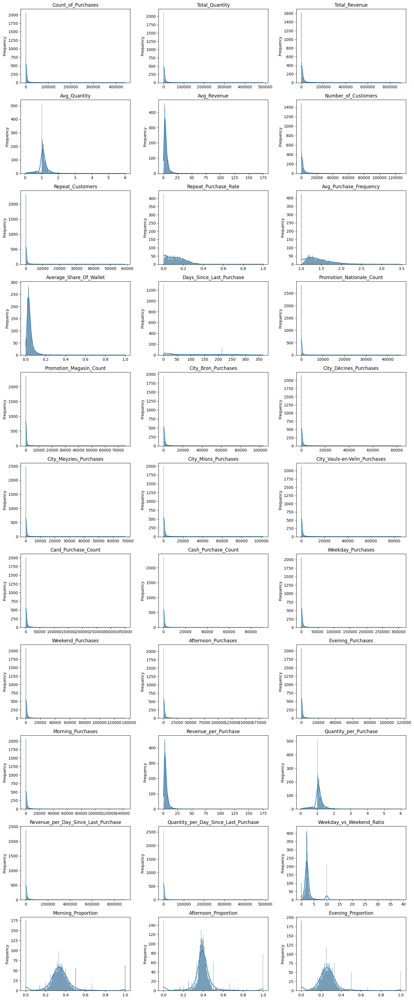

In [181]:

# Select all numerical columns from the KPI DataFrame
numeric_cols = product_df.select_dtypes(include=['number']).columns
mod.plot_numeric_histograms(product_df, numeric_cols,bins=300)


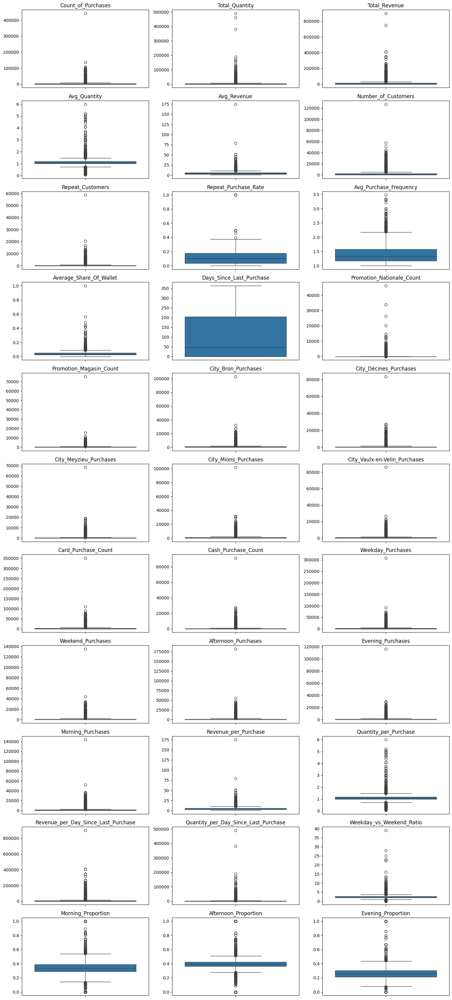

In [182]:
mod.plot_numeric_boxplots(product_df, numeric_cols)

In [34]:
product_df.dtypes

Product_Name                                    object
Count_of_Purchases                               int64
Total_Quantity                                 float64
Total_Revenue                                  float64
Avg_Quantity                                   float64
Avg_Revenue                                    float64
Number_of_Customers                              int64
Repeat_Customers                                 int64
Repeat_Purchase_Rate                           float64
Avg_Purchase_Frequency                         float64
Average_Share_Of_Wallet                        float64
Last_Purchase_Date                      datetime64[ns]
Days_Since_Last_Purchase                         int64
Promotion_Nationale_Count                        int64
Promotion_Magasin_Count                          int64
Most_Purchased_Day_Category                     object
Most_Purchased_Time_Of_Day                      object
Hierarchy_METIER                                object
Hierarchy_

In [35]:
product_df.set_index("Product_Name", inplace=True)

In [36]:
product_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,...,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion
Product_Name,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,...,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,...,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,...,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,...,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,...,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102


### Segmentation DFs

In [37]:
product_df["Revenue_per_Customer"] = (
    product_df["Total_Revenue"] / product_df["Number_of_Customers"]
)

# 2. Quantity per Customer
product_df["Quantity_per_Customer"] = (
    product_df["Total_Quantity"] / product_df["Number_of_Customers"]
)

In [38]:
product_df.isnull().sum()

Count_of_Purchases                      0
Total_Quantity                          0
Total_Revenue                           0
Avg_Quantity                            0
Avg_Revenue                             0
Number_of_Customers                     0
Repeat_Customers                        0
Repeat_Purchase_Rate                    0
Avg_Purchase_Frequency                  0
Average_Share_Of_Wallet                 0
Last_Purchase_Date                      0
Days_Since_Last_Purchase                0
Promotion_Nationale_Count               0
Promotion_Magasin_Count                 0
Most_Purchased_Day_Category             0
Most_Purchased_Time_Of_Day              0
Hierarchy_METIER                        0
Hierarchy_SOUS_RAYON                    0
Hierarchy_FAMILLE                       0
Hierarchy_SOUS_FAMILLE                  0
City_Bron_Purchases                     0
City_Décines_Purchases                  0
City_Meyzieu_Purchases                  0
City_Mions_Purchases              

**Why I Created `sales_performance_df` and Its Importance for Clustering**  
The purpose of Sales Performance Segmentation is to create clusters of products based on their sales behavior, revenue generation, and promotion impact. By selecting specific variables, we ensure that clustering models can effectively group products with similar performance patterns, helping in sales optimization, promotional strategies, and inventory planning.

**Why Simple EDA Isn't Enough**  

| EDA Limitation | Why Clustering is Better |
|----------------------|----------------------------|
| EDA shows averages and totals, but doesn’t group similar products together. | Clustering finds patterns in sales trends, revenue stability, and promotion effectiveness. |
| EDA can show top sellers, but doesn’t explain if they need promotions to succeed. | Clustering identifies products that perform well without discounts vs. those that need heavy promotions. |
| EDA cannot segment time-based demand shifts (e.g., seasonal products). | Clustering helps in seasonal trend forecasting and inventory planning. |

**What We Achieve from Clustering `sales_performance_df`**  
- Identifies top-performing vs. struggling products.  
- Differentiates between organic sales and promotion-driven sales.  
- Optimizes inventory planning based on revenue trends.  
- Helps decide if a product needs aggressive marketing or price adjustments.  

---

**Why I Created `customer_engagement_df` and Its Importance for Clustering**  
The purpose of Customer Engagement Segmentation is to capture how customers interact with each product. By including metrics related to repeat purchases, average spend, and how promotions affect buying behavior, we can group products that draw in loyal customers vs. those that rely on one-time sales. This dataset now includes variables such as `Revenue_per_Customer` and `Quantity_per_Customer`, which provide a more detailed look into how much each customer spends and buys on average.

**Why Simple EDA Isn't Enough**  

| EDA Limitation | Why Clustering is Better |
|----------------------|----------------------------|
| EDA can show overall averages, but doesn’t identify which products drive high engagement vs. low engagement. | Clustering groups products based on similarities in engagement metrics (e.g., high `Repeat_Purchase_Rate`, high `Revenue_per_Customer`). |
| EDA might highlight total revenue, but doesn’t explain whether it comes from many low-value customers or a few high-value customers. | Clustering with `Revenue_per_Customer` and `Quantity_per_Customer` clarifies if a product is driven by bulk buyers, premium spenders, or frequent small transactions. |
| EDA cannot simultaneously assess how promotions (national or store-level) affect repeat purchases. | Clustering leverages both `Promotion_Nationale_Count` and `Promotion_Magasin_Count` along with customer engagement metrics, revealing which products truly need promotions for retention. |

**What We Achieve from Clustering `customer_engagement_df`**  
- **Identify Loyal vs. One-Time Buyer Products:**  
  - High `Repeat_Purchase_Rate` + High `Avg_Purchase_Frequency` → Products that foster loyalty.  
- **Distinguish Bulk vs. Single-Item Sales:**  
  - High `Quantity_per_Customer` → Bulk or family-pack purchases.  
  - Low `Quantity_per_Customer` but High `Revenue_per_Customer` → Premium or high-ticket items.  
- **Optimize Promotion Strategies:**  
  - Use `Promotion_Nationale_Count` and `Promotion_Magasin_Count` together with engagement metrics to pinpoint which products truly benefit from promotions.  
- **Develop Targeted Marketing:**  
  - High `Average_Share_Of_Wallet` → Customers are devoting a large share of their spending to these products, suggesting strong brand loyalty.  

By clustering these variables, you can **uncover nuanced product-customer relationships**, helping you tailor marketing efforts, loyalty programs, and inventory plans. Combining these insights with other segmentations (e.g., sales performance or purchase timing) will create a powerful, holistic strategy for maximizing profits and customer satisfaction.


---

**Why I Created `purchase_timing_df` and Its Importance for Clustering**  
The purpose of Purchase Timing Segmentation is to analyze when customers buy products—whether on weekdays or weekends, and during morning, afternoon, or evening hours. This segmentation is crucial for understanding shopping habits and optimizing marketing campaigns based on peak purchase hours.

**Why Simple EDA Isn't Enough**  

| EDA Limitation | Why Clustering is Better |
|----------------------|----------------------------|
| EDA can show total purchases by time, but doesn’t group products with similar purchase timing trends. | Clustering groups products based on peak purchase periods (e.g., morning-heavy, weekend-heavy, or late-night purchases). |
| EDA shows purchase counts, but does not explain if a product is weekday vs. weekend preferred. | Clustering helps optimize product promotions for specific time windows. |
| EDA does not segment morning vs. afternoon vs. evening buyers. | Clustering identifies products that perform well in specific time slots, helping in ad scheduling and store stocking. |

**What We Achieve from Clustering `purchase_timing_df`**  
- Identifies time-based purchasing patterns for products.  
- Helps in scheduling promotions based on when customers are most active.  
- Improves inventory planning by anticipating demand peaks.  
- Optimizes store operating hours and staffing based on sales trends.  

---

**Why I Created `payment_behavior_df` and Its Importance for Clustering**  
The purpose of Payment Behavior Segmentation is to analyze how customers pay for products—whether by cash or card. This helps in identifying customer preferences for payment methods, fraud detection, and store-level payment optimization.

**Why Simple EDA Isn't Enough**  

| EDA Limitation | Why Clustering is Better |
|----------------------|----------------------------|
| EDA can show total purchases by payment method, but doesn’t group products based on payment preference. | Clustering groups products that are bought more frequently using cash vs. card, helping in store planning. |
| EDA does not reveal if certain products are linked to high-value card transactions vs. small-value cash purchases. | Clustering helps optimize pricing strategies and detect patterns in high-ticket purchases. |
| EDA cannot detect if payment behavior changes over time. | Clustering identifies trends where customers are shifting between cash and digital payments, helping in future payment infrastructure decisions. |

**What We Achieve from Clustering `payment_behavior_df`**  
- Identifies products preferred by cash users vs. card users.  
- Helps in optimizing payment infrastructure and cash handling at stores.  
- Detects fraud-prone patterns by analyzing unusual payment distributions.  
- Improves targeted promotions based on customer payment preferences.  

---

**Why I Created `geographical_segmentation_df` and Its Importance for Clustering**  
The purpose of Geographical Segmentation is to analyze how product sales vary across different store locations. This segmentation is crucial for regional marketing, stock distribution, and localized promotions.

**Why Simple EDA Isn't Enough**  

| EDA Limitation | Why Clustering is Better |
|----------------------|----------------------------|
| EDA shows total sales per city, but doesn’t group locations with similar purchasing behaviors. | Clustering groups cities based on demand, allowing for localized marketing strategies. |
| EDA does not detect regional demand variations for different product types. | Clustering identifies cities where a product is underperforming, helping in adjusting stock levels and promotions. |
| EDA doesn’t consider regional differences in revenue and customer habits. | Clustering helps retailers understand which cities have high-value customers vs. price-sensitive buyers. |

**What We Achieve from Clustering `geographical_segmentation_df`**  
- Optimizes regional pricing strategies based on demand variations.  
- Helps in allocating stock to stores where demand is high.  
- Identifies local trends and tailors marketing campaigns accordingly.  
- Supports store expansion decisions by analyzing sales potential in different locations.  

---

**Final Insight: Combining Clusters from Different Segmentation DataFrames**  
Once we cluster each segmentation dataset separately, we can analyze the clusters **together** to find the best product recommendations.  

For example:  
- A **high-performing product cluster (from `sales_performance_df`)** that is also **frequently repurchased (from `customer_engagement_df`)** suggests a **high-loyalty, high-demand product** that should be prioritized in marketing.  
- A product that sells well **on weekends (from `purchase_timing_df`)** and is **popular in certain cities (from `geographical_segmentation_df`)** can be **targeted for location-based weekend promotions**.  
- A product that **depends heavily on national promotions (from `sales_performance_df`)** but has **low customer engagement (from `customer_engagement_df`)** may indicate an **over-promoted, underperforming product** that needs a rebranding strategy.  

By analyzing all clusters together, we can generate **data-driven product recommendations**, optimize marketing campaigns, and maximize profitability.


#### sales_performance_df

In [39]:
sales_performance_df = product_df[[
    "Count_of_Purchases",
    "Total_Quantity",
    "Total_Revenue",
    "Days_Since_Last_Purchase",
    "Revenue_per_Day_Since_Last_Purchase",
    "Quantity_per_Day_Since_Last_Purchase",
    "Promotion_Nationale_Count",
    "Promotion_Magasin_Count"
]].copy()


In [40]:
sales_performance_df.corr()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Days_Since_Last_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count
Count_of_Purchases,1.000000,0.850272,0.867275,-0.198522,0.806915,0.814414,0.666876,0.891019
Total_Quantity,0.850272,1.000000,0.856111,-0.167891,0.712383,0.855682,0.607385,0.734497
Total_Revenue,0.867275,0.856111,1.000000,-0.213734,0.843556,0.709765,0.615412,0.738602
Days_Since_Last_Purchase,-0.198522,-0.167891,-0.213734,1.000000,-0.261182,-0.202075,-0.103557,-0.131168
Revenue_per_Day_Since_Last_Purchase,0.806915,0.712383,0.843556,-0.261182,1.000000,0.839995,0.548219,0.740515
Quantity_per_Day_Since_Last_Purchase,0.814414,0.855682,0.709765,-0.202075,0.839995,1.000000,0.557840,0.752759
Promotion_Nationale_Count,0.666876,0.607385,0.615412,-0.103557,0.548219,0.557840,1.000000,0.687048
Promotion_Magasin_Count,0.891019,0.734497,0.738602,-0.131168,0.740515,0.752759,0.687048,1.000000


#### customer_engagement_df

In [41]:
customer_engagement_df = product_df[[
    "Number_of_Customers",
    "Avg_Quantity",
    "Avg_Revenue",
    "Revenue_per_Customer",
    "Quantity_per_Customer",
    "Revenue_per_Purchase",
    "Quantity_per_Purchase",
    "Repeat_Purchase_Rate",
    "Avg_Purchase_Frequency",
    "Average_Share_Of_Wallet",
    "Promotion_Nationale_Count",
    "Promotion_Magasin_Count"
]].copy()

In [42]:
customer_engagement_df.corr()

,Number_of_Customers,Avg_Quantity,Avg_Revenue,Revenue_per_Customer,Quantity_per_Customer,Revenue_per_Purchase,Quantity_per_Purchase,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Promotion_Nationale_Count,Promotion_Magasin_Count
Number_of_Customers,1.000000,0.007782,-0.138445,-0.057425,0.285349,-0.138445,0.007782,0.511491,0.547906,-0.023583,0.625983,0.796505
Avg_Quantity,0.007782,1.000000,0.136864,0.155618,0.828176,0.136864,1.000000,0.016267,0.015676,0.106800,0.050827,0.011209
Avg_Revenue,-0.138445,0.136864,1.000000,0.961889,-0.005337,1.000000,0.136864,-0.167692,-0.199000,0.667246,-0.052449,-0.083116
Revenue_per_Customer,-0.057425,0.155618,0.961889,1.000000,0.116843,0.961889,0.155618,0.012173,0.002429,0.695790,-0.012868,-0.027674
Quantity_per_Customer,0.285349,0.828176,-0.005337,0.116843,1.000000,-0.005337,0.828176,0.446626,0.514986,0.094586,0.175006,0.204892
Revenue_per_Purchase,-0.138445,0.136864,1.000000,0.961889,-0.005337,1.000000,0.136864,-0.167692,-0.199000,0.667246,-0.052449,-0.083116
Quantity_per_Purchase,0.007782,1.000000,0.136864,0.155618,0.828176,0.136864,1.000000,0.016267,0.015676,0.106800,0.050827,0.011209
Repeat_Purchase_Rate,0.511491,0.016267,-0.167692,0.012173,0.446626,-0.167692,0.016267,1.000000,0.856483,-0.030642,0.223681,0.339684
Avg_Purchase_Frequency,0.547906,0.015676,-0.199000,0.002429,0.514986,-0.199000,0.015676,0.856483,1.000000,0.001319,0.244775,0.387798
Average_Share_Of_Wallet,-0.023583,0.106800,0.667246,0.695790,0.094586,0.667246,0.106800,-0.030642,0.001319,1.000000,0.000780,-0.005824


#### purchase_timing_df

In [43]:
# Create the purchase_timing_df combining both raw counts and derived ratios.
purchase_timing_df = product_df[[
    "Count_of_Purchases",
    "Total_Quantity",
    "Total_Revenue",
    "Weekday_vs_Weekend_Ratio",  # Derived metric
    "Morning_Proportion",        # Derived metric
    "Afternoon_Proportion",      # Derived metric
    "Evening_Proportion"         # Derived metric
]].copy()

In [44]:
purchase_timing_df.corr()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion
Count_of_Purchases,1.000000,0.850272,0.867275,-0.083308,0.029480,0.017472,-0.049964
Total_Quantity,0.850272,1.000000,0.856111,-0.067514,0.015212,0.014083,-0.031086
Total_Revenue,0.867275,0.856111,1.000000,-0.092939,0.027774,0.015490,-0.046056
Weekday_vs_Weekend_Ratio,-0.083308,-0.067514,-0.092939,1.000000,-0.169518,0.061481,0.117780
Morning_Proportion,0.029480,0.015212,0.027774,-0.169518,1.000000,-0.555781,-0.492663
Afternoon_Proportion,0.017472,0.014083,0.015490,0.061481,-0.555781,1.000000,-0.449627
Evening_Proportion,-0.049964,-0.031086,-0.046056,0.117780,-0.492663,-0.449627,1.000000


#### payment_behavior_df

In [45]:
product_df['Card_Usage_Ratio'] = (
    product_df['Card_Purchase_Count'] / product_df['Count_of_Purchases']
)
product_df['Cash_Usage_Ratio'] = product_df['Cash_Purchase_Count'] / product_df['Count_of_Purchases']

In [46]:
payment_behavior_df = product_df[[
    "Number_of_Customers",
    "Card_Usage_Ratio",
    "Revenue_per_Purchase",
    "Cash_Usage_Ratio",
    "Weekday_vs_Weekend_Ratio"
]].copy()

In [47]:
payment_behavior_df.corr()

,Number_of_Customers,Card_Usage_Ratio,Revenue_per_Purchase,Cash_Usage_Ratio,Weekday_vs_Weekend_Ratio
Number_of_Customers,1.000000,-0.084918,-0.138445,0.084918,-0.105333
Card_Usage_Ratio,-0.084918,1.000000,0.085459,-1.000000,-0.051174
Revenue_per_Purchase,-0.138445,0.085459,1.000000,-0.085459,-0.018515
Cash_Usage_Ratio,0.084918,-1.000000,-0.085459,1.000000,0.051174
Weekday_vs_Weekend_Ratio,-0.105333,-0.051174,-0.018515,0.051174,1.000000


#### geographical_segmentation_df

In [48]:
product_df['City_Bron_Purchases_Proportion'] = product_df['City_Bron_Purchases'] / product_df['Count_of_Purchases']
product_df['City_Décines_Purchases_Proportion'] = product_df['City_Décines_Purchases'] / product_df['Count_of_Purchases']
product_df['City_Meyzieu_Purchases_Proportion'] = product_df['City_Meyzieu_Purchases'] / product_df['Count_of_Purchases']
product_df['City_Mions_Purchases_Proportion'] = product_df['City_Mions_Purchases'] / product_df['Count_of_Purchases']
product_df['City_Vaulx-en-Velin_Purchases_Proportion'] = product_df['City_Vaulx-en-Velin_Purchases'] / product_df['Count_of_Purchases']

In [49]:
geographical_segmentation_df = product_df[[
    "City_Bron_Purchases_Proportion",
    "City_Décines_Purchases_Proportion",
    "City_Meyzieu_Purchases_Proportion",
    "City_Mions_Purchases_Proportion",
    "City_Vaulx-en-Velin_Purchases_Proportion",
    "Total_Revenue",
    "Total_Quantity",
    "Avg_Revenue",
    "Avg_Quantity"
]].copy()


In [50]:
geographical_segmentation_df.corr()

,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,Total_Revenue,Total_Quantity,Avg_Revenue,Avg_Quantity
City_Bron_Purchases_Proportion,1.000000,-0.306973,-0.233193,-0.276141,-0.353150,-0.022067,-0.028005,0.075951,0.015347
City_Décines_Purchases_Proportion,-0.306973,1.000000,-0.060380,-0.365080,-0.119278,0.027424,0.025776,-0.070280,0.014735
City_Meyzieu_Purchases_Proportion,-0.233193,-0.060380,1.000000,-0.251981,-0.027140,0.088234,0.090620,-0.134131,-0.001088
City_Mions_Purchases_Proportion,-0.276141,-0.365080,-0.251981,1.000000,-0.387989,-0.055228,-0.053655,0.096827,0.024395
City_Vaulx-en-Velin_Purchases_Proportion,-0.353150,-0.119278,-0.027140,-0.387989,1.000000,0.008200,0.013014,-0.048903,-0.060154
Total_Revenue,-0.022067,0.027424,0.088234,-0.055228,0.008200,1.000000,0.856111,-0.037617,0.110025
Total_Quantity,-0.028005,0.025776,0.090620,-0.053655,0.013014,0.856111,1.000000,-0.081276,0.242490
Avg_Revenue,0.075951,-0.070280,-0.134131,0.096827,-0.048903,-0.037617,-0.081276,1.000000,0.136864
Avg_Quantity,0.015347,0.014735,-0.001088,0.024395,-0.060154,0.110025,0.242490,0.136864,1.000000


#### Overall Product Segmentation

In [51]:
product_segmentation_df = product_df[[
    "Count_of_Purchases",
    "Total_Quantity",
    "Total_Revenue",
    "Days_Since_Last_Purchase",
    "Number_of_Customers",
    "Avg_Quantity",
    "Avg_Revenue",
    "Revenue_per_Purchase",
    "Quantity_per_Purchase",
    "Promotion_Nationale_Count",
    "Promotion_Magasin_Count",
    "Revenue_per_Day_Since_Last_Purchase",
    "Quantity_per_Day_Since_Last_Purchase",
    "Weekday_vs_Weekend_Ratio",
    "Morning_Proportion",
    "Afternoon_Proportion",
    "Evening_Proportion",
    "Repeat_Purchase_Rate",
    "Revenue_per_Customer",
    "Quantity_per_Customer",
    "Card_Usage_Ratio",
    "Cash_Usage_Ratio",
    "City_Bron_Purchases_Proportion",
    "City_Décines_Purchases_Proportion",
    "City_Meyzieu_Purchases_Proportion",
    "City_Mions_Purchases_Proportion",
    "City_Vaulx-en-Velin_Purchases_Proportion"
]].copy()

In [52]:
product_segmentation_df.corr()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Days_Since_Last_Purchase,Number_of_Customers,Avg_Quantity,Avg_Revenue,Revenue_per_Purchase,Quantity_per_Purchase,Promotion_Nationale_Count,...,Repeat_Purchase_Rate,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion
Count_of_Purchases,1.000000,0.850272,0.867275,-0.198522,0.968464,0.015193,-0.116809,-0.116809,0.015193,0.666876,...,0.460558,-0.041479,0.278989,-0.083585,0.083585,-0.032992,0.032645,0.104288,-0.063660,0.015329
Total_Quantity,0.850272,1.000000,0.856111,-0.167891,0.820310,0.242490,-0.081276,-0.081276,0.242490,0.607385,...,0.388138,-0.004676,0.493664,-0.070584,0.070584,-0.028005,0.025776,0.090620,-0.053655,0.013014
Total_Revenue,0.867275,0.856111,1.000000,-0.213734,0.868175,0.110025,-0.037617,-0.037617,0.110025,0.615412,...,0.464972,0.078114,0.375846,-0.071529,0.071529,-0.022067,0.027424,0.088234,-0.055228,0.008200
Days_Since_Last_Purchase,-0.198522,-0.167891,-0.213734,1.000000,-0.234229,-0.000054,0.122508,0.122508,-0.000054,-0.103557,...,-0.377200,0.036671,-0.206210,0.031862,-0.031862,0.036697,-0.025680,-0.012808,-0.005075,-0.002644
Number_of_Customers,0.968464,0.820310,0.868175,-0.234229,1.000000,0.007782,-0.138445,-0.138445,0.007782,0.625983,...,0.511491,-0.057425,0.285349,-0.084918,0.084918,-0.031039,0.036344,0.114070,-0.071621,0.012866
Avg_Quantity,0.015193,0.242490,0.110025,-0.000054,0.007782,1.000000,0.136864,0.136864,1.000000,0.050827,...,0.016267,0.155618,0.828176,0.036157,-0.036157,0.015347,0.014735,-0.001088,0.024395,-0.060154
Avg_Revenue,-0.116809,-0.081276,-0.037617,0.122508,-0.138445,0.136864,1.000000,1.000000,0.136864,-0.052449,...,-0.167692,0.961889,-0.005337,0.085459,-0.085459,0.075951,-0.070280,-0.134131,0.096827,-0.048903
Revenue_per_Purchase,-0.116809,-0.081276,-0.037617,0.122508,-0.138445,0.136864,1.000000,1.000000,0.136864,-0.052449,...,-0.167692,0.961889,-0.005337,0.085459,-0.085459,0.075951,-0.070280,-0.134131,0.096827,-0.048903
Quantity_per_Purchase,0.015193,0.242490,0.110025,-0.000054,0.007782,1.000000,0.136864,0.136864,1.000000,0.050827,...,0.016267,0.155618,0.828176,0.036157,-0.036157,0.015347,0.014735,-0.001088,0.024395,-0.060154
Promotion_Nationale_Count,0.666876,0.607385,0.615412,-0.103557,0.625983,0.050827,-0.052449,-0.052449,0.050827,1.000000,...,0.223681,-0.012868,0.175006,-0.027137,0.027137,-0.008479,0.008472,0.038897,-0.013101,-0.007985


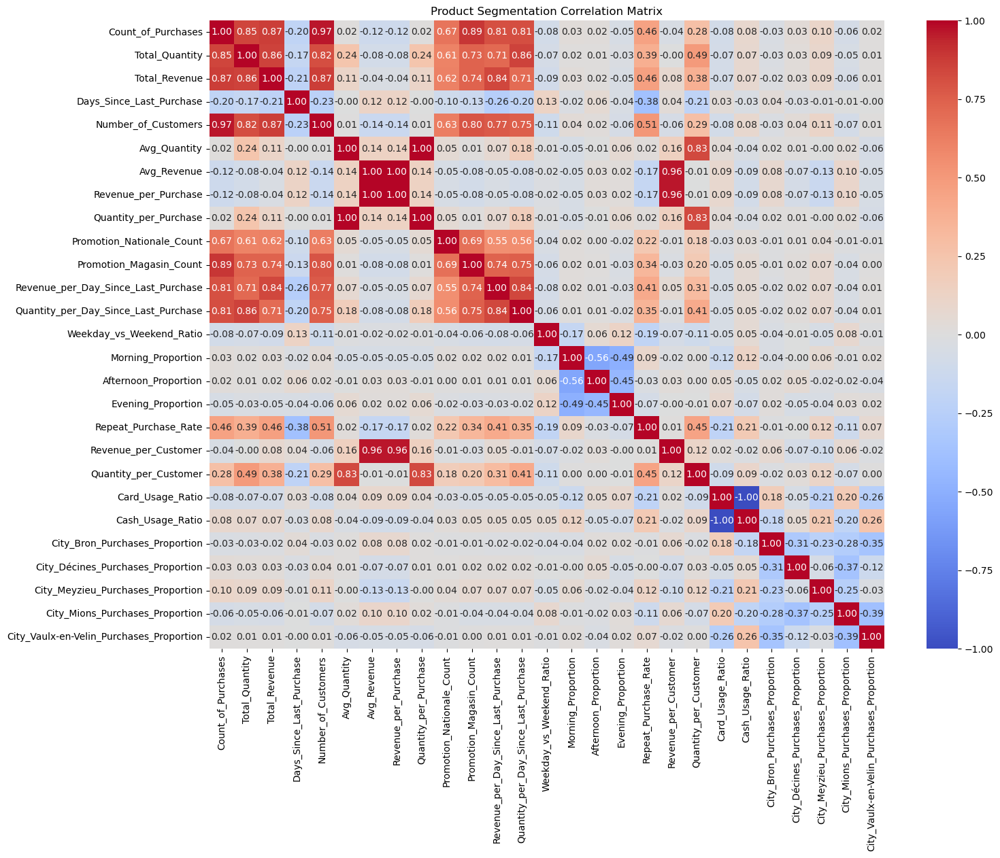

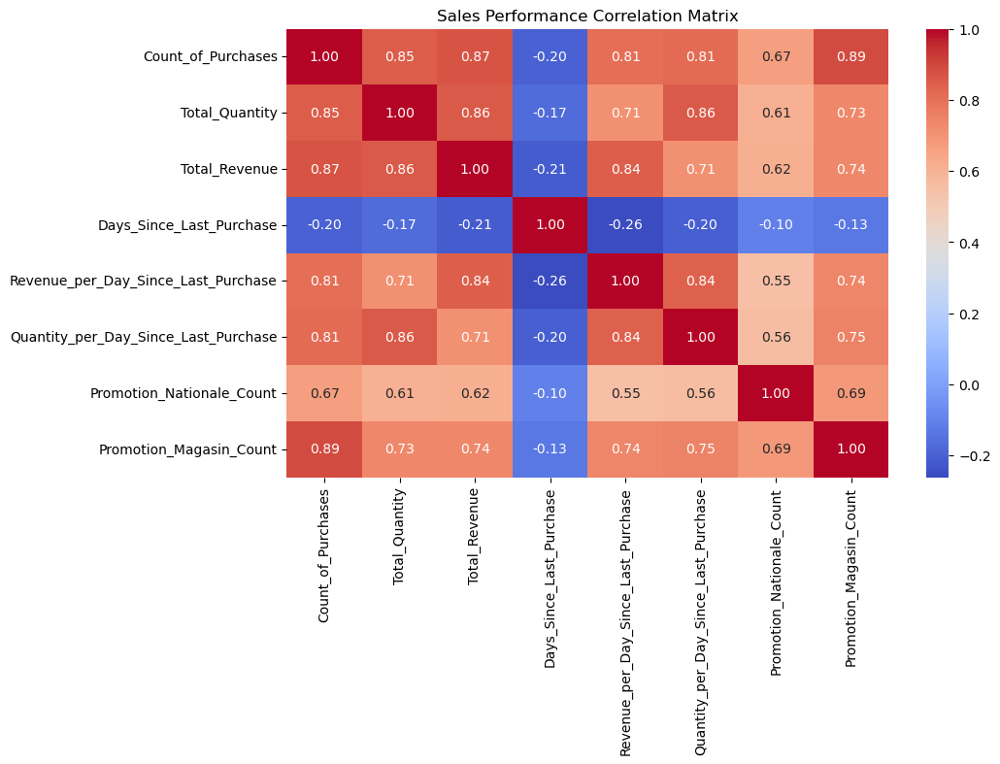

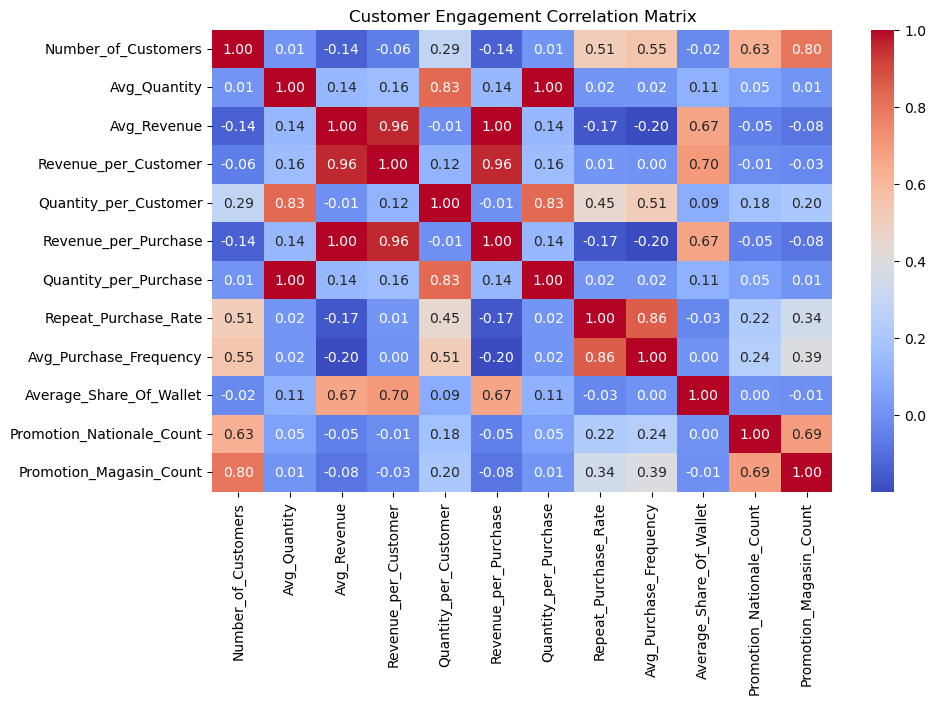

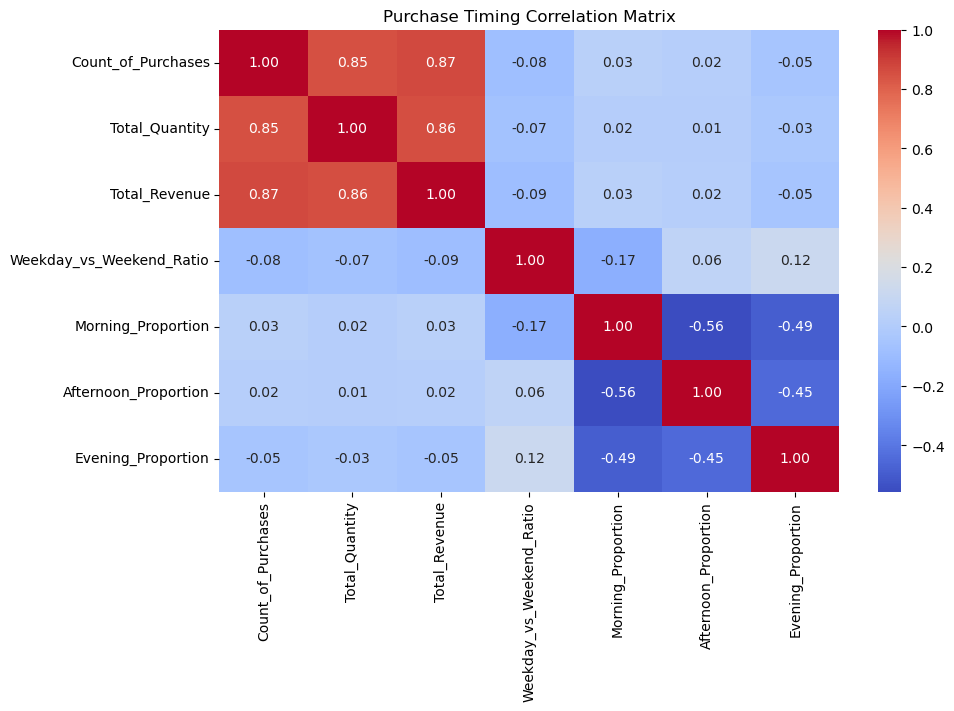

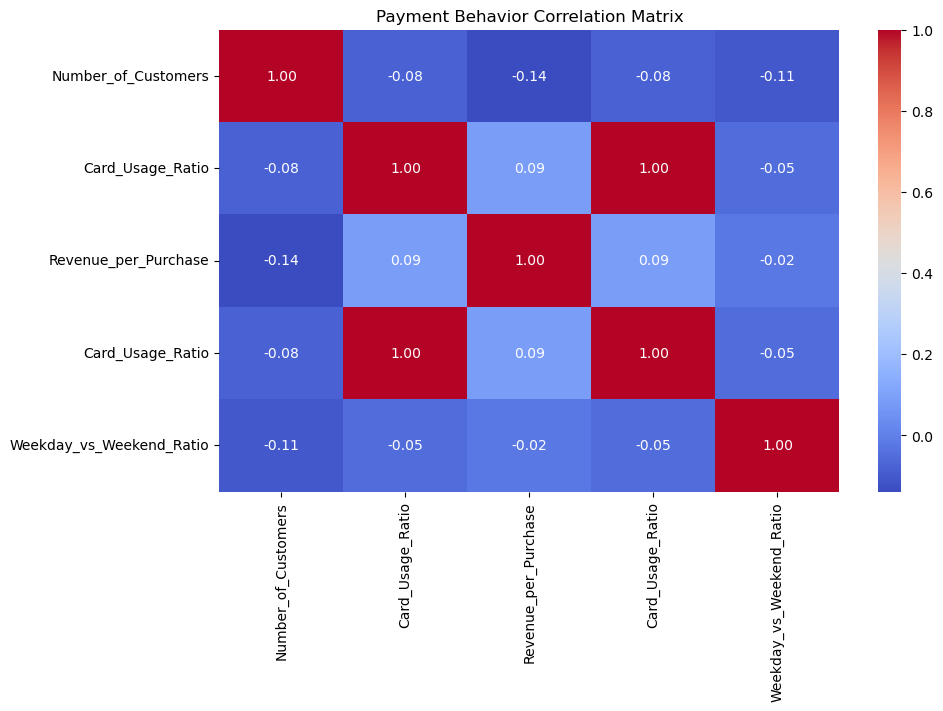

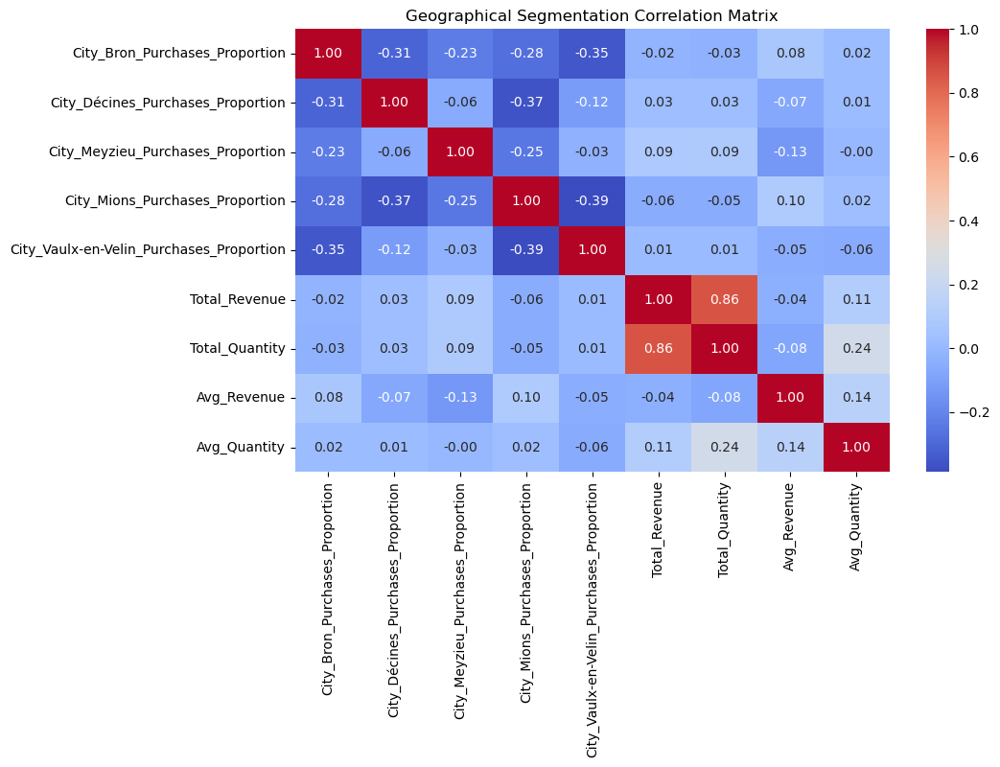

In [127]:
mod.plot_correlation_heatmap(
    df=product_segmentation_df, 
    figsize=(16, 12),  # Larger figure for better readability
    annot=True,  # Display correlation values
    cmap="coolwarm",  # Use a clear colormap
    fmt=".2f",  # Show numbers with 2 decimal places
    title="Product Segmentation Correlation Matrix"
)

mod.plot_correlation_heatmap(sales_performance_df, title="Sales Performance Correlation Matrix")
mod.plot_correlation_heatmap(customer_engagement_df, title="Customer Engagement Correlation Matrix")
mod.plot_correlation_heatmap(purchase_timing_df, title="Purchase Timing Correlation Matrix")
mod.plot_correlation_heatmap(payment_behavior_df, title="Payment Behavior Correlation Matrix")
mod.plot_correlation_heatmap(geographical_segmentation_df, title="Geographical Segmentation Correlation Matrix")



# Modeling

In [313]:
# List of DataFrames and their descriptive names
dfs = {
    "Sales Performance": sales_performance_df,
    "Customer Engagement": customer_engagement_df,
    "Purchase Timing": purchase_timing_df,
    "Payment Behavior": payment_behavior_df,
    "Geographical Segmentation": geographical_segmentation_df,
    "Product Segmentation": product_segmentation_df
}

# Loop through the dictionary and print the columns for each DataFrame
for df_name, df in dfs.items():
    print(f"{df_name} DataFrame Columns:")
    print(df.columns.tolist())
    print("-" * 50)


Sales Performance DataFrame Columns:
['Count_of_Purchases', 'Total_Quantity', 'Total_Revenue', 'Days_Since_Last_Purchase', 'Revenue_per_Day_Since_Last_Purchase', 'Quantity_per_Day_Since_Last_Purchase', 'Promotion_Nationale_Count', 'Promotion_Magasin_Count', 'sales_performance_segmentation']
--------------------------------------------------
Customer Engagement DataFrame Columns:
['Number_of_Customers', 'Avg_Quantity', 'Avg_Revenue', 'Revenue_per_Customer', 'Quantity_per_Customer', 'Revenue_per_Purchase', 'Quantity_per_Purchase', 'Repeat_Purchase_Rate', 'Avg_Purchase_Frequency', 'Average_Share_Of_Wallet', 'Promotion_Nationale_Count', 'Promotion_Magasin_Count', 'customer_engagement_segmentation']
--------------------------------------------------
Purchase Timing DataFrame Columns:
['Count_of_Purchases', 'Total_Quantity', 'Total_Revenue', 'Weekday_vs_Weekend_Ratio', 'Morning_Proportion', 'Afternoon_Proportion', 'Evening_Proportion', 'purchase_timing_segmentation']
------------------------

In [128]:
# Import necessary libraries
from sklearn.preprocessing import StandardScaler

if __name__ == "__main__":
    k_values = list(range(2, 10))  # Range of cluster values for K-Means, K-Medoids

    ### **1️⃣ Sales Performance Clustering**
    scaler = StandardScaler()
    scaled_features_sales = scaler.fit_transform(sales_performance_df)
    
    sales_results = mod.run_cluster_evaluation(scaled_features_sales, k_values, random_state=42)
    sales_comparison_df, sales_average_df = mod.create_comparison_df(sales_results, k_values)

    ### **2️⃣ Customer Engagement Clustering**
    scaled_features_customer = scaler.fit_transform(customer_engagement_df)
    
    customer_results = mod.run_cluster_evaluation(scaled_features_customer, k_values, random_state=42)
    customer_comparison_df, customer_average_df = mod.create_comparison_df(customer_results, k_values)

    ### **3️⃣ Purchase Timing Clustering**
    scaled_features_purchase = scaler.fit_transform(purchase_timing_df)
    
    purchase_results = mod.run_cluster_evaluation(scaled_features_purchase, k_values, random_state=42)
    purchase_comparison_df, purchase_average_df = mod.create_comparison_df(purchase_results, k_values)

    ### **4️⃣ Payment Behavior Clustering**
    scaled_features_payment = scaler.fit_transform(payment_behavior_df)
    
    payment_results = mod.run_cluster_evaluation(scaled_features_payment, k_values, random_state=42)
    payment_comparison_df, payment_average_df = mod.create_comparison_df(payment_results, k_values)

    ### **5️⃣  Geographical Segmentation Clustering (Newly Added)**
    scaled_features_geographical = scaler.fit_transform(geographical_segmentation_df)  

    geographical_results = mod.run_cluster_evaluation(scaled_features_geographical, k_values, random_state=42)
    geographical_comparison_df, geographical_average_df = mod.create_comparison_df(geographical_results, k_values)

    ### **6️⃣ Product Segmentation Clustering**
    scaled_features_product = scaler.fit_transform(product_segmentation_df)
    
    product_results = mod.run_cluster_evaluation(scaled_features_product, k_values, random_state=42)
    product_comparison_df, product_average_df = mod.create_comparison_df(product_results, k_values)


In [317]:
from IPython.display import display

print("Sales Performance Clustering")
display(sales_comparison_df)

print("\nCustomer Engagement Clustering")
display(customer_comparison_df)

print("\nPurchase Timing Clustering")
display(purchase_comparison_df)

print("\nPayment Behavior Clustering")
display(payment_comparison_df)

print("\nGeographical Segmentation Clustering")
display(geographical_comparison_df)

print("\nOverall Product Segmentation Clustering")
display(product_comparison_df)


Sales Performance Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,18075.727320,0.826273,7414.900570,0.262439,809.293000,0.683737,0.610215
1,3,12265.554841,0.809333,6046.925158,0.424722,443.568786,0.737699,0.702998
2,4,9305.652446,0.485951,5894.544555,0.348492,354.234958,0.677478,0.666354
3,5,7106.530786,0.526807,5086.942592,0.334301,305.414699,0.674462,0.647983
4,6,6515.700659,0.527613,4905.123148,0.335116,266.669630,0.692955,0.673184
5,7,5817.196382,0.532748,4663.436150,0.317546,258.745972,0.565161,0.660631
6,8,5054.065926,0.532352,4308.741177,0.319735,214.661659,0.607744,0.650804
7,9,4653.993827,0.531797,4250.755231,0.305179,198.017160,0.556718,0.643069



Customer Engagement Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,35714.461795,0.521790,17589.333784,0.247085,1454.572929,0.462276,0.354462
1,3,31297.280583,0.343984,16009.197438,0.197260,1000.700847,0.503426,0.437563
2,4,26551.226837,0.364217,15223.317962,0.156659,908.759734,0.413034,0.430422
3,5,23603.836639,0.287203,14606.303319,0.097489,811.521125,0.394027,0.421288
4,6,20634.701176,0.290185,14172.261341,0.093401,724.153927,0.360890,0.420155
5,7,17324.421224,0.288435,13700.439949,0.079219,650.571744,0.383635,0.415976
6,8,15714.033621,0.236211,13490.736696,0.081067,673.998490,0.283607,0.405995
7,9,13807.144278,0.307620,12795.335942,0.092730,596.179464,0.317708,0.403572



Purchase Timing Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,21149.679345,0.610810,9770.537457,0.167592,1457.700662,0.422481,0.337543
1,3,16169.580556,0.651837,8897.437041,0.180469,993.223697,0.492834,0.439307
2,4,14401.882537,0.224428,8445.844959,0.064835,762.029186,0.508401,0.471540
3,5,11244.880739,0.643516,8052.803379,0.058821,661.508726,0.480137,0.480400
4,6,9008.491342,0.641451,7663.290966,0.045017,587.532287,0.449971,0.429901
5,7,8107.620838,0.246282,6981.832828,0.146669,534.648358,0.421613,0.421460
6,8,7152.280676,0.264195,6800.523852,0.078328,513.676503,0.413713,0.403930
7,9,6579.429106,0.264315,6746.477245,0.102680,459.602851,0.413004,0.384960



Payment Behavior Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,13408.234722,0.713182,7235.235884,0.262056,1351.229120,0.480033,0.380081
1,3,11309.593296,0.306693,6962.272771,0.221291,1050.698138,0.490935,0.422933
2,4,8932.606445,0.457802,6402.498919,0.131862,755.980197,0.506249,0.500868
3,5,7386.537907,0.324585,6055.732441,0.114065,530.166193,0.587245,0.567881
4,6,6047.379107,0.438199,5436.261326,0.173646,440.572566,0.567926,0.540469
5,7,5344.350260,0.321488,5371.575015,0.164885,406.637152,0.543364,0.485166
6,8,4998.771067,0.332462,5103.355874,0.130500,385.663837,0.521037,0.491984
7,9,4497.713059,0.355276,5024.878896,0.103320,357.317785,0.463674,0.451297



Geographical Segmentation Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,27776.423317,0.294668,14998.769001,0.186941,1950.843659,0.296686,0.214872
1,3,25041.443245,0.424378,14529.275779,0.073999,1736.045558,0.251278,0.249060
2,4,22324.146734,0.385754,13602.436167,0.098667,1518.755255,0.247711,0.273453
3,5,19844.054263,0.318138,13129.558376,0.067915,1356.743447,0.272676,0.274579
4,6,18325.888571,0.414546,12154.834950,0.123466,1160.210757,0.310686,0.311255
5,7,15996.283868,0.355213,11828.618676,0.131674,1016.059386,0.346105,0.332541
6,8,14115.048286,0.338960,11246.853930,0.154863,903.065076,0.368290,0.353827
7,9,12283.538687,0.348141,11025.223741,0.120455,963.129258,0.291642,0.381108



Overall Product Segmentation Clustering


,k,kmeans_inertia,kmeans_silhouette,kmedoids_manhattan_cost,kmedoids_manhattan_silhouette,kmedoids_cosine_cost,kmedoids_cosine_silhouette,spectral_silhouette
0,2,80812.269216,0.576539,43689.809519,0.141540,2214.306314,0.226480,0.159439
1,3,74525.335729,0.484441,42143.967161,0.083194,2049.191662,0.170601,0.168381
2,4,69440.791954,0.100176,42078.350004,0.052613,1852.965036,0.178743,0.175966
3,5,65859.325302,0.077142,41309.527648,0.044425,1648.797111,0.202100,0.209487
4,6,61939.965005,0.097841,40754.349721,-0.013474,1653.486372,0.165513,0.216295
5,7,59326.848897,0.085028,39012.649559,-0.031054,1669.832305,0.133750,0.231381
6,8,56747.050093,0.129278,38255.691273,-0.030882,1523.261690,0.152665,0.237101
7,9,54173.859911,0.103581,38106.240434,-0.060267,1397.450632,0.166541,0.239260


In [316]:
from IPython.display import display
print("Sales Performance Clustering")
display(sales_average_df)
print("\nCustomer Engagement Clustering")
display(customer_average_df)
print("\nPurchase Timing Clustering")
display(purchase_average_df)
print("\nPayment Behavior Clustering")
display(payment_average_df)
print("\nGeographical Segmentation Clustering")
display(geographical_average_df)
print("\nOverall Product Segmentation Clustering")
display(product_average_df)


Sales Performance Clustering


,Metric,Average Value
0,kmeans_inertia,8599.302773
1,kmeans_silhouette,0.596609
2,kmedoids_manhattan_cost,5321.421073
3,kmedoids_manhattan_silhouette,0.330941
4,kmedoids_cosine_cost,356.325733
5,kmedoids_cosine_silhouette,0.649494
6,spectral_silhouette,0.656905



Customer Engagement Clustering


,Metric,Average Value
0,kmeans_inertia,23080.888269
1,kmeans_silhouette,0.329956
2,kmedoids_manhattan_cost,14698.365804
3,kmedoids_manhattan_silhouette,0.130614
4,kmedoids_cosine_cost,852.557283
5,kmedoids_cosine_silhouette,0.389825
6,spectral_silhouette,0.411179



Purchase Timing Clustering


,Metric,Average Value
0,kmeans_inertia,11726.730642
1,kmeans_silhouette,0.443354
2,kmedoids_manhattan_cost,7919.843466
3,kmedoids_manhattan_silhouette,0.105551
4,kmedoids_cosine_cost,746.240284
5,kmedoids_cosine_silhouette,0.450269
6,spectral_silhouette,0.421130



Payment Behavior Clustering


,Metric,Average Value
0,kmeans_inertia,7740.648233
1,kmeans_silhouette,0.406211
2,kmedoids_manhattan_cost,5948.976391
3,kmedoids_manhattan_silhouette,0.162703
4,kmedoids_cosine_cost,659.783124
5,kmedoids_cosine_silhouette,0.520058
6,spectral_silhouette,0.480085



Geographical Segmentation Clustering


,Metric,Average Value
0,kmeans_inertia,19463.353371
1,kmeans_silhouette,0.359975
2,kmedoids_manhattan_cost,12814.446327
3,kmedoids_manhattan_silhouette,0.119747
4,kmedoids_cosine_cost,1325.606550
5,kmedoids_cosine_silhouette,0.298134
6,spectral_silhouette,0.298837



Overall Product Segmentation Clustering


,Metric,Average Value
0,kmeans_inertia,65353.180763
1,kmeans_silhouette,0.206753
2,kmedoids_manhattan_cost,40668.823165
3,kmedoids_manhattan_silhouette,0.023262
4,kmedoids_cosine_cost,1751.161390
5,kmedoids_cosine_silhouette,0.174549
6,spectral_silhouette,0.204664


### Sales Segmentation Modeling

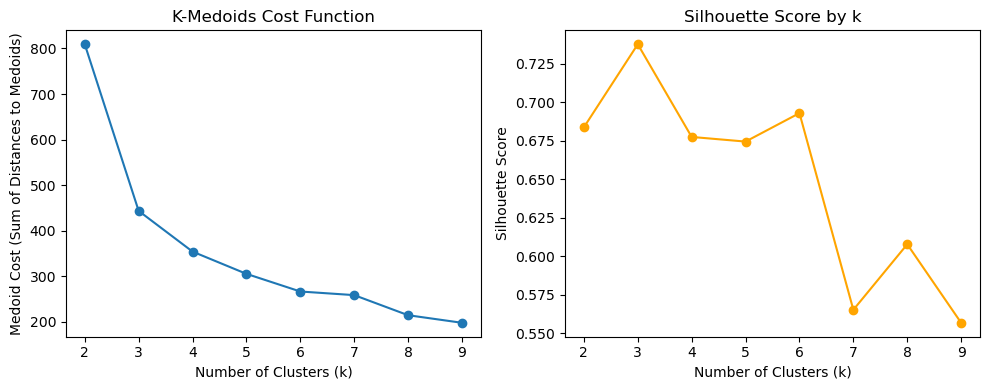

In [132]:
# SALES PERFORMANCE DOMAIN
sales_medoid_costs = sales_results['kmedoids_cosine']['medoid_costs']
sales_silhouette_scores = sales_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, sales_medoid_costs, sales_silhouette_scores)

Average Silhouette Score (KMedoids): 0.7377


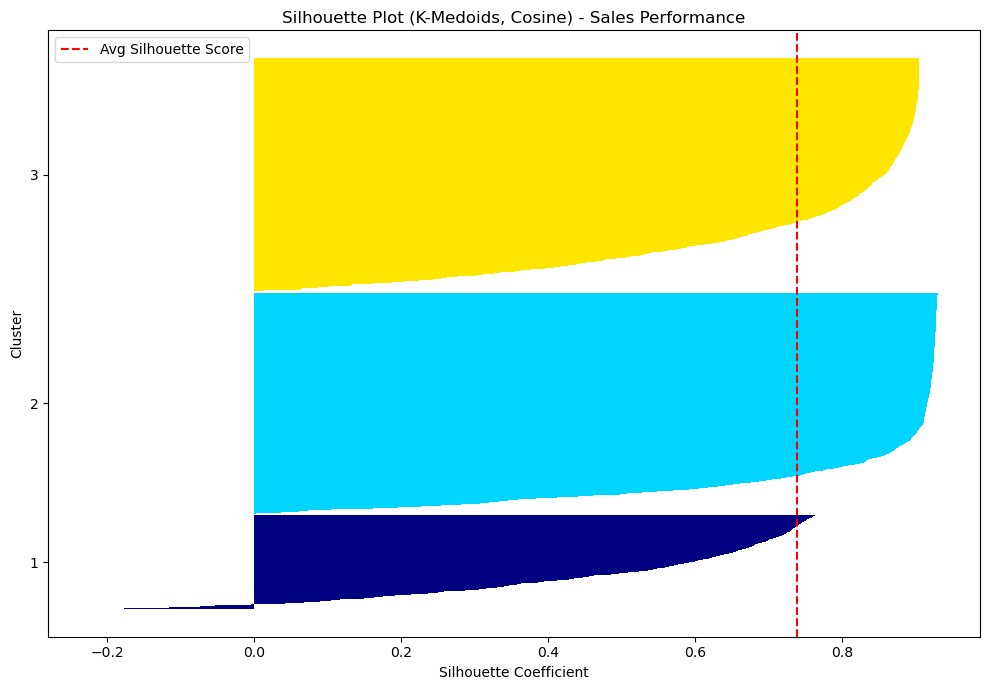

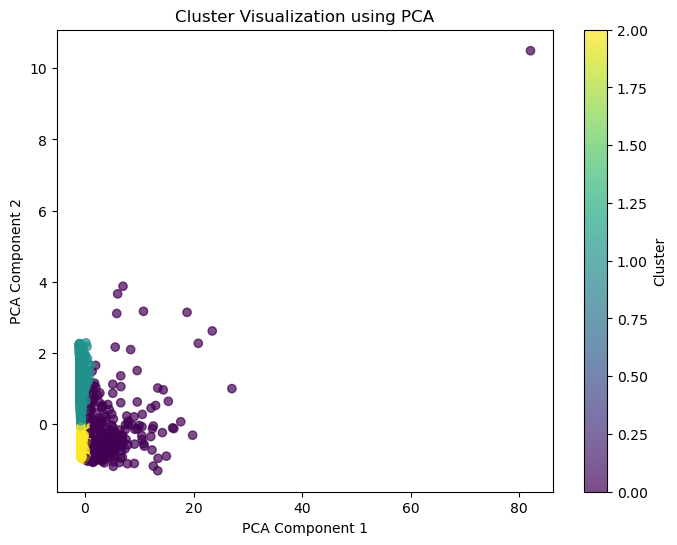

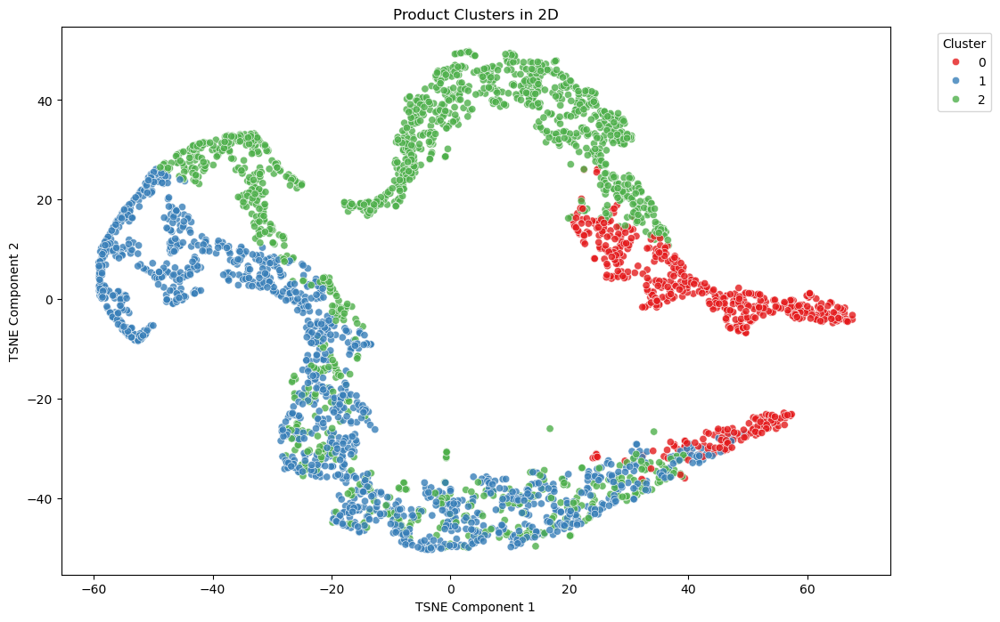

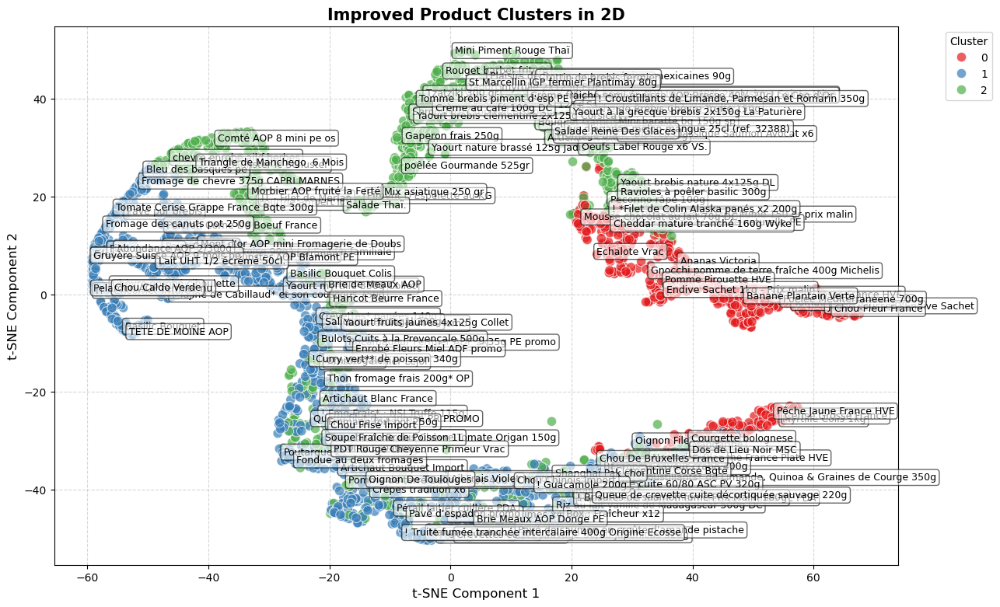

In [133]:
sales_kmedoids_cosine = mod.KMedoids(n_clusters=3, metric='precomputed', random_state=42)
sales_cluster_labels, sales_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=sales_kmedoids_cosine,
    scaled_features=scaled_features_sales,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Sales Performance"
)

mod.plot_pca_clusters(scaled_features_sales, sales_cluster_labels)
mod.plot_product_clusters(sales_performance_df, sales_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(sales_performance_df, sales_cluster_labels)


### Customer Engagement Segmentation Modeling

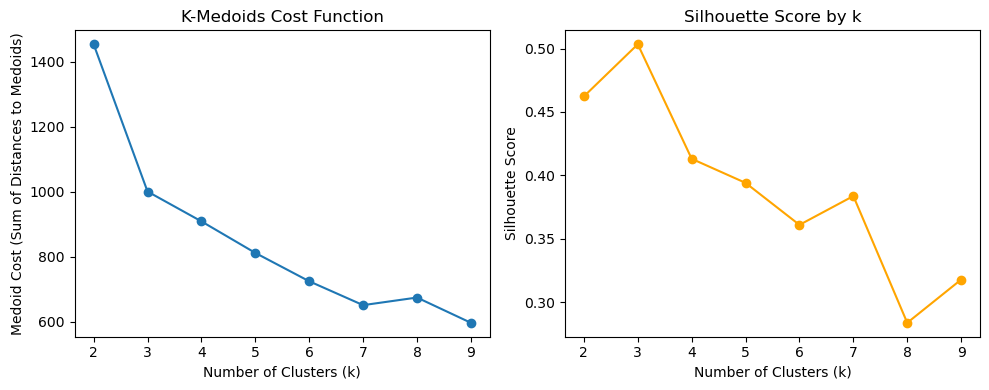

In [134]:
# CUSTOMER ENGAGEMENT DOMAIN
customer_medoid_costs = customer_results['kmedoids_cosine']['medoid_costs']
customer_silhouette_scores = customer_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, customer_medoid_costs, customer_silhouette_scores)

Average Silhouette Score (KMedoids): 0.5034


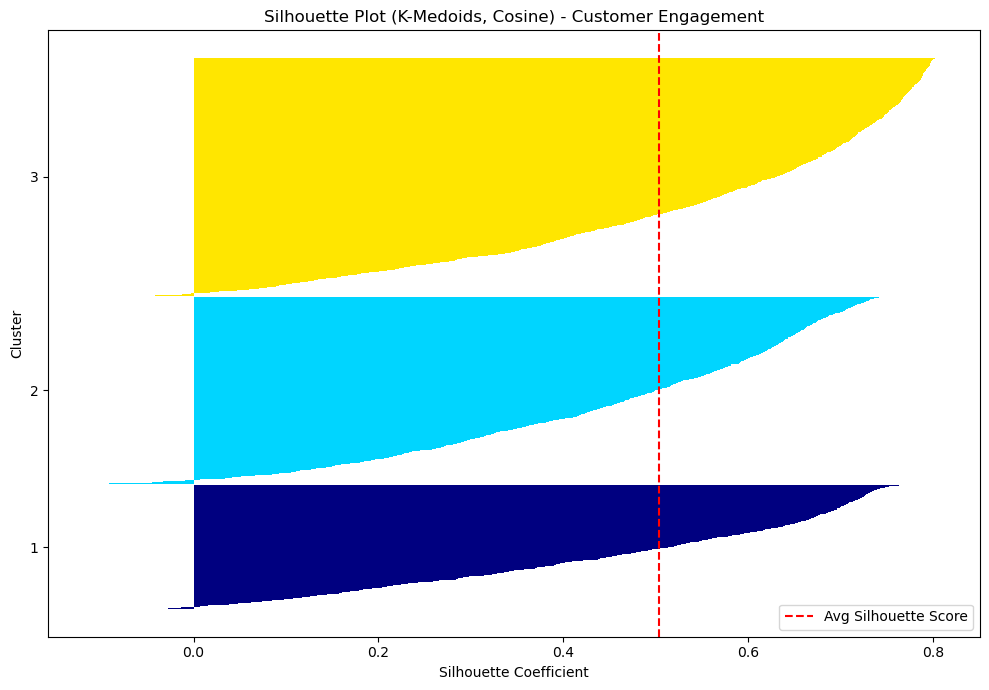

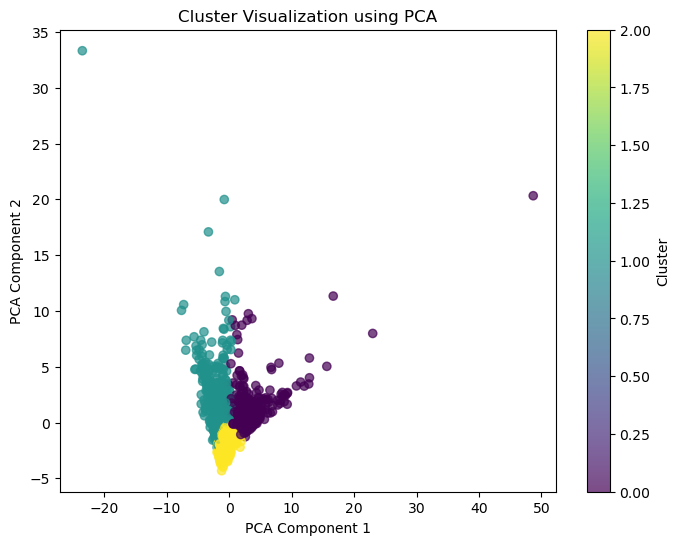

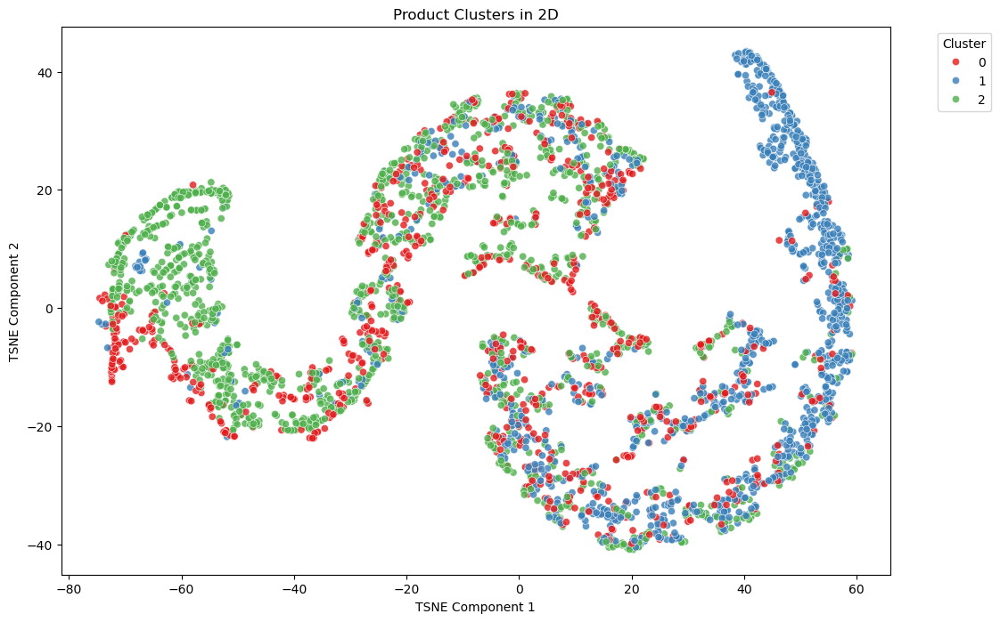

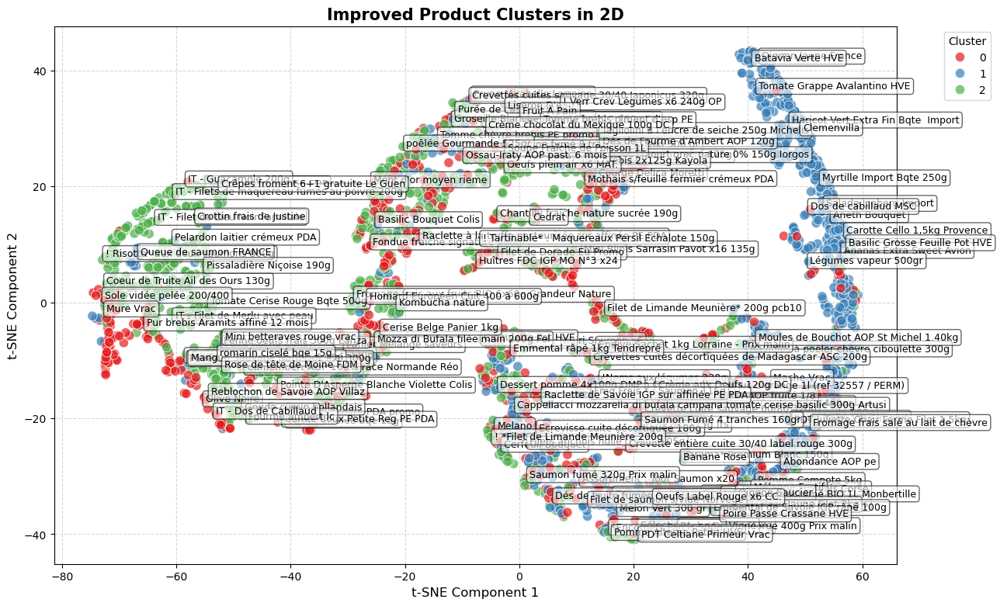

In [135]:

customer_kmedoids_cosine = mod.KMedoids(n_clusters=3, metric='precomputed', random_state=42)
customer_cluster_labels, customer_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=customer_kmedoids_cosine,
    scaled_features=scaled_features_customer,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Customer Engagement"
)

mod.plot_pca_clusters(scaled_features_customer, customer_cluster_labels)
mod.plot_product_clusters(customer_engagement_df, customer_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(customer_engagement_df, customer_cluster_labels)


### Purchase Timing Segementation Modeling

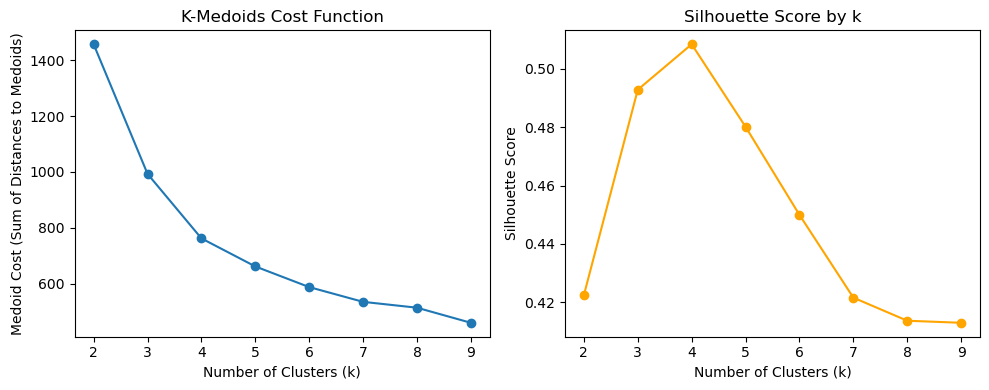

In [140]:
# PURCHASE TIMING DOMAIN
purchase_medoid_costs = purchase_results['kmedoids_cosine']['medoid_costs']
purchase_silhouette_scores = purchase_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, purchase_medoid_costs, purchase_silhouette_scores)

Average Silhouette Score (KMedoids): 0.5084


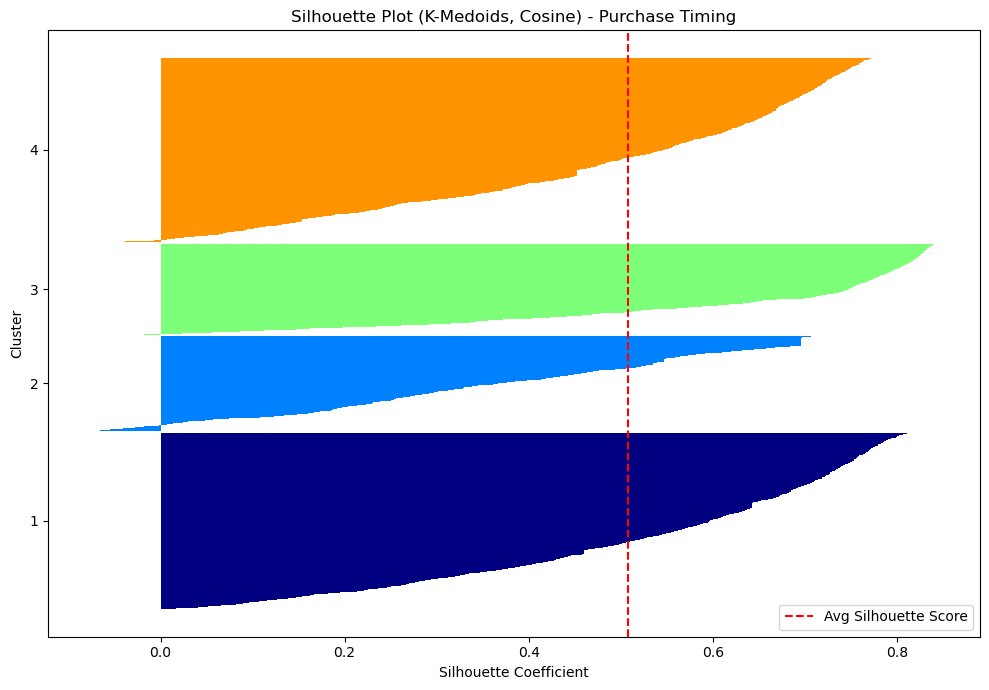

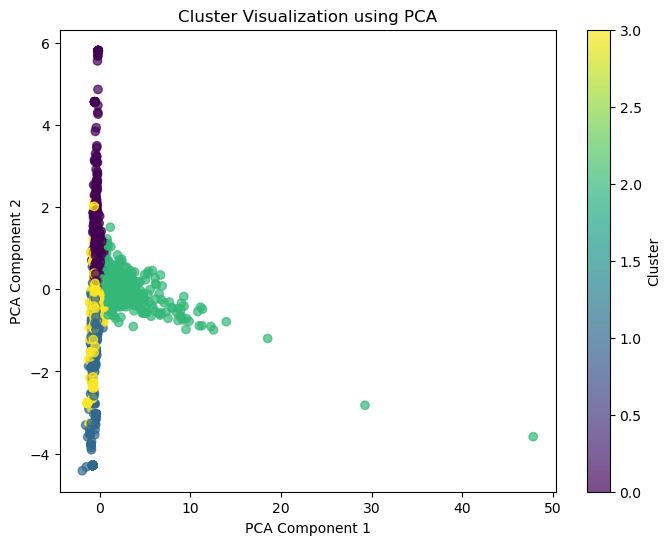

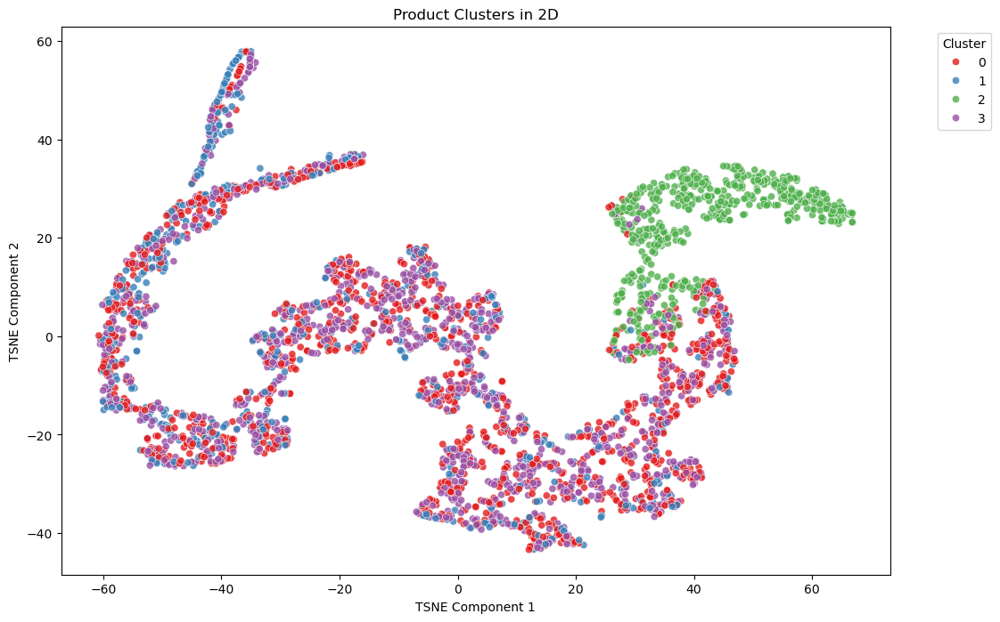

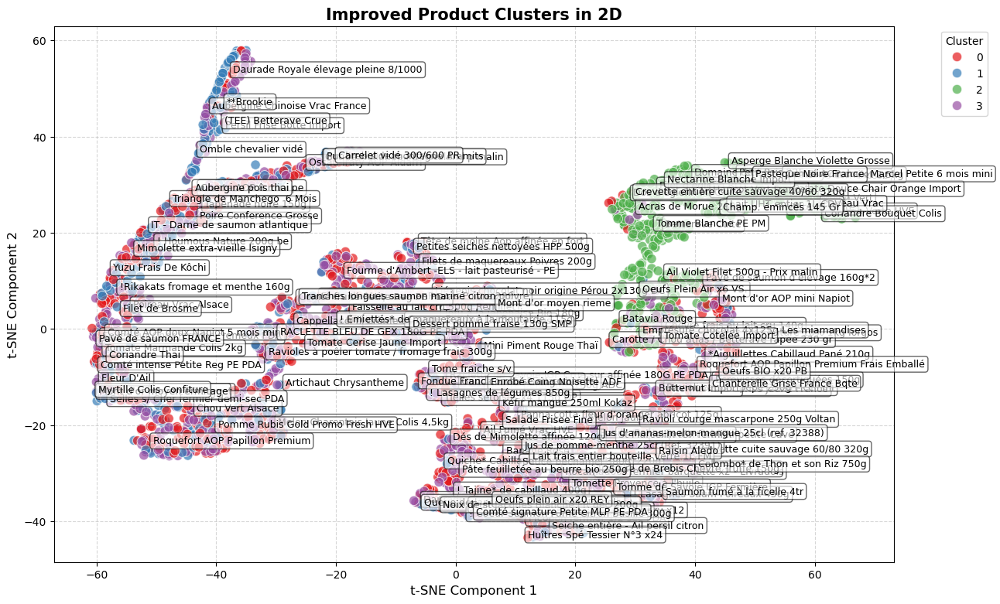

In [141]:

purchase_kmedoids_cosine = mod.KMedoids(n_clusters=4, metric='precomputed', random_state=42)
purchase_cluster_labels, purchase_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=purchase_kmedoids_cosine,
    scaled_features=scaled_features_purchase,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Purchase Timing"
)

mod.plot_pca_clusters(scaled_features_purchase, purchase_cluster_labels)
mod.plot_product_clusters(purchase_timing_df, purchase_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(purchase_timing_df, purchase_cluster_labels)


### Payment Segmentation Modeling

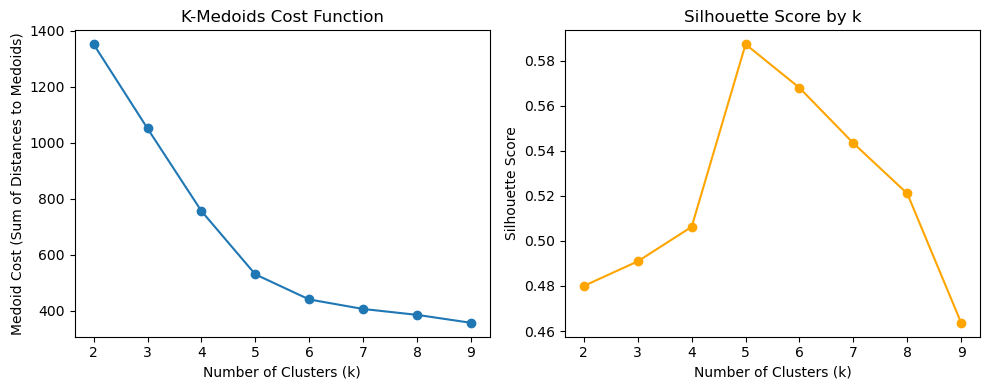

In [318]:
# PAYMENT BEHAVIOR DOMAIN
payment_medoid_costs = payment_results['kmedoids_cosine']['medoid_costs']
payment_silhouette_scores = payment_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, payment_medoid_costs, payment_silhouette_scores)

Average Silhouette Score (KMedoids): 0.5872


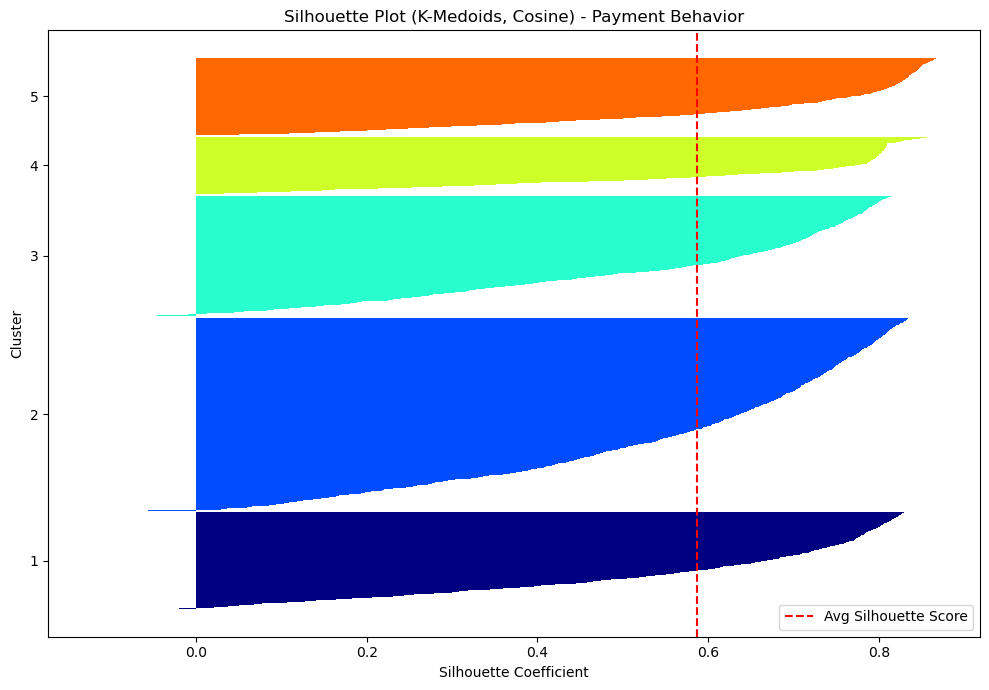

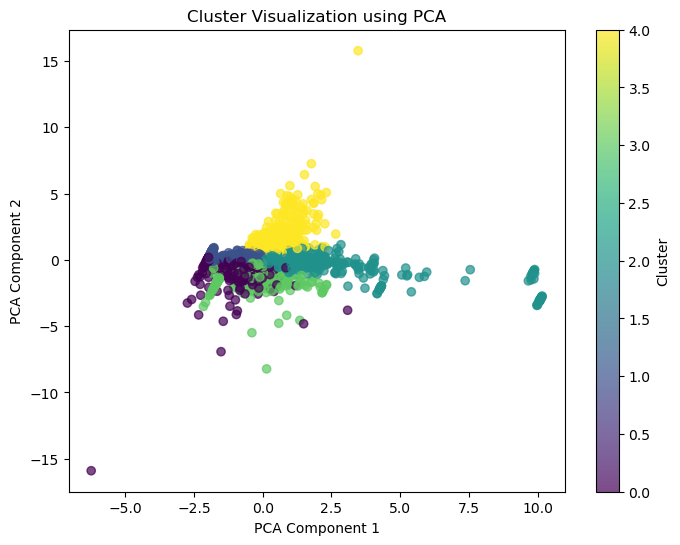

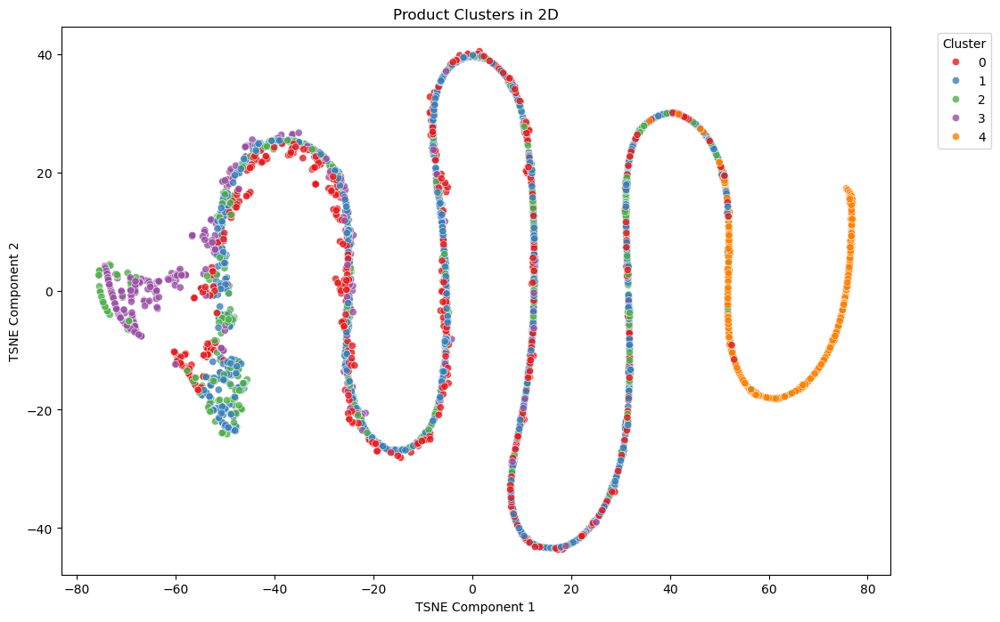

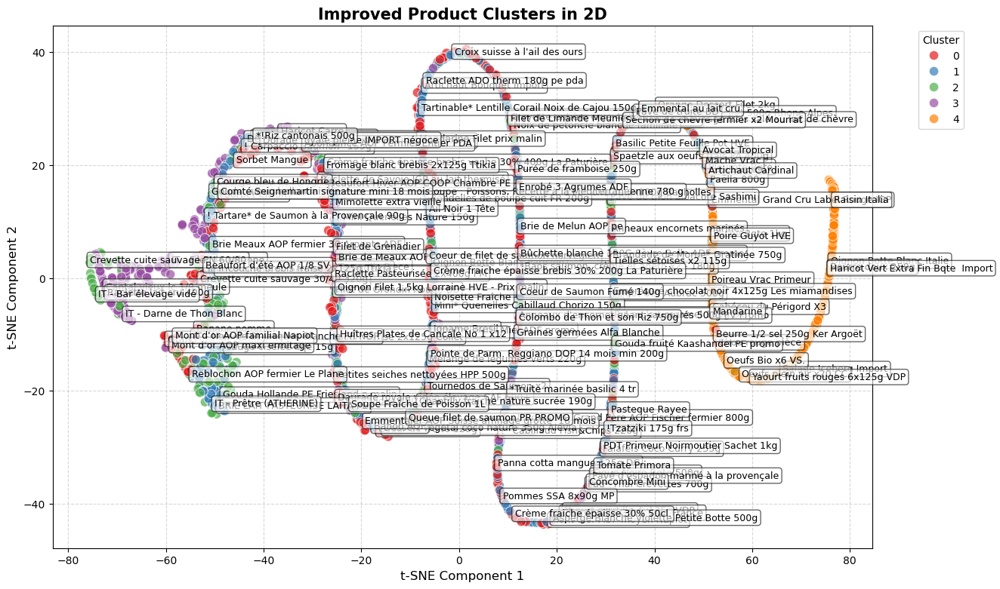

In [319]:

payment_kmedoids_cosine = mod.KMedoids(n_clusters=5, metric='precomputed', random_state=42)
payment_cluster_labels, payment_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=payment_kmedoids_cosine,
    scaled_features=scaled_features_payment,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Payment Behavior"
)

mod.plot_pca_clusters(scaled_features_payment, payment_cluster_labels)
mod.plot_product_clusters(payment_behavior_df, payment_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(payment_behavior_df, payment_cluster_labels)


In [212]:
imp.reload(mod)

<module 'models' from 'e:\\Prosol\\models.py'>

### Geography Segmentation  Modeling

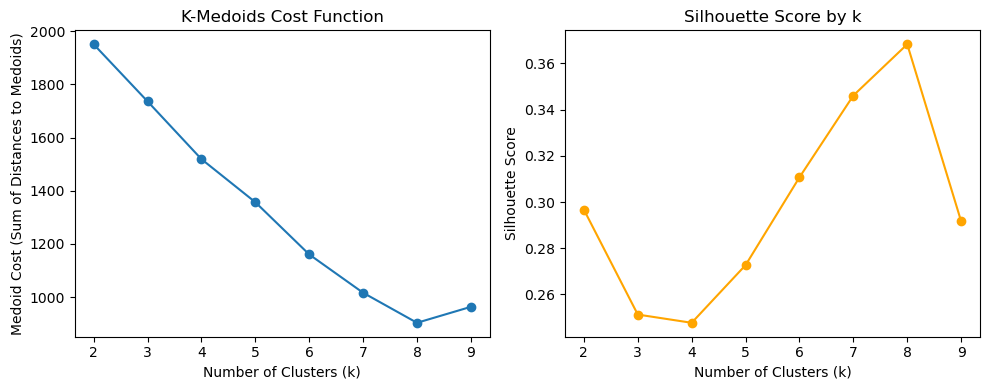

In [145]:
geography_medoid_costs = geographical_results['kmedoids_cosine']['medoid_costs']
geography_silhouette_scores = geographical_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, geography_medoid_costs, geography_silhouette_scores)


Average Silhouette Score (KMedoids): 0.3683


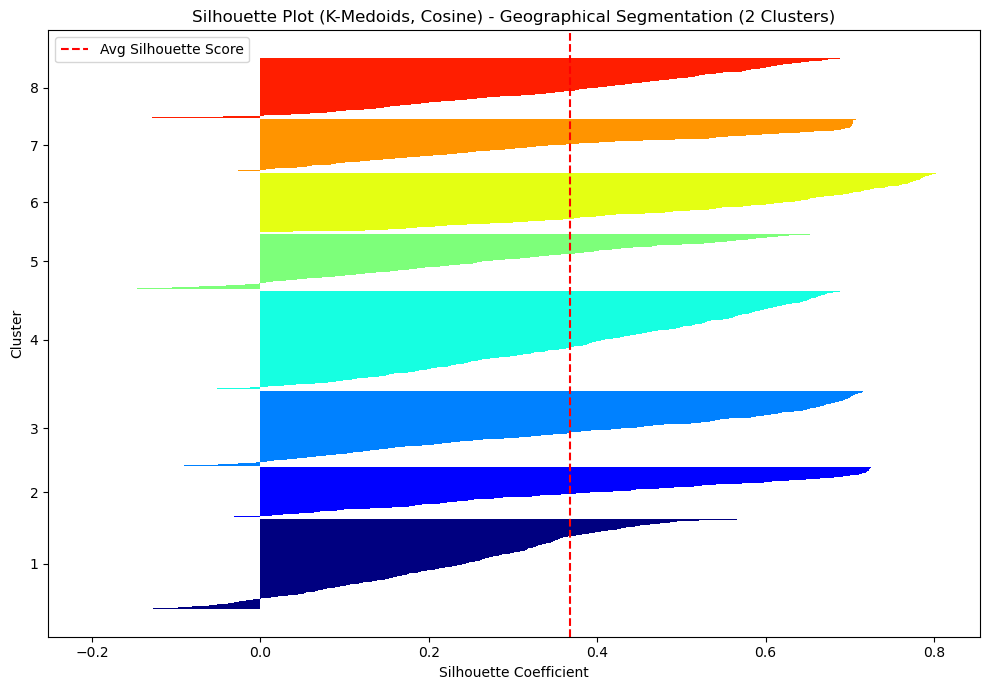

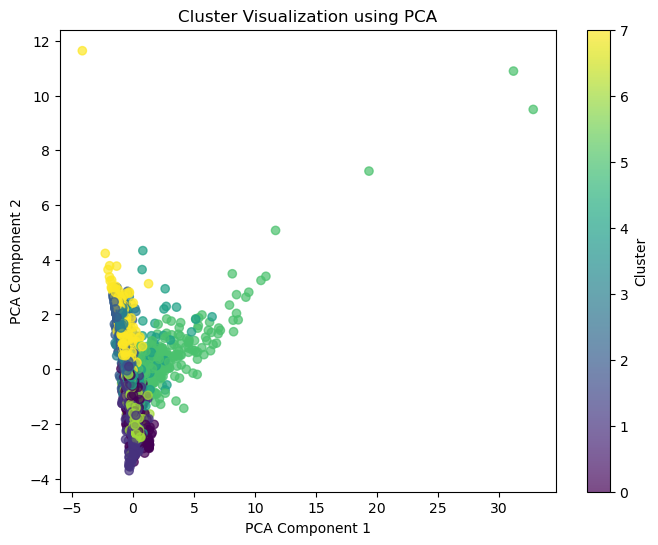

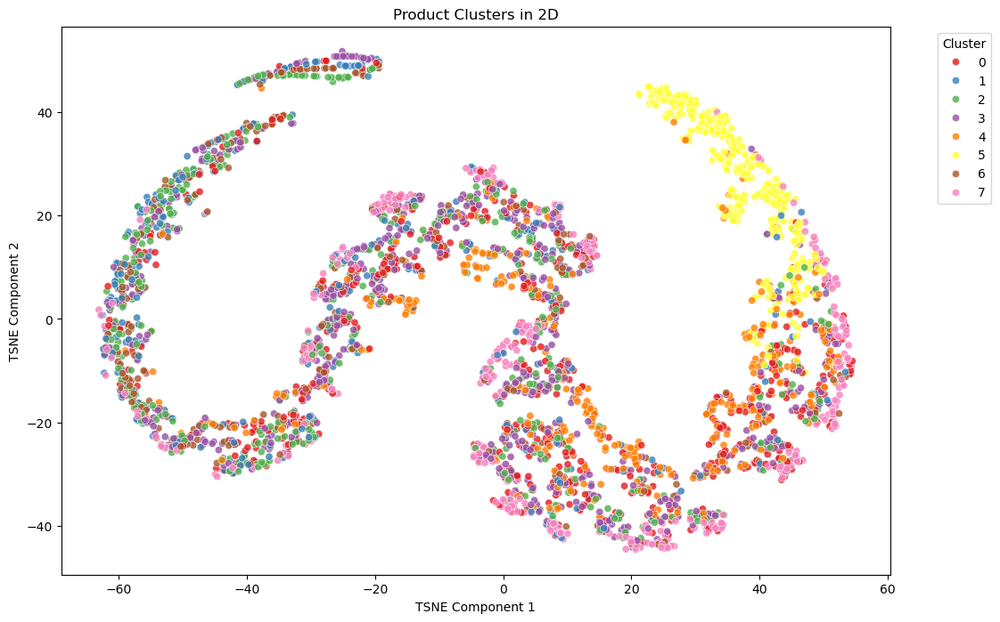

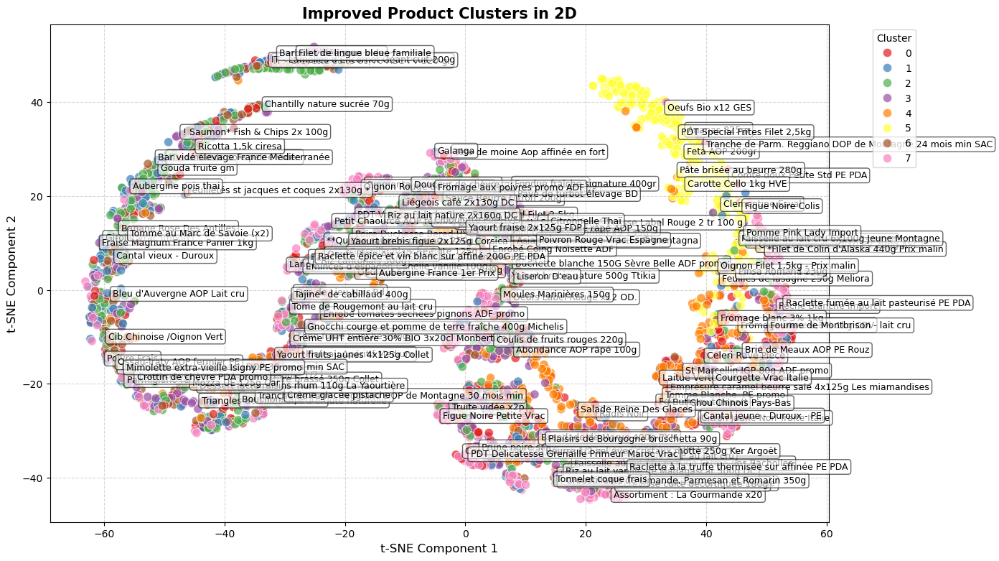

In [147]:
# ----- Geographical Segmentation with 2 Clusters -----
geography_kmedoids_cosine = mod.KMedoids(n_clusters=8, metric='precomputed', random_state=42)
geography_cluster_labels, geography_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=geography_kmedoids_cosine,
    scaled_features=scaled_features_geographical,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Geographical Segmentation (2 Clusters)"
)

# Visualizations for 2 clusters
mod.plot_pca_clusters(scaled_features_geographical, geography_cluster_labels)
mod.plot_product_clusters(geographical_segmentation_df, geography_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(geographical_segmentation_df, geography_cluster_labels)

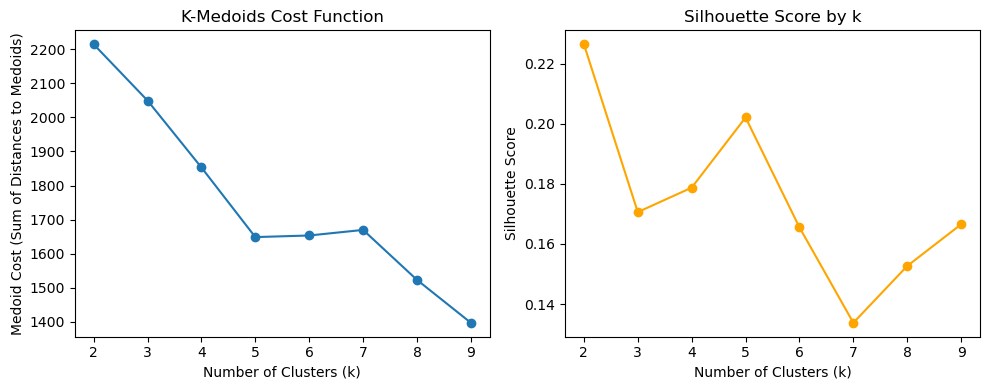

In [149]:
# PRODUCT SEGMENTATION DOMAIN (Combined Data)
product_medoid_costs = product_results['kmedoids_cosine']['medoid_costs']
product_silhouette_scores = product_results['kmedoids_cosine']['silhouette_scores']
mod.plot_elbow_silhoutte(k_values, product_medoid_costs, product_silhouette_scores)

Average Silhouette Score (KMedoids): 0.2021


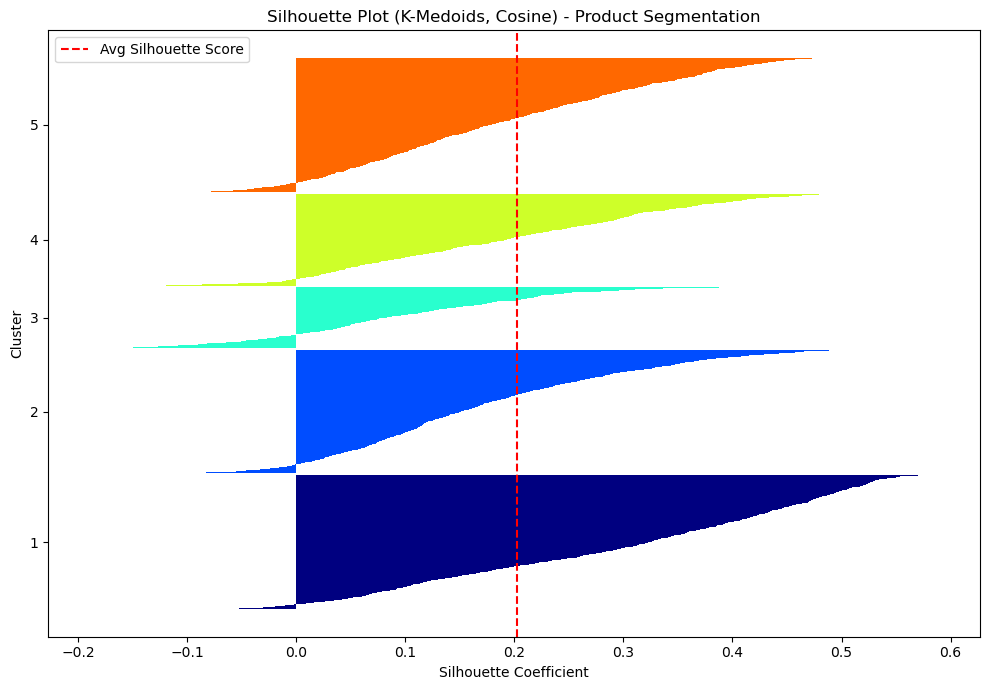

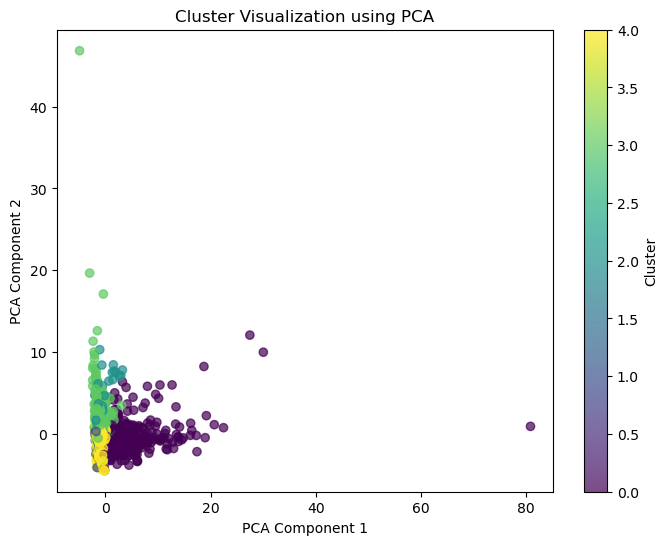

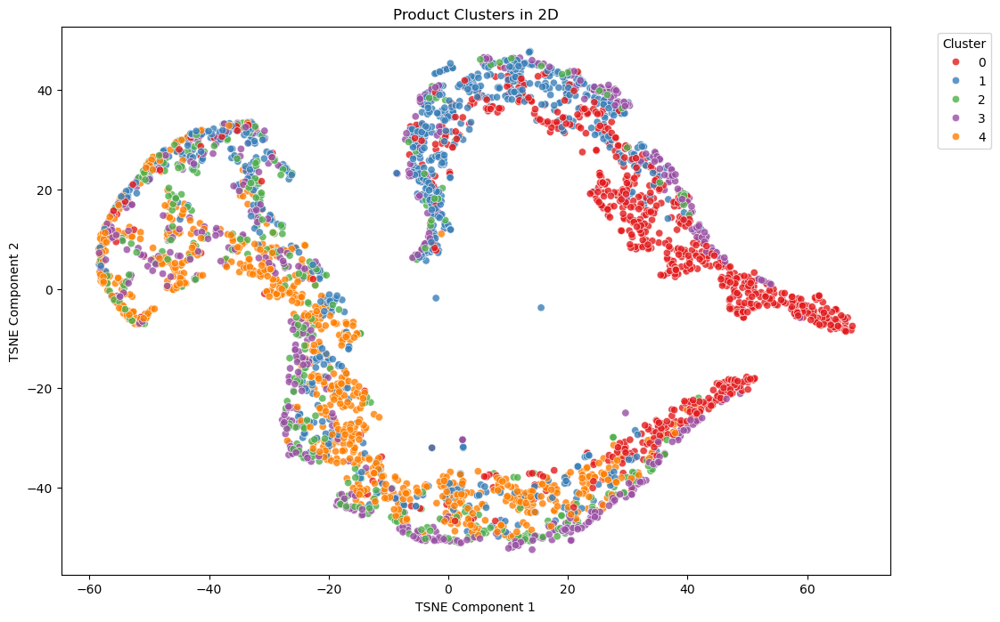

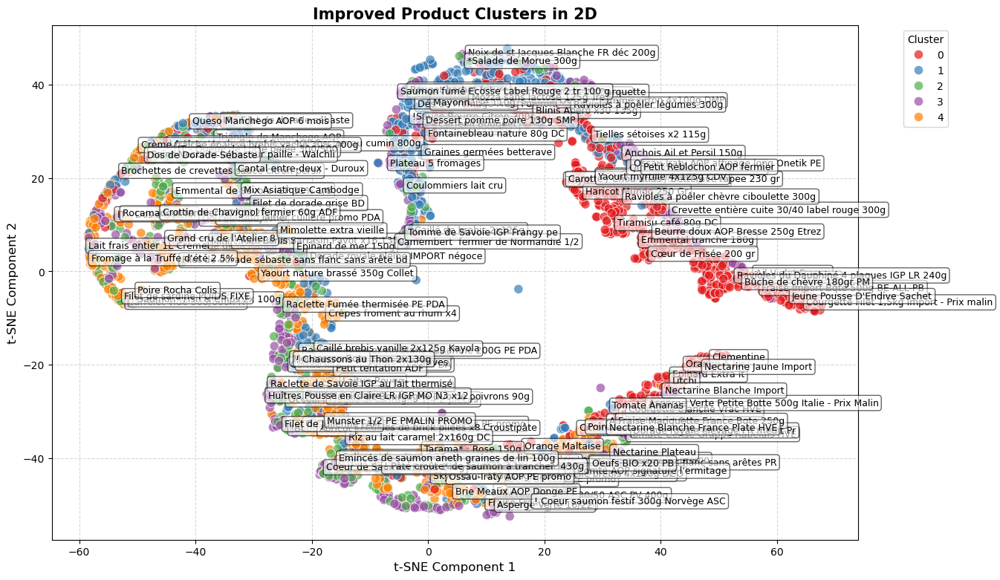

In [150]:


product_kmedoids_cosine = mod.KMedoids(n_clusters=5, metric='precomputed', random_state=42)
product_cluster_labels, product_silhouette_avg = mod.compute_cluster_and_silhouette(
    model=product_kmedoids_cosine,
    scaled_features=scaled_features_product,
    transformation="cosine",
    title="Silhouette Plot (K-Medoids, Cosine) - Product Segmentation"
)

mod.plot_pca_clusters(scaled_features_product, product_cluster_labels)
mod.plot_product_clusters(product_segmentation_df, product_cluster_labels, method="tsne",show_labels=False)
mod.improved_tsne_plot(product_segmentation_df, product_cluster_labels)


### Overall Product Segmentation Modeling

### Saving the clusters to product table

In [492]:
product_df["sales_performance_segmentation"] = sales_cluster_labels
product_df["customer_engagement_segmentation"] = customer_cluster_labels
product_df["purchase_timing_segmentation"] = purchase_cluster_labels
product_df["payment_behavior_segmentation"] = payment_cluster_labels
product_df["geographical_segmentation"] = geography_cluster_labels
product_df["product_segmentation"] = product_cluster_labels


In [493]:
product_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,0,1,2,4,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,0,1,2,4,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,2,2,0,1,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,0,1,2,4,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102,7.330701,2.176890,0.859102,0.140898,0.313711,0.284805,0.313711,0.179336,0.056563,0.284805,0.165586,0,1,2,4,0,5


In [494]:
# List of segmentation columns
segmentation_columns = [
    "sales_performance_segmentation",
    "customer_engagement_segmentation",
    "purchase_timing_segmentation",
    "payment_behavior_segmentation",
    "product_segmentation",
    "geographical_segmentation"
]

# Loop through and print cluster counts for each segmentation column
for col in segmentation_columns:
    print(f"Products counts for {col}:")
    print(product_df[col].value_counts())
    print("-" * 40)


Products counts for sales_performance_segmentation:
sales_performance_segmentation
2    1468
1    1386
0     591
Name: count, dtype: int64
----------------------------------------
Products counts for customer_engagement_segmentation:
customer_engagement_segmentation
2    1494
1    1173
0     778
Name: count, dtype: int64
----------------------------------------
Products counts for purchase_timing_segmentation:
purchase_timing_segmentation
3    1162
0    1113
1     598
2     572
Name: count, dtype: int64
----------------------------------------
Products counts for payment_behavior_segmentation:
payment_behavior_segmentation
1    1218
2     763
0     613
4     487
3     364
Name: count, dtype: int64
----------------------------------------
Products counts for product_segmentation:
product_segmentation
0    848
4    848
1    781
3    582
2    386
Name: count, dtype: int64
----------------------------------------
Products counts for geographical_segmentation:
geographical_segmentation
3   

In [495]:
product_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,0,1,2,4,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,0,1,2,4,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,2,2,0,1,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,0,1,2,4,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102,7.330701,2.176890,0.859102,0.140898,0.313711,0.284805,0.313711,0.179336,0.056563,0.284805,0.165586,0,1,2,4,0,5


In [496]:
import joblib
joblib.dump(product_df, './Data/product_clustered_df.joblib')


['./Data/product_clustered_df.joblib']

In [53]:
import joblib
product_df = joblib.load('./Data/product_clustered_df.joblib')

# Understanding the clusters

## Contingency and Correlation

In [54]:
segmentation_columns = [
    "sales_performance_segmentation",
    "customer_engagement_segmentation",
    "purchase_timing_segmentation",
    "payment_behavior_segmentation",
    "product_segmentation",
    "geographical_segmentation"
]

Cross-Tabulation: Sales Performance vs. Purchase Timing
purchase_timing_segmentation       0    1    2     3   All
sales_performance_segmentation                            
0                                 32    9  504    46   591
1                                494  369   48   475  1386
2                                587  220   20   641  1468
All                             1113  598  572  1162  3445

Cross-Tabulation: Customer Engagement vs. Purchase Timing
purchase_timing_segmentation         0    1    2     3   All
customer_engagement_segmentation                            
0                                  276  158   69   275   778
1                                  296   87  489   301  1173
2                                  541  353   14   586  1494
All                               1113  598  572  1162  3445

Spearman Correlation Matrix of Segmentation Labels:
                                  sales_performance_segmentation  \
sales_performance_segmentation              

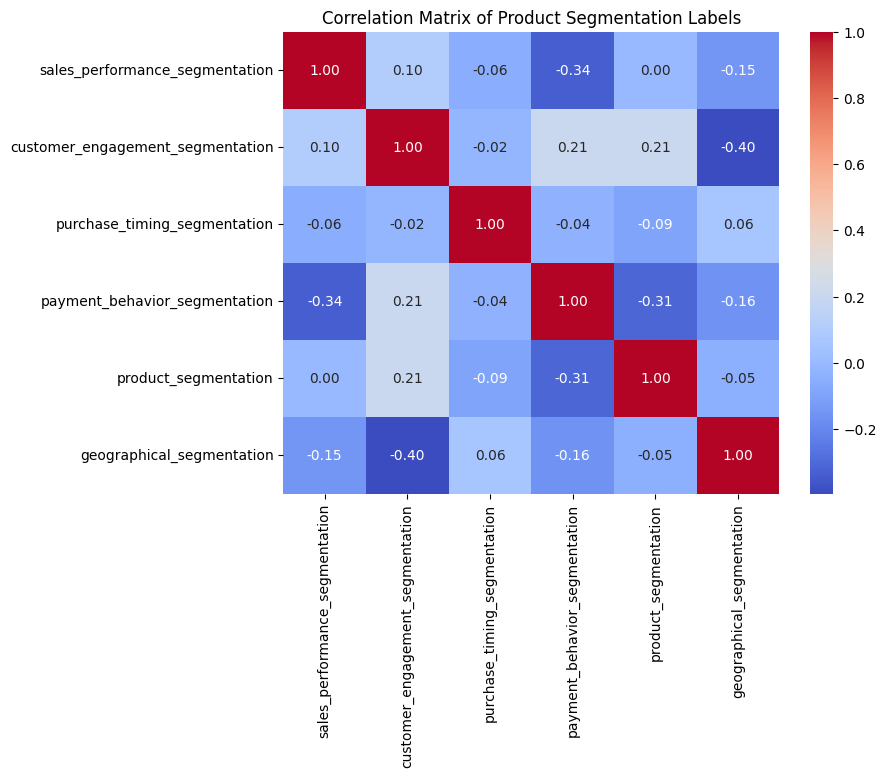

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assume your product_df already has the following segmentation labels:
# "sales_performance_segmentation"
# "customer_engagement_segmentation"
# "purchase_timing_segmentation"
# "payment_behavior_segmentation"
# "product_segmentation"

# -------------------------------
# 1. Cross-Tabulate Clusters
# -------------------------------

# Example: Cross-tab between Sales Performance and Purchase Timing segmentations
cross_tab_sales_timing = pd.crosstab(
    product_df["sales_performance_segmentation"],
    product_df["purchase_timing_segmentation"],
    margins=True  # Optional: adds row/column totals
)

print("Cross-Tabulation: Sales Performance vs. Purchase Timing")
print(cross_tab_sales_timing)

# You can create additional crosstabs for other combinations:
cross_tab_engagement_timing = pd.crosstab(
    product_df["customer_engagement_segmentation"],
    product_df["purchase_timing_segmentation"],
    margins=True
)

print("\nCross-Tabulation: Customer Engagement vs. Purchase Timing")
print(cross_tab_engagement_timing)

# -------------------------------
# 2. Correlation of Cluster Assignments
# -------------------------------

# Since cluster labels are stored as numeric values (even though categorical), 
# we can compute a Spearman correlation to get a sense of rank-based association.

# Compute Spearman correlation matrix
correlation_matrix = product_df[segmentation_columns].corr(method="spearman")

print("\nSpearman Correlation Matrix of Segmentation Labels:")
print(correlation_matrix)

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Product Segmentation Labels")
plt.show()


## EDA for Clusters

In [58]:
# Loop through and print cluster counts for each segmentation column
for col in segmentation_columns:
    print(f"Products counts for {col}:")
    print(product_df[col].value_counts())
    print("-" * 40)


Products counts for sales_performance_segmentation:
sales_performance_segmentation
2    1468
1    1386
0     591
Name: count, dtype: int64
----------------------------------------
Products counts for customer_engagement_segmentation:
customer_engagement_segmentation
2    1494
1    1173
0     778
Name: count, dtype: int64
----------------------------------------
Products counts for purchase_timing_segmentation:
purchase_timing_segmentation
3    1162
0    1113
1     598
2     572
Name: count, dtype: int64
----------------------------------------
Products counts for payment_behavior_segmentation:
payment_behavior_segmentation
1    1218
2     763
0     613
4     487
3     364
Name: count, dtype: int64
----------------------------------------
Products counts for product_segmentation:
product_segmentation
0    848
4    848
1    781
3    582
2    386
Name: count, dtype: int64
----------------------------------------
Products counts for geographical_segmentation:
geographical_segmentation
3   

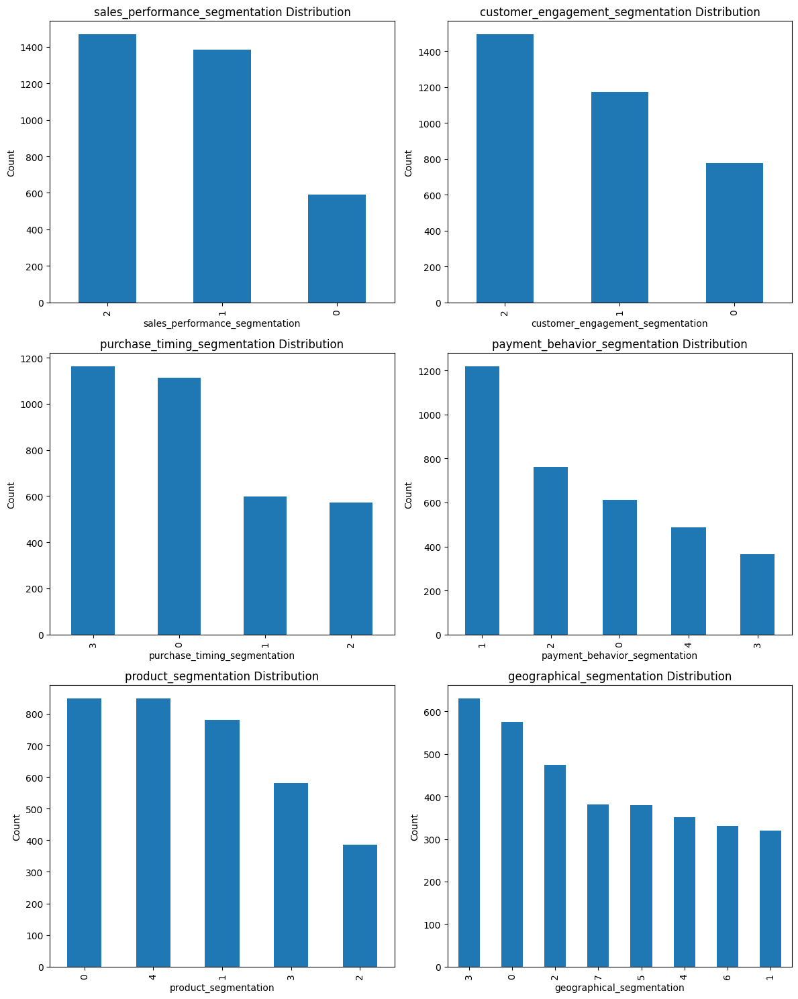

In [59]:
import matplotlib.pyplot as plt


# Create a figure with subplots (dynamic row count based on the number of segmentation columns)
fig, axes = plt.subplots(nrows=(len(segmentation_columns) + 1) // 2, ncols=2, figsize=(12, 15))

# Flatten the axes array to loop easily
axes = axes.flatten()

# Loop through each segmentation column and plot on a subplot
for i, col in enumerate(segmentation_columns):
    product_df[col].value_counts().plot(kind="bar", ax=axes[i], title=f"{col} Distribution")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")

# Hide any unused subplots (if the number of plots is odd)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing between plots
plt.show()


In [60]:
product_df.nunique()

Count_of_Purchases                          2163
Total_Quantity                              2395
Total_Revenue                               3382
Avg_Quantity                                2794
Avg_Revenue                                 3339
Number_of_Customers                         1976
Repeat_Customers                            1002
Repeat_Purchase_Rate                        2571
Avg_Purchase_Frequency                      2720
Average_Share_Of_Wallet                     3444
Last_Purchase_Date                           351
Days_Since_Last_Purchase                     351
Promotion_Nationale_Count                    619
Promotion_Magasin_Count                      984
Most_Purchased_Day_Category                    2
Most_Purchased_Time_Of_Day                     3
Hierarchy_METIER                               4
Hierarchy_SOUS_RAYON                           6
Hierarchy_FAMILLE                            117
Hierarchy_SOUS_FAMILLE                       608
City_Bron_Purchases 

### Sales Performance EDA

In [61]:

sales_performance_df["sales_performance_segmentation"] = product_df["sales_performance_segmentation"]
# Distribution of purchase timing clusters
print(sales_performance_df['sales_performance_segmentation'].value_counts())

sales_performance_segmentation
2    1468
1    1386
0     591
Name: count, dtype: int64


In [62]:

sales_summary = sales_performance_df.groupby("sales_performance_segmentation").agg({
    "Count_of_Purchases": ["mean", "median", "std"],
    "Total_Quantity": ["mean", "median", "std"],
    "Total_Revenue": ["mean", "median", "std"],
    "Days_Since_Last_Purchase": ["mean", "median", "std"],
    "Revenue_per_Day_Since_Last_Purchase": ["mean", "median", "std"],
    "Quantity_per_Day_Since_Last_Purchase": ["mean", "median", "std"],
    "Promotion_Nationale_Count": ["mean", "median", "std"],
    "Promotion_Magasin_Count": ["mean", "median", "std"]
})



In [63]:
sales_summary

Count_of_Purchases                         \
                                             mean   median           std   
sales_performance_segmentation                                             
0                                    20515.494078  12210.0  26480.390615   
1                                     1001.485570    260.5   1981.217390   
2                                     1388.051090    871.0   1559.470473   

                               Total_Quantity                         \
                                         mean   median           std   
sales_performance_segmentation                                         
0                                23521.677242  12563.0  38618.246567   
1                                 1050.194069    273.0   2085.185120   
2                                 1456.822071    901.5   1644.644360   

                               Total_Revenue                           \
                                        mean     median           std   
sales_performance_segmentation                                          
0                               62269.002369  40552.880  72352.201935   
1                                3949.442309   1246.880   7155.862484   
2                                5284.020456   3335.935   5700.897834   

                               Days_Since_Last_Purchase  ...  \
                                                   mean  ...   
sales_performance_segmentation                           ...   
0                                             16.790186  ...   
1                                            219.107504  ...   
2                                             18.728883  ...   

                               Revenue_per_Day_Since_Last_Purchase  \
                                                               std   
sales_performance_segmentation                                       
0                                                     66855.838726   
1                                                        40.000515   
2                                                      5036.405051   

                               Quantity_per_Day_Since_Last_Purchase  \
                                                               mean   
sales_performance_segmentation                                        
0                                                      18014.265494   
1                                                          5.512619   
2                                                       1066.663997   

                                                           \
                                     median           std   
sales_performance_segmentation                              
0                               9083.750000  34293.246977   
1                                  1.331641     10.829685   
2                                312.166667   1481.124123   

                               Promotion_Nationale_Count                      \
                                                    mean median          std   
sales_performance_segmentation                                                 
0                                            1359.802030    0.0  3389.045066   
1                                              72.961039    0.0   271.376555   
2                                              89.327657    0.0   276.389759   

                               Promotion_Magasin_Count                       
                                                  mean  median          std  
sales_performance_segmentation                                               
0                                          1841.600677  1064.0  3538.493441  
1                                           126.831890    35.5   244.406621  
2                                           136.586512    77.0   167.496079  

[3 rows x 24 columns]

In [64]:
# Flatten MultiIndex columns:
sales_summary.columns = ['_'.join(col) for col in sales_summary.columns]
sales_summary.reset_index(inplace=True)

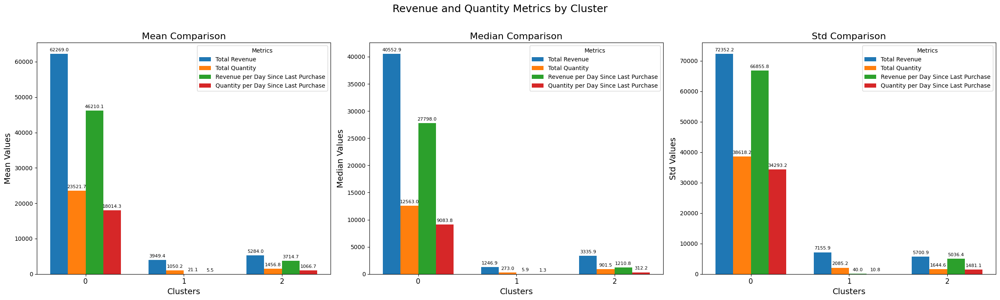

In [70]:
# Clearly define your revenue metrics
revenue_metrics = [
    'Total_Revenue',
    'Total_Quantity',
    'Revenue_per_Day_Since_Last_Purchase',
    'Quantity_per_Day_Since_Last_Purchase'
]

# Call the plotting function clearly
mod.plot_cluster_metrics(
    sales_summary,
    revenue_metrics,
    'Revenue and Quantity Metrics by Cluster',segmentation_column='sales_performance_segmentation'
)


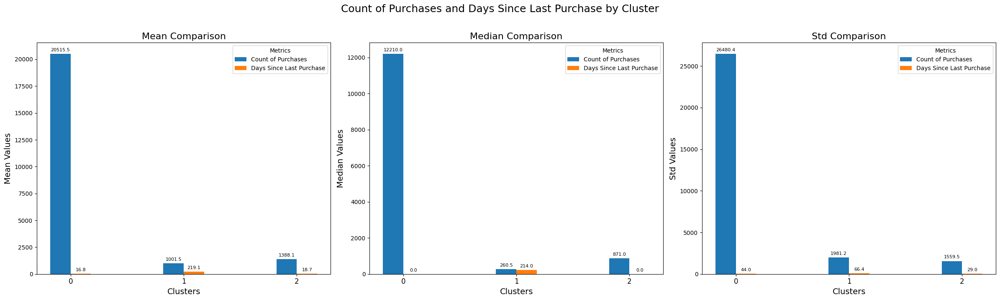

In [71]:
selected_metrics = ['Count_of_Purchases', 'Days_Since_Last_Purchase']
mod.plot_cluster_metrics(sales_summary, selected_metrics, 'Count of Purchases and Days Since Last Purchase by Cluster',segmentation_column='sales_performance_segmentation')

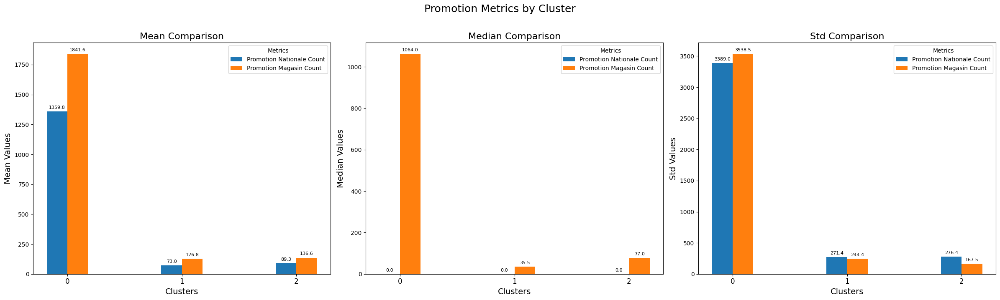

In [72]:
# Clearly define your promotion metrics
promotion_metrics = [
    "Promotion_Nationale_Count",
    "Promotion_Magasin_Count"
]

# Call the plotting function for promotions
mod.plot_cluster_metrics(
    sales_summary,
    promotion_metrics,
    "Promotion Metrics by Cluster",
    segmentation_column="sales_performance_segmentation"
)


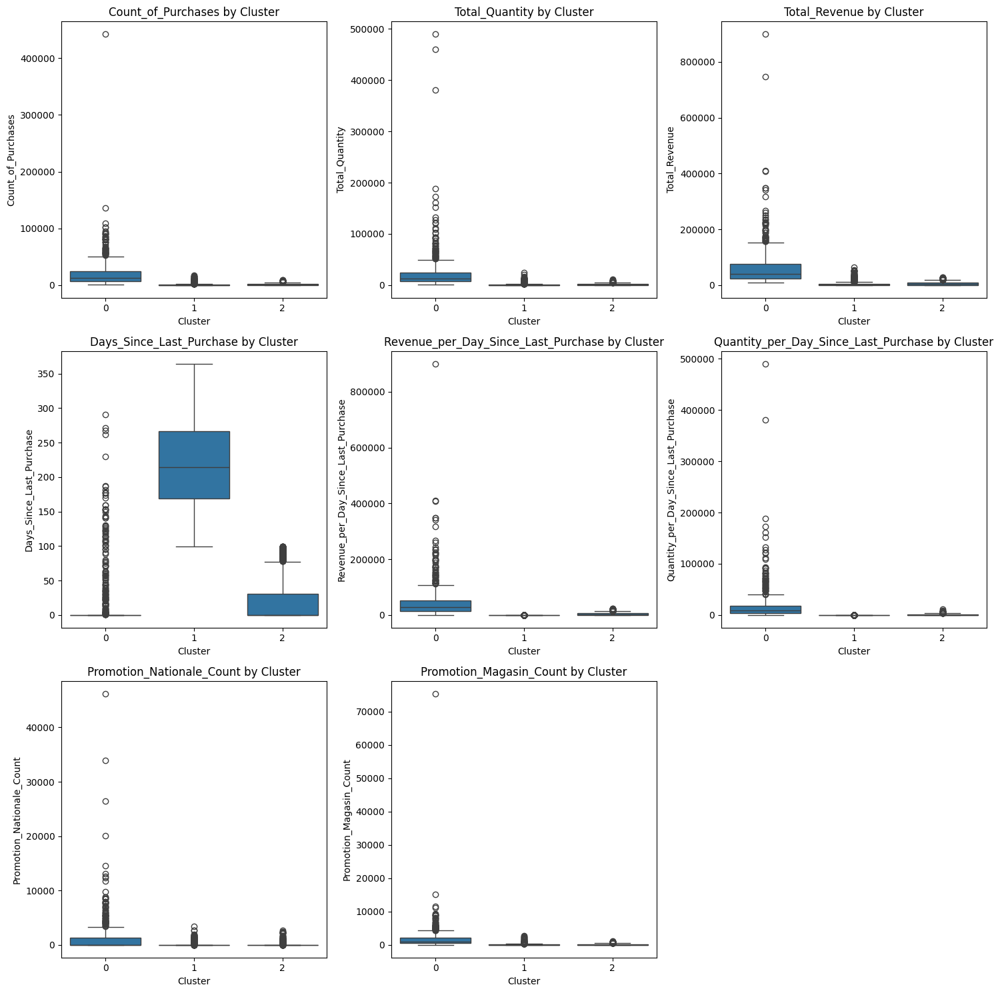

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Identify the features you want to plot (excluding the cluster label column)
features = [
    col for col in sales_performance_df.columns 
    if col != "sales_performance_segmentation"
]

# Decide how many columns of plots you want (e.g., 3 or 4)
n_cols = 3
# Calculate how many rows are needed based on the number of features
n_rows = math.ceil(len(features) / n_cols)

# Create a figure and axes array
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))

# Flatten the axes array if there's more than one row
axes = axes.flatten() if n_rows > 1 else [axes]

# Loop through each feature and create a boxplot on the corresponding subplot
for i, feature in enumerate(features):
    sns.boxplot(
        data=sales_performance_df, 
        x="sales_performance_segmentation", 
        y=feature, 
        ax=axes[i]
    )
    axes[i].set_title(f"{feature} by Cluster")
    axes[i].set_xlabel("Cluster")
    axes[i].set_ylabel(feature)

# If there are unused subplots, you can hide them
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


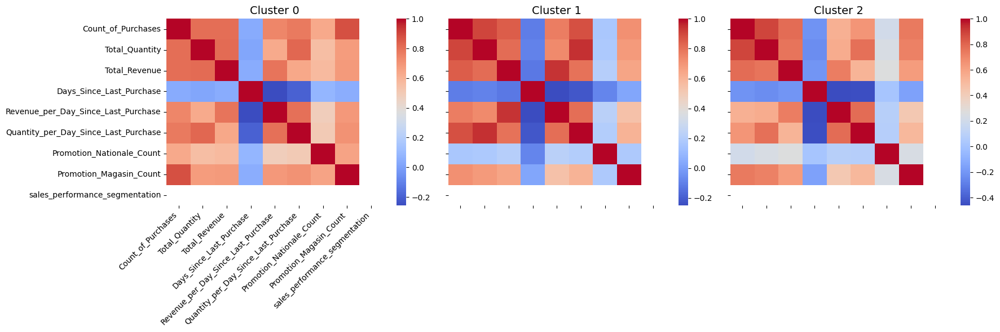

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Get unique cluster labels (sorted for consistency)
cluster_labels = sorted(sales_performance_df["sales_performance_segmentation"].unique())
n_clusters = len(cluster_labels)

# Create a subplot grid with one column per cluster
fig, axes = plt.subplots(1, n_clusters, figsize=(6 * n_clusters, 6))

# If only one cluster exists, axes is not an array so make it a list for uniformity
if n_clusters == 1:
    axes = [axes]

# Loop through each cluster and plot its correlation heatmap
for i, cl in enumerate(cluster_labels):
    # Filter the DataFrame for the current cluster
    subset = sales_performance_df[sales_performance_df["sales_performance_segmentation"] == cl]
    corr_matrix = subset.corr()

    # Plot heatmap in the corresponding subplot
    sns.heatmap(corr_matrix, annot=False, cmap="coolwarm", ax=axes[i])
    axes[i].set_title(f"Cluster {cl}", fontsize=14)
    
    # For clusters other than the first, hide the tick labels
    if i > 0:
        axes[i].set_xticklabels([])
        axes[i].set_yticklabels([])
    else:
        # For the first heatmap, rotate x labels for readability
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()


##### Cluster Labeling

**Cluster 0**  
**Label:** High-Performance Fast-Moving Products  

**Description:**  
Cluster 0 represents products characterized by very high average revenue, large quantities sold, and frequent purchases (high "Count of Purchases"). These products have minimal "days since last purchase," indicating they sell regularly and consistently. They also have significant engagement with promotional activities, evident from high values in both national and store promotions. High standard deviation across these metrics suggests some diversity within this cluster, indicating both flagship and slightly less consistent but still top-performing products. These products represent essential, high-demand items that strongly drive revenue and volume.  

---

**Cluster 1**  
**Label:** Slow-Moving, Low-Demand Products  

**Description:**  
Products in Cluster 1 show characteristics of extremely low performance, including low total revenue, small quantities sold, and very few purchase occurrences. They have significantly longer "days since last purchase," implying infrequent restocking or low customer demand. Moreover, they respond minimally to promotional activities, as seen in the negligible promotional metrics. Low variability (low standard deviation) highlights consistently poor product performance. This cluster represents products potentially near end-of-life or those that may require re-evaluation of their market relevance.  

---

**Cluster 2**  
**Label:** Moderate-Performance, Potential Growth Products  

**Description:**  
Cluster 2 comprises products positioned between high-performance and slow-moving categories. They exhibit moderate revenue and quantities sold, with occasional and steady purchase frequency. Their "days since last purchase" metric is lower than slow-moving products (Cluster 1), indicating moderate customer interest and consistent replenishment, though not as frequently as high-performing products (Cluster 0). They have moderate responsiveness to promotions, suggesting promotional strategies could positively influence sales. Products in this cluster represent opportunities for targeted marketing strategies to drive growth, possibly converting them into higher-performing products over time.  


In [75]:
# Define a mapping dictionary based on the cluster analysis
cluster_mapping = {
    0: "High-Performance Fast-Moving Products",
    1: "Slow-Moving, Low-Demand Products",
    2: "Moderate-Performance, Potential Growth Products"
}

# Apply the mapping to create a new column with meaningful names
product_df["sales_performance_segmentation"] = product_df["sales_performance_segmentation"].map(cluster_mapping)

# Display the updated DataFrame
product_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,1,2,4,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,1,2,4,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products",2,0,1,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,1,2,4,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102,7.330701,2.176890,0.859102,0.140898,0.313711,0.284805,0.313711,0.179336,0.056563,0.284805,0.165586,High-Performance Fast-Moving Products,1,2,4,0,5


In [76]:

# Distribution of purchase timing clusters
print(product_df['sales_performance_segmentation'].value_counts())

sales_performance_segmentation
Moderate-Performance, Potential Growth Products    1468
Slow-Moving, Low-Demand Products                   1386
High-Performance Fast-Moving Products               591
Name: count, dtype: int64


### Purchase timing EDA

In [77]:
purchase_timing_df.columns

Index(['Count_of_Purchases', 'Total_Quantity', 'Total_Revenue', 'Weekday_vs_Weekend_Ratio', 'Morning_Proportion', 'Afternoon_Proportion', 'Evening_Proportion'], dtype='object')

In [78]:

purchase_timing_df["purchase_timing_segmentation"] = product_df["purchase_timing_segmentation"]
# Distribution of purchase timing clusters
print(purchase_timing_df['purchase_timing_segmentation'].value_counts())


purchase_timing_segmentation
3    1162
0    1113
1     598
2     572
Name: count, dtype: int64


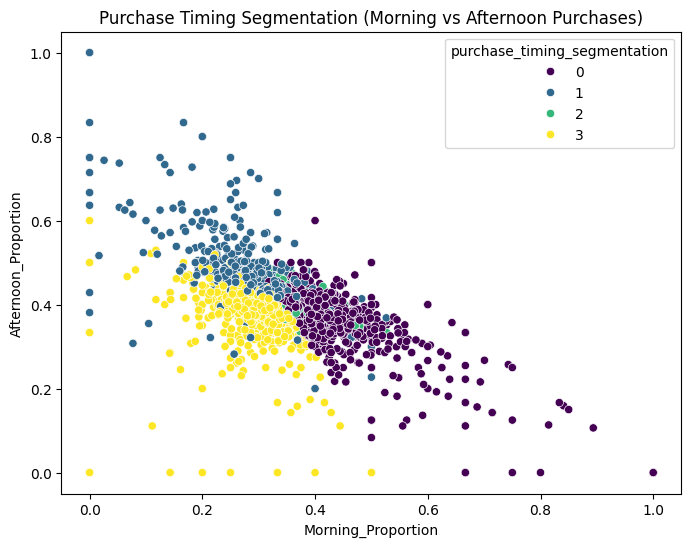

In [79]:

# Optionally, visualize the clusters using a simple scatter plot (for two dimensions)
import matplotlib.pyplot as plt
import seaborn as sns

# For example, plot Morning vs. Evening Purchases colored by cluster:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=purchase_timing_df["Morning_Proportion"],
    y=purchase_timing_df["Afternoon_Proportion"],
    hue=purchase_timing_df["purchase_timing_segmentation"],
    palette="viridis"
)
plt.title("Purchase Timing Segmentation (Morning vs Afternoon Purchases)")
plt.show()


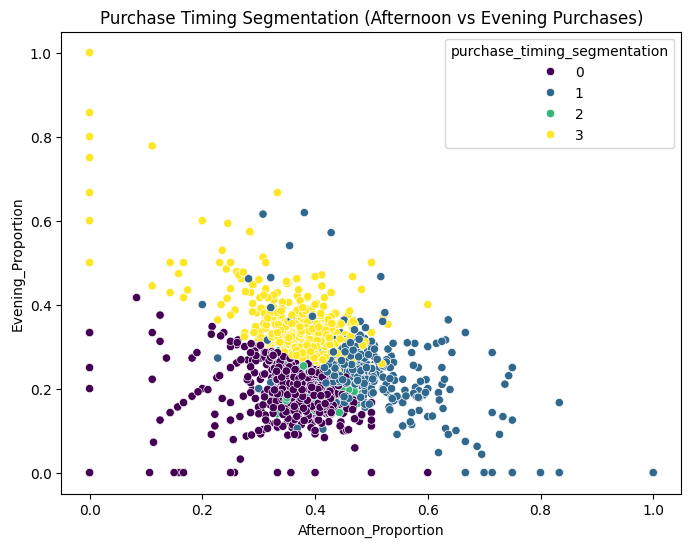

In [80]:

# Optionally, visualize the clusters using a simple scatter plot (for two dimensions)
import matplotlib.pyplot as plt
import seaborn as sns

# For example, plot Morning vs. Evening Purchases colored by cluster:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=purchase_timing_df["Afternoon_Proportion"],
    y=purchase_timing_df["Evening_Proportion"],
    hue=purchase_timing_df["purchase_timing_segmentation"],
    palette="viridis"
)
plt.title("Purchase Timing Segmentation (Afternoon vs Evening Purchases)")
plt.show()


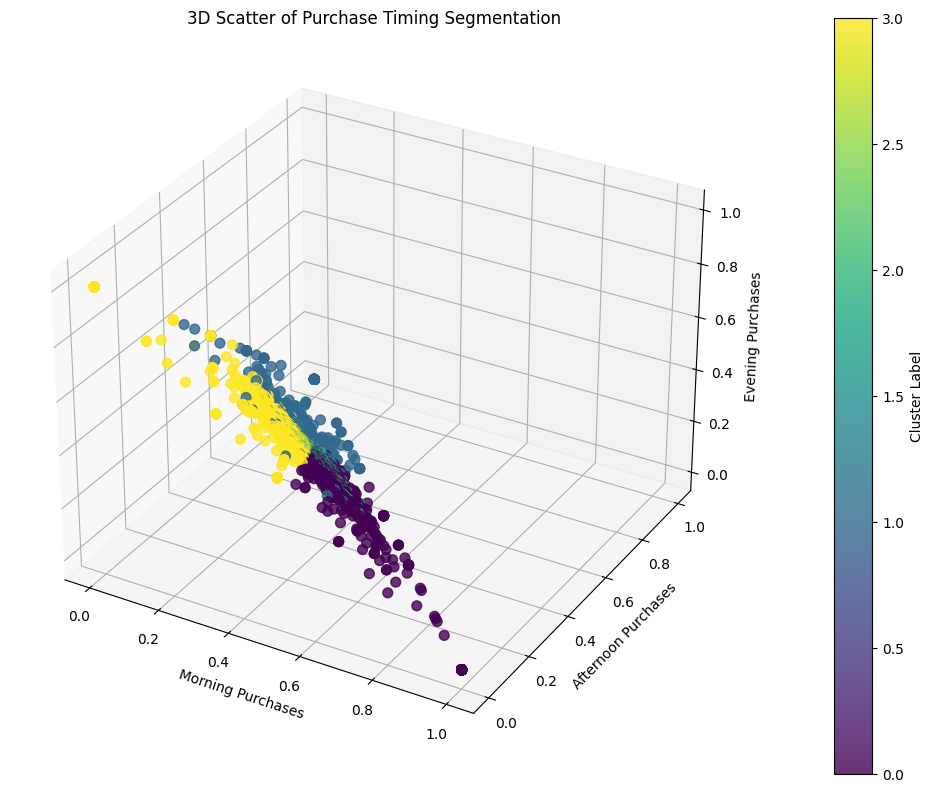

In [81]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

# Create a 3D scatter plot with Morning, Afternoon, and Evening Purchases
scatter = ax.scatter(
    purchase_timing_df["Morning_Proportion"],
    purchase_timing_df["Afternoon_Proportion"],
    purchase_timing_df["Evening_Proportion"],
    c=purchase_timing_df["purchase_timing_segmentation"],  # color by cluster
    cmap="viridis",
    s=50,  # size of markers, adjust as needed
    alpha=0.8
)

# Set labels for each axis
ax.set_xlabel("Morning Purchases")
ax.set_ylabel("Afternoon Purchases")
ax.set_zlabel("Evening Purchases")
ax.set_title("3D Scatter of Purchase Timing Segmentation")

# Add a colorbar to indicate cluster labels
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


In [82]:
purchase_timing_metrics  = purchase_timing_df.columns

# 1) Aggregate with all stats:
purchase_timing_summary = (
    purchase_timing_df.groupby("purchase_timing_segmentation")[purchase_timing_metrics ]
    .agg(["mean","median","std"])
)

In [83]:
purchase_timing_summary.head()

Count_of_Purchases                        Total_Quantity                        Total_Revenue                          Weekday_vs_Weekend_Ratio                     Morning_Proportion                     Afternoon_Proportion                     Evening_Proportion                     purchase_timing_segmentation            
                                    mean         median       std           mean       median       std           mean       median        std                mean             median     std           mean          median     std            mean           median     std           mean          median     std                mean             median std 
purchase_timing_segmentation                                                                                                                                                                                                                                                                                                                                    
0                                1403.598383       666.0   1796.117190   1409.851249     693.0   1788.486405   5262.062857   2806.960   6114.135982         2.307956          2.118644  1.703658      0.455811       0.405514  0.153316       0.347763        0.374667  0.104756      0.196426       0.216132  0.074089              0.0               0.0   0.0
1                                 702.511706       138.5   1249.880262    782.411455     151.5   1525.537641   2660.709967    563.735   4464.089350         4.769651          3.109556  3.958017      0.235990       0.275862  0.127509       0.550353        0.474982  0.195976      0.213657       0.240645  0.117664              1.0               1.0   0.0
2                               21267.113636     13149.5  26652.688244  24274.528112   13180.0  39061.075149  64847.775420  42929.760  72542.390057         2.181683          2.165995  0.222197      0.358178       0.356257  0.039939       0.396978        0.393707  0.026216      0.244844       0.247050  0.038812              2.0               2.0   0.0
3                                1207.641136       650.5   1510.563219   1354.060637     690.0   1761.641914   4725.595017   2631.430   5617.096247         2.514835          2.176816  1.810828      0.279839       0.297532  0.088241       0.356666        0.384847  0.108976      0.363495       0.317701  0.156562              3.0               3.0   0.0

In [84]:
# 2) Flatten the multi-indexed columns:
purchase_timing_summary.columns = ['_'.join(col) for col in purchase_timing_summary.columns]
purchase_timing_summary.reset_index(inplace=True)


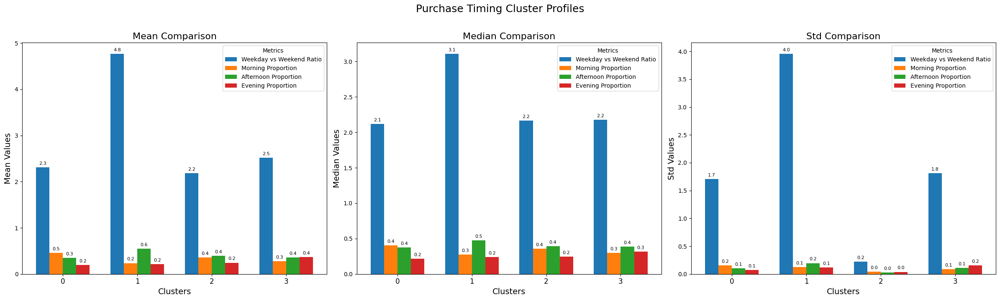

In [85]:
selected_metrics = ['Weekday_vs_Weekend_Ratio', 'Morning_Proportion','Afternoon_Proportion','Evening_Proportion']
# Call the function for purchase timing clusters
mod.plot_cluster_metrics(
    purchase_timing_summary, 
    selected_metrics, 
    "Purchase Timing Cluster Profiles",segmentation_column='purchase_timing_segmentation'
)

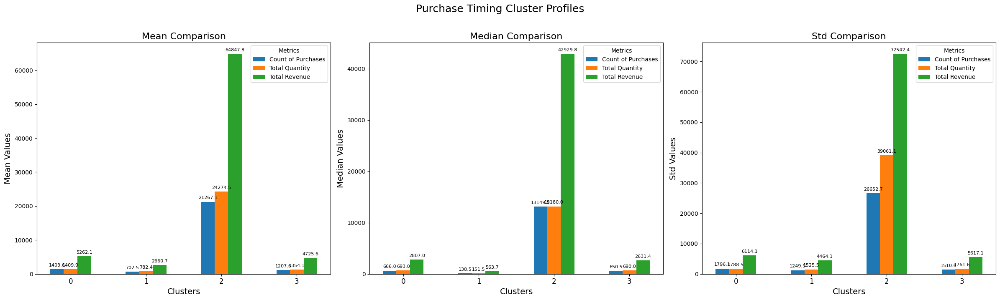

In [86]:
selected_metrics = ['Count_of_Purchases', 'Total_Quantity','Total_Revenue']
# Call the function for purchase timing clusters
mod.plot_cluster_metrics(
    purchase_timing_summary, 
    selected_metrics, 
    "Purchase Timing Cluster Profiles",segmentation_column='purchase_timing_segmentation'
)

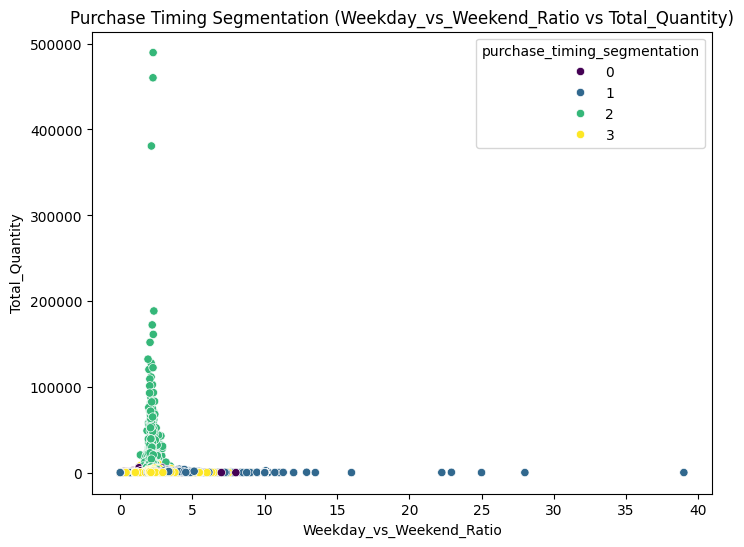

In [87]:

# Optionally, visualize the clusters using a simple scatter plot (for two dimensions)
import matplotlib.pyplot as plt
import seaborn as sns

# For example, plot Morning vs. Evening Purchases colored by cluster:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=purchase_timing_df["Weekday_vs_Weekend_Ratio"],
    y=purchase_timing_df["Total_Quantity"],
    hue=purchase_timing_df["purchase_timing_segmentation"],
    palette="viridis"
)
plt.title("Purchase Timing Segmentation (Weekday_vs_Weekend_Ratio vs Total_Quantity)")
plt.show()


##### Cluster Labeling

**Cluster 0**  
**Label:** Highest Volume, Morning-Dominant, Strong Weekday Preference  

**Description:**  
- **Purchase Volume:** This cluster has the highest mean and median for Count_of_Purchases, Total_Quantity, and Total_Revenue, making them the top performers in terms of overall sales.  
- **Time of Day:** A high Morning_Proportion (around 0.7–0.8) indicates these purchases predominantly occur in the early part of the day.  
- **Weekday vs. Weekend:** A high Weekday_vs_Weekend_Ratio (> 3 on average) shows a strong skew toward weekday transactions.  
- **Key Takeaway:** These are the most active, morning-focused products (depending on context), and they transact heavily on weekdays.  

---

**Cluster 1**  
**Label:** Moderate Volume, Afternoon-Dominant, Weekday Preference  

**Description:**  
- **Purchase Volume:** Shows moderate levels of Count_of_Purchases, Total_Quantity, and Total_Revenue—higher than Cluster 3 but below Clusters 0 and 2.  
- **Time of Day:** A high Afternoon_Proportion (~0.6) indicates a clear preference for midday or afternoon transactions.  
- **Weekday vs. Weekend:** The Weekday_vs_Weekend_Ratio is around 2–2.5, indicating they still purchase more on weekdays, but not as strongly skewed as Cluster 0.  
- **Key Takeaway:** This cluster is moderately active, most purchases happen in the afternoon, and they lean toward weekdays over weekends.  

---

**Cluster 2**  
**Label:** High Volume, Evening-Dominant, Weekday Preference  

**Description:**  
- **Purchase Volume:** This cluster is second-highest in Count_of_Purchases, Total_Quantity, and Total_Revenue, just below Cluster 0 but well above Clusters 1 and 3.  
- **Time of Day:** A high Evening_Proportion (~0.5–0.6) indicates that these purchases are heavily concentrated in the evening.  
- **Weekday vs. Weekend:** The Weekday_vs_Weekend_Ratio is typically around 2, showing a clear tilt toward weekday purchasing but less extreme than Cluster 0.  
- **Key Takeaway:** These are high-volume transactions occurring mainly in the evenings, still favoring weekdays.  

---

**Cluster 3**  
**Label:** Low Volume, Balanced Timing, Mixed Weekday-Weekend  

**Description:**  
- **Purchase Volume:** This group shows the lowest mean and median for Count_of_Purchases, Total_Quantity, and Total_Revenue among all clusters.  
- **Time of Day:** The proportions of Morning_Proportion and Evening_Proportion are both moderate (often ~0.4 each), with Afternoon_Proportion around 0.2, indicating no strong single time-of-day dominance.  
- **Weekday vs. Weekend:** The Weekday_vs_Weekend_Ratio hovers around 1.0, suggesting a near balance between weekday and weekend activity.  
- **Key Takeaway:** These are low-volume transactions spread relatively evenly across different times of day and days of the week.  


In [88]:
# Define a mapping dictionary based on the cluster analysis
cluster_map = {
    0: "Highest Volume, Morning-Dominant, Strong Weekday Preference",
    1: "Moderate Volume, Afternoon-Dominant, Weekday Preference",
    2: "High Volume, Evening-Dominant, Weekday Preference",
    3: "Low Volume, Balanced Timing, Mixed Weekday-Weekend"
}

# Apply the mapping to create a new column with meaningful names
product_df["purchase_timing_segmentation"] = product_df["purchase_timing_segmentation"].map(cluster_map)

# Display the updated DataFrame
product_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,1,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,1,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products",2,"Highest Volume, Morning-Dominant, Strong Weekd...",1,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,1,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1.968804,0.329570,0.391328,0.279102,7.330701,2.176890,0.859102,0.140898,0.313711,0.284805,0.

In [89]:


# Distribution of purchase timing clusters
print(product_df['purchase_timing_segmentation'].value_counts())

purchase_timing_segmentation
Low Volume, Balanced Timing, Mixed Weekday-Weekend             1162
Highest Volume, Morning-Dominant, Strong Weekday Preference    1113
Moderate Volume, Afternoon-Dominant, Weekday Preference         598
High Volume, Evening-Dominant, Weekday Preference               572
Name: count, dtype: int64


### Customer Engagement  EDA

In [90]:
customer_engagement_df.columns

Index(['Number_of_Customers', 'Avg_Quantity', 'Avg_Revenue', 'Revenue_per_Customer', 'Quantity_per_Customer', 'Revenue_per_Purchase', 'Quantity_per_Purchase', 'Repeat_Purchase_Rate', 'Avg_Purchase_Frequency', 'Average_Share_Of_Wallet', 'Promotion_Nationale_Count', 'Promotion_Magasin_Count'], dtype='object')

In [91]:

customer_engagement_df["customer_engagement_segmentation"] = product_df["customer_engagement_segmentation"]
# Distribution of purchase timing clusters
customer_engagement_df['customer_engagement_segmentation'].value_counts()


customer_engagement_segmentation
2    1494
1    1173
0     778
Name: count, dtype: int64

In [92]:
# Assuming your customer engagement DataFrame has a column "customer_engagement_segmentation"
customer_engagement_summary = customer_engagement_df.groupby("customer_engagement_segmentation").agg({
    'Number_of_Customers': ['mean', 'median', 'std'],
    'Avg_Quantity': ['mean', 'median', 'std'],
    'Avg_Revenue': ['mean', 'median', 'std'],
    'Revenue_per_Customer': ['mean', 'median', 'std'],
    'Quantity_per_Customer': ['mean', 'median', 'std'],
    'Revenue_per_Purchase': ['mean', 'median', 'std'],
    'Quantity_per_Purchase': ['mean', 'median', 'std'],
    'Repeat_Purchase_Rate': ['mean', 'median', 'std'],
    'Avg_Purchase_Frequency': ['mean', 'median', 'std'],
    'Average_Share_Of_Wallet': ['mean', 'median', 'std'],
    'Promotion_Nationale_Count': ['mean', 'median', 'std'],
    'Promotion_Magasin_Count': ['mean', 'median', 'std']
})
customer_engagement_summary


Number_of_Customers                      Avg_Quantity                     Avg_Revenue                     Revenue_per_Customer                      Quantity_per_Customer                     Revenue_per_Purchase                     Quantity_per_Purchase                     Repeat_Purchase_Rate                     Avg_Purchase_Frequency                     Average_Share_Of_Wallet                     Promotion_Nationale_Count                     Promotion_Magasin_Count                    
                                         mean         median     std          mean       median     std        mean      median     std            mean           median      std             mean           median     std            mean           median     std             mean           median     std            mean           median     std             mean            median     std              mean            median     std               mean           median     std                mean          median     std     
customer_engagement_segmentation                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
0                                      939.496144      469.0  1487.744335   1.257911    1.137213  0.500100   10.171662  8.270941  8.621643       12.855408       10.494174  9.522063        1.619861        1.504436  0.643448       10.171662       8.270941  8.621643        1.257911        1.137213  0.500100       0.089793        0.087209  0.063268        1.296080         1.278454  0.194580         0.079289         0.064132  0.064251         144.541131          0.0    439.411469         167.665810        73.0   340.701138
1                                     5936.764706     2927.0  8594.431712   1.137826    1.109728  0.427913    3.112686  2.954363  1.264639        5.422300        5.013377  2.515342        1.987802        1.853333  0.954982        3.112686       2.954363  1.264639        1.137826        1.109728  0.427913       0.209285        0.199061  0.079168        1.745597         1.677123  0.301528         0.035191         0.031333  0.018509         672.998295          0.0   2471.027783        1022.427962       420.0  2639.314996
2                                      563.040830      193.0   942.961473   1.005070    1.029847  0.258132    3.739739  3.541419  1.599591        4.367287        4.178299  1.720243        1.182677        1.221767  0.314725        3.739739       3.541419  1.599591        1.005070        1.029847  0.258132       0.051151        0.041559  0.046101        1.189332         1.188679  0.148823         0.027504         0.026822  0.015341          89.705489          0.0    398.154255          90.315930        18.0   184.292072

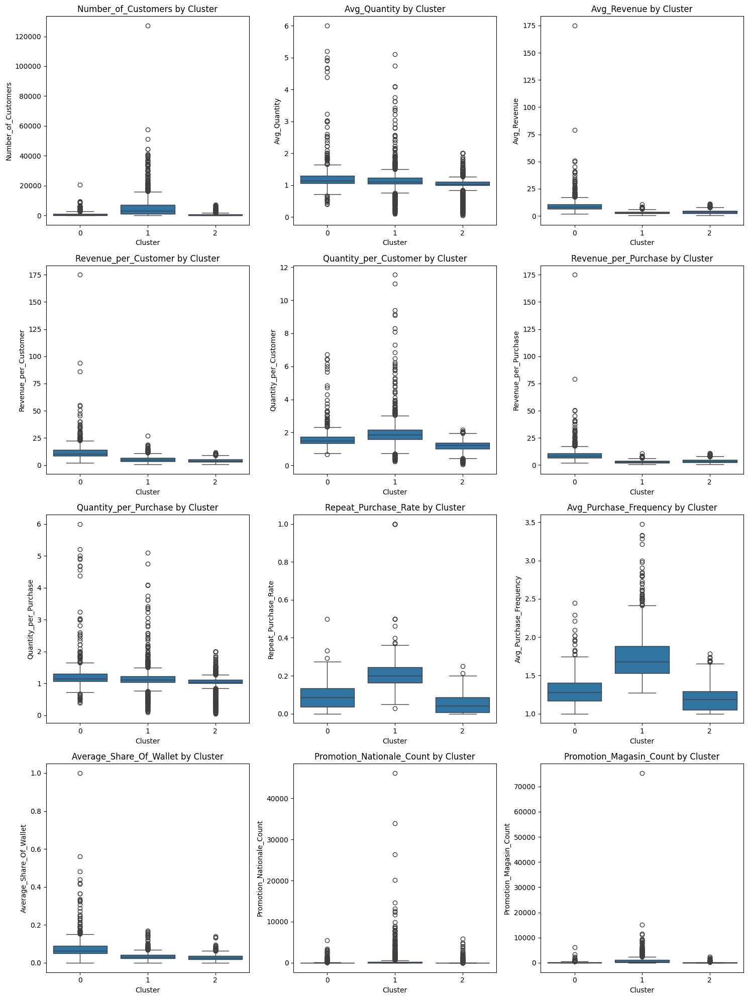

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# List of engagement features to plot (adjust as needed)
features = [
    'Number_of_Customers', 'Avg_Quantity', 'Avg_Revenue', 
    'Revenue_per_Customer', 'Quantity_per_Customer', 'Revenue_per_Purchase', 
    'Quantity_per_Purchase', 'Repeat_Purchase_Rate', 'Avg_Purchase_Frequency', 
    'Average_Share_Of_Wallet', 'Promotion_Nationale_Count', 'Promotion_Magasin_Count'
]

n_cols = 3
n_rows = math.ceil(len(features) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.boxplot(
        data=customer_engagement_df,
        x="customer_engagement_segmentation",
        y=feature,
        ax=axes[i]
    )
    axes[i].set_title(f"{feature} by Cluster")
    axes[i].set_xlabel("Cluster")
    axes[i].set_ylabel(feature)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


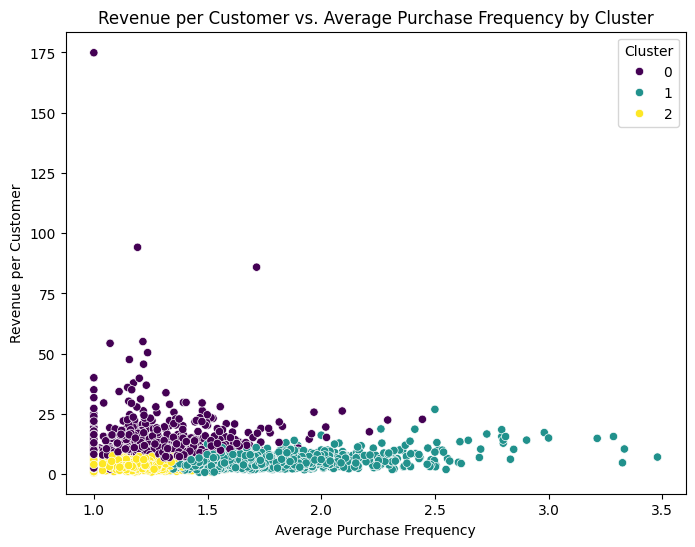

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=customer_engagement_df["Avg_Purchase_Frequency"],
    y=customer_engagement_df["Revenue_per_Customer"],
    hue=customer_engagement_df["customer_engagement_segmentation"],
    palette="viridis"
)
plt.title("Revenue per Customer vs. Average Purchase Frequency by Cluster")
plt.xlabel("Average Purchase Frequency")
plt.ylabel("Revenue per Customer")
plt.legend(title="Cluster")
plt.show()


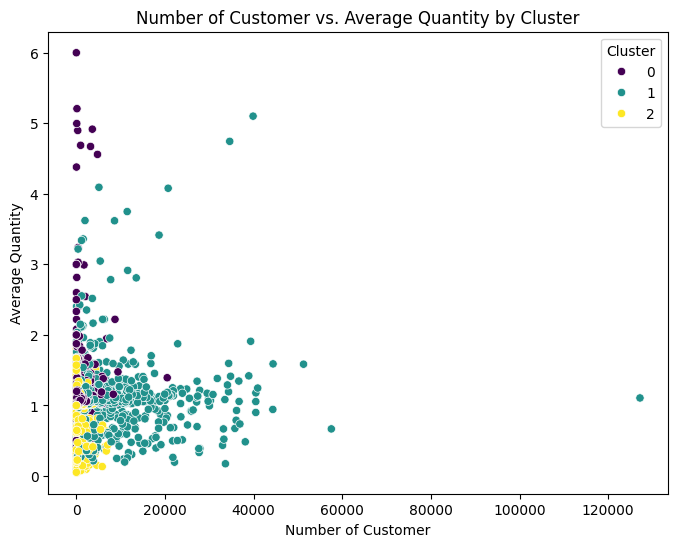

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=customer_engagement_df["Number_of_Customers"],
    y=customer_engagement_df["Avg_Quantity"],
    hue=customer_engagement_df["customer_engagement_segmentation"],
    palette="viridis"
)
plt.title("Number of Customer vs. Average Quantity by Cluster")
plt.xlabel("Number of Customer")
plt.ylabel("Average Quantity")
plt.legend(title="Cluster")
plt.show()


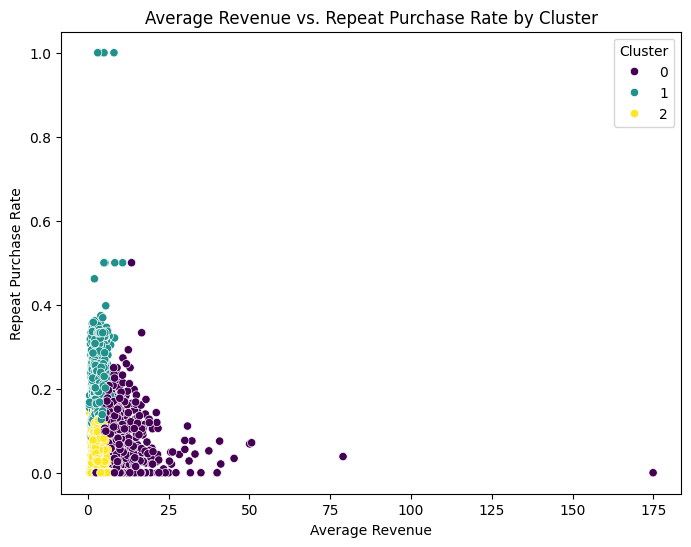

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=customer_engagement_df["Avg_Revenue"],
    y=customer_engagement_df["Repeat_Purchase_Rate"],
    hue=customer_engagement_df["customer_engagement_segmentation"],
    palette="viridis"
)
plt.title("Average Revenue vs. Repeat Purchase Rate by Cluster")
plt.xlabel("Average Revenue")
plt.ylabel("Repeat Purchase Rate")
plt.legend(title="Cluster")
plt.show()


In [97]:
customer_engagement_summary.columns = ['_'.join(col) for col in customer_engagement_summary.columns]
customer_engagement_summary.reset_index(inplace=True)

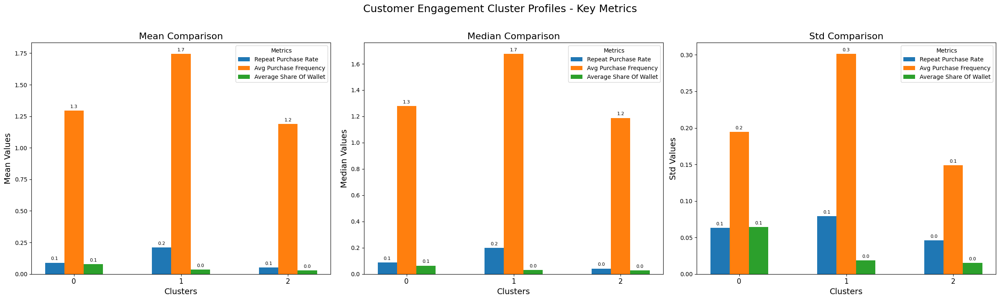

In [98]:
# Selected metrics for plotting customer engagement clusters:
selected_metrics = [
    'Repeat_Purchase_Rate',
    'Avg_Purchase_Frequency',
    'Average_Share_Of_Wallet',
]

# Call your plotting function (mod.plot_cluster_metrics) to visualize these metrics by cluster
mod.plot_cluster_metrics(
    customer_engagement_summary,
    selected_metrics,
    "Customer Engagement Cluster Profiles - Key Metrics",
    segmentation_column='customer_engagement_segmentation'
)


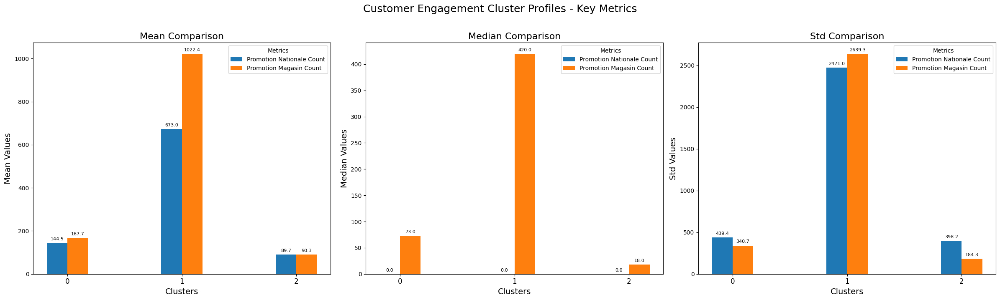

In [99]:

    
selected_metrics = [
    'Promotion_Nationale_Count',
    'Promotion_Magasin_Count'
]

# Call your plotting function (mod.plot_cluster_metrics) to visualize these metrics by cluster
mod.plot_cluster_metrics(
    customer_engagement_summary,
    selected_metrics,
    "Customer Engagement Cluster Profiles - Key Metrics",
    segmentation_column='customer_engagement_segmentation'
)



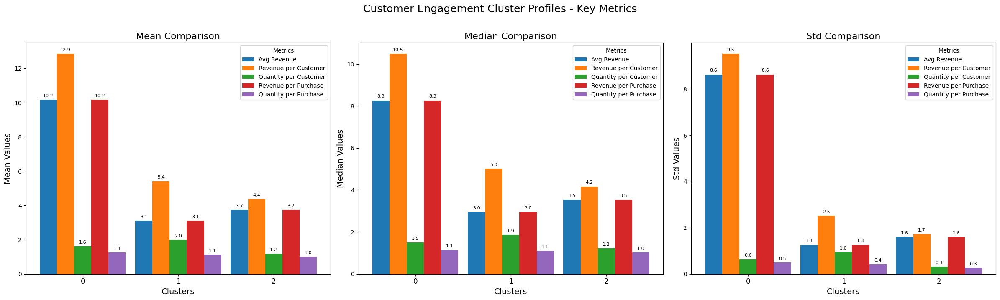

In [100]:

    
selected_metrics = [   'Avg_Revenue',
    'Revenue_per_Customer',
    'Quantity_per_Customer','Revenue_per_Purchase','Quantity_per_Purchase'
]

# Call your plotting function (mod.plot_cluster_metrics) to visualize these metrics by cluster
mod.plot_cluster_metrics(
    customer_engagement_summary,
    selected_metrics,
    "Customer Engagement Cluster Profiles - Key Metrics",
    segmentation_column='customer_engagement_segmentation'
)



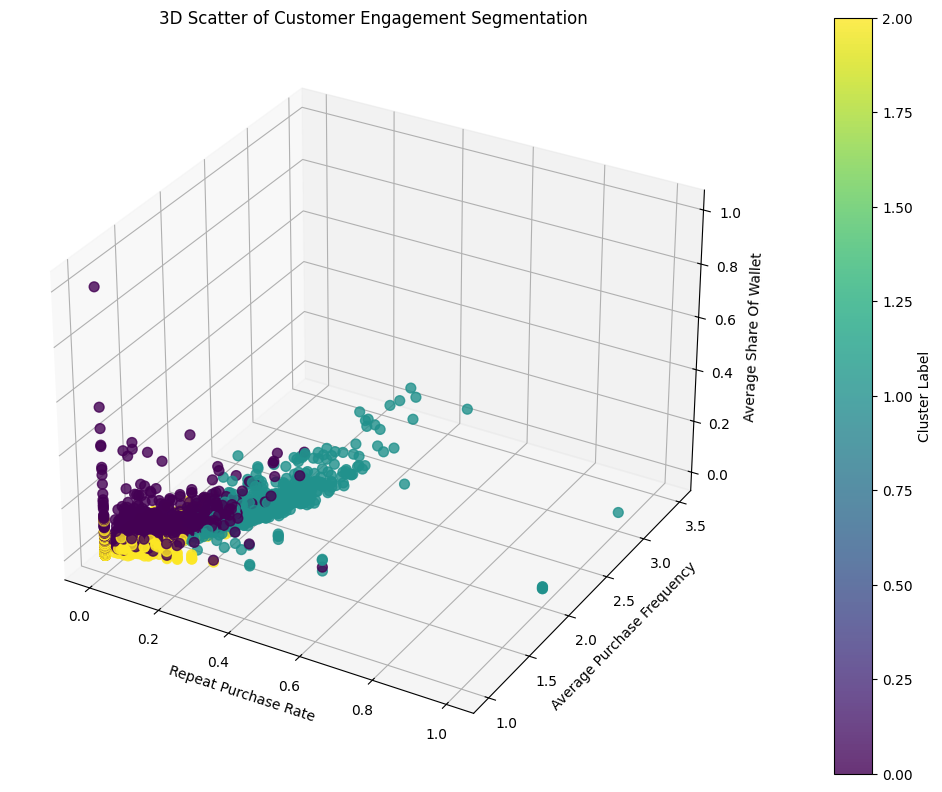

In [101]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

# Create a 3D scatter plot for customer engagement
scatter = ax.scatter(
    customer_engagement_df["Repeat_Purchase_Rate"],
    customer_engagement_df["Avg_Purchase_Frequency"],
    customer_engagement_df["Average_Share_Of_Wallet"],
    c=customer_engagement_df["customer_engagement_segmentation"],  # color by cluster label
    cmap="viridis",
    s=50,  # marker size, adjust as needed
    alpha=0.8
)

# Set axis labels and title
ax.set_xlabel("Repeat Purchase Rate")
ax.set_ylabel("Average Purchase Frequency")
ax.set_zlabel("Average Share Of Wallet")
ax.set_title("3D Scatter of Customer Engagement Segmentation")

# Add a colorbar to indicate cluster labels
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


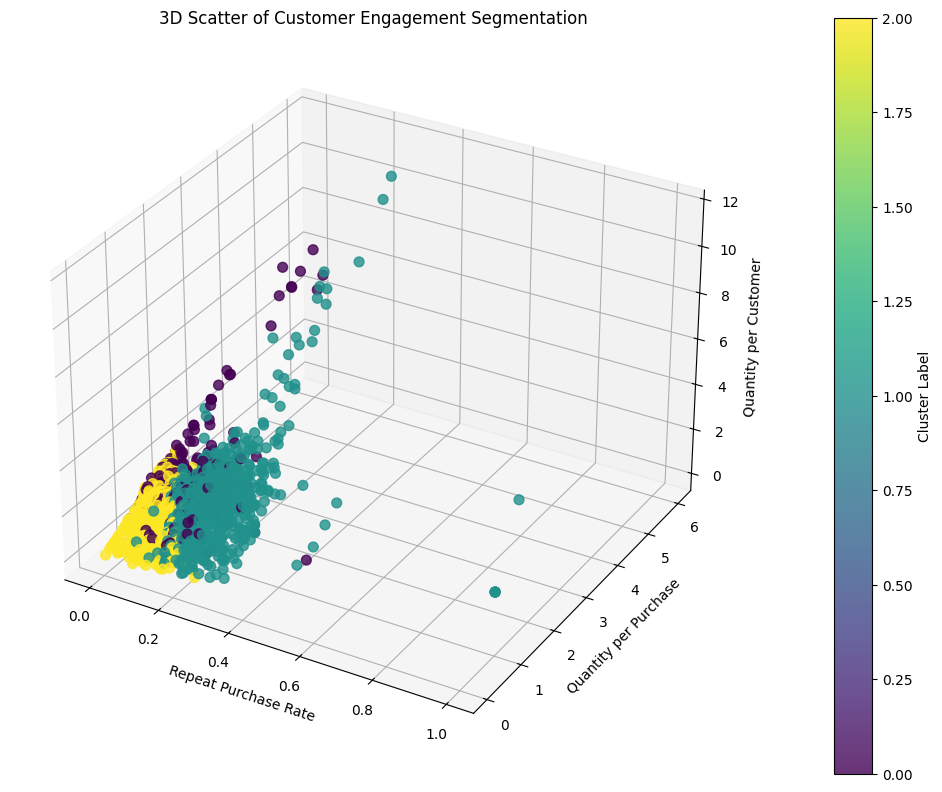

In [102]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

# Create a 3D scatter plot for customer engagement
scatter = ax.scatter(
    customer_engagement_df["Repeat_Purchase_Rate"],
    customer_engagement_df["Quantity_per_Purchase"],
    customer_engagement_df["Quantity_per_Customer"],
    c=customer_engagement_df["customer_engagement_segmentation"],  # color by cluster label
    cmap="viridis",
    s=50,  # marker size, adjust as needed
    alpha=0.8
)

# Set axis labels and title
ax.set_xlabel("Repeat Purchase Rate")
ax.set_ylabel("Quantity per Purchase")
ax.set_zlabel("Quantity per Customer")
ax.set_title("3D Scatter of Customer Engagement Segmentation")

# Add a colorbar to indicate cluster labels
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


#### Cluster Labeling

**Cluster 0: "High-Value Niche Performers"**  

**Description:**  
- **Moderate Customer Base:** Medium to low "Number of Customers," but relatively high revenue and quantity per customer.  
- **Strong Revenue Metrics:** Highest "Avg Revenue," "Revenue per Customer," and significant "Revenue per Purchase," indicating these products are high-priced or premium.  
- **Moderate Quantity Metrics:** Moderate to high "Quantity per Customer," suggesting customers buy larger amounts per transaction.  
- **Moderate Repeat Engagement:** Moderate repeat purchase rates and average purchase frequency, suggesting decent loyalty but room for growth.  
- **Promotion Response:** Moderate response to promotions (national and store-level).  
- **Timing & Weekday Preference:** Clear weekday preference and moderate morning-centric purchasing behavior.  

**Interpretation:**  
These products appeal to a niche, premium segment—fewer customers, but higher spending per customer and per transaction, with decent customer loyalty. They perform well financially but have potential for broader appeal through targeted promotional efforts.  

---

**Cluster 1: "Core Revenue Drivers"**  

**Description:**  
- **Largest Customer Base:** Highest "Number of Customers," indicating broad market appeal and mainstream popularity.  
- **Stable Revenue & Quantity:** Moderate metrics for "Avg Revenue," "Revenue per Customer," "Avg Quantity," and "Quantity per Customer," indicating balanced and steady sales.  
- **High Repeat Engagement:** Highest "Repeat Purchase Rate" and "Avg Purchase Frequency," indicating strong customer loyalty and regular consumption.  
- **Moderate Share of Wallet:** While individual spending per transaction is moderate, these products capture a significant share of their customers' wallets due to repeated engagement.  
- **High Promotional Responsiveness:** Highest responsiveness to both national and store promotions, suggesting strong effectiveness of promotional strategies.  
- **Balanced Timing & Strong Weekday Preference:** Consistent weekday purchasing, with relatively balanced proportions across morning, afternoon, and evening.  

**Interpretation:**  
These products are central to the store’s portfolio—regularly purchased, widely popular, and highly responsive to promotional activities. They represent steady, reliable income streams with strong customer loyalty.  

---

**Cluster 2: "Low-Engagement, Marginal Products"**  

**Description:**  
- **Smallest Customer Base:** Lowest "Number of Customers," limited appeal, niche or unpopular products.  
- **Weak Revenue and Quantity Metrics:** Lowest "Avg Revenue," "Revenue per Customer," "Avg Quantity," and "Quantity per Customer," suggesting minimal financial contribution.  
- **Poor Repeat Engagement:** Lowest "Repeat Purchase Rate" and "Avg Purchase Frequency," showing little to no customer loyalty or repeat behavior.  
- **Minimal Share of Wallet:** Products in this group have little importance in overall customer spending patterns.  
- **Limited Promotion Response:** Low effectiveness of promotional strategies, indicating these products are difficult to stimulate even with discounts or promotions.  
- **No Strong Timing Preference & Moderate Weekday Preference:** Purchases scattered throughout different times of day without significant patterns or strong timing behavior.  

**Interpretation:**  
These products have low engagement, low customer loyalty, and minimal contribution to revenue. They may require re-evaluation, stronger marketing efforts, or potential discontinuation depending on strategic priorities.  


In [103]:
# Define a mapping dictionary based on the cluster analysis
cluster_map = {
    0: "High-Value Niche Performers",
    1: "Core Revenue Drivers",
    2: "Low-Engagement, Marginal Products"
}

# Apply the mapping to create a new column with meaningful names
product_df["customer_engagement_segmentation"] = product_df["customer_engagement_segmentation"].map(cluster_map)

# Display the updated DataFrame
product_df.head()


,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",1,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",4,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8031,4591,1448,7291,4239,21993,3607,CARD,16977,8623,10018,7145,8437,3.739517,1.110469,95731.63000,28428.000000,1

In [104]:
product_df['customer_engagement_segmentation'].value_counts()

customer_engagement_segmentation
Low-Engagement, Marginal Products    1494
Core Revenue Drivers                 1173
High-Value Niche Performers           778
Name: count, dtype: int64

### Payment Behaviour EDA

In [105]:
payment_behavior_df.columns

Index(['Number_of_Customers', 'Card_Usage_Ratio', 'Revenue_per_Purchase', 'Cash_Usage_Ratio', 'Weekday_vs_Weekend_Ratio'], dtype='object')

In [106]:
payment_behavior_df["payment_behavior_segmentation"] = product_df["payment_behavior_segmentation"]
# Distribution of purchase timing clusters
print(payment_behavior_df['payment_behavior_segmentation'].value_counts())

payment_behavior_segmentation
1    1218
2     763
0     613
4     487
3     364
Name: count, dtype: int64


In [107]:
# Group by the Payment Behavior segmentation column (assumed to be "payment_behavior_segmentation")
payment_summary = payment_behavior_df.groupby("payment_behavior_segmentation").agg({
    "Number_of_Customers": ["mean", "median", "std"],
    "Revenue_per_Purchase":["mean", "median", "std"],
    "Card_Usage_Ratio": ["mean", "median", "std"],
    "Revenue_per_Purchase": ["mean", "median", "std"],
    "Weekday_vs_Weekend_Ratio": ["mean", "median", "std"],
    "Cash_Usage_Ratio":["mean", "median", "std"]
    
})

payment_summary

Number_of_Customers                       Revenue_per_Purchase                     Card_Usage_Ratio                     Weekday_vs_Weekend_Ratio                      Cash_Usage_Ratio                    
                                      mean         median      std              mean           median     std          mean         median     std              mean             median      std          mean         median     std   
payment_behavior_segmentation                                                                                                                                                                                                           
0                                   775.420881      391.0   1036.373738       10.991522       8.606667  9.385255     0.885342      0.882834  0.048514         2.111447           2.123656  0.869400     0.114658      0.117166  0.048514
1                                   894.966338      550.5    964.854578        3.635954       3.521400  1.234461     0.900738      0.891835  0.040868         1.996283           2.133496  0.709365     0.099262      0.108165  0.040868
2                                  1312.368283      655.0   1650.802067        3.532702       3.113500  1.953320     0.723150      0.780473  0.177970         2.525218           2.233463  1.802574     0.276850      0.219527  0.177970
3                                   184.131868       18.0    380.206156        4.910815       4.339070  3.057316     0.902636      0.892168  0.086002         7.895547          10.000000  3.702353     0.097364      0.107832  0.086002
4                                 12119.451745     8649.0  10540.741295        3.085259       2.748421  1.466894     0.832914      0.839442  0.040600         2.186153           2.167047  0.210515     0.167086      0.160558  0.040600

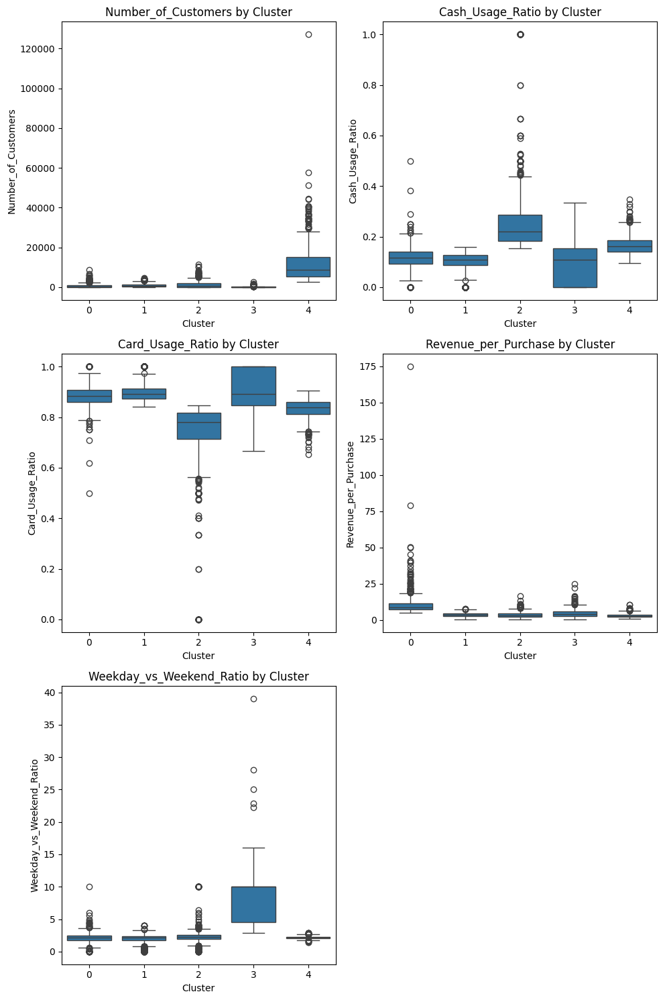

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# List the key features to visualize
features = [
    "Number_of_Customers", 
    "Cash_Usage_Ratio",
    "Card_Usage_Ratio", 
    "Revenue_per_Purchase", 
    "Weekday_vs_Weekend_Ratio"
]

n_cols = 2
n_rows = math.ceil(len(features) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.boxplot(
        data=payment_behavior_df,
        x="payment_behavior_segmentation",
        y=feature,
        ax=axes[i]
    )
    axes[i].set_title(f"{feature} by Cluster")
    axes[i].set_xlabel("Cluster")
    axes[i].set_ylabel(feature)

# Hide any unused subplots if they exist
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


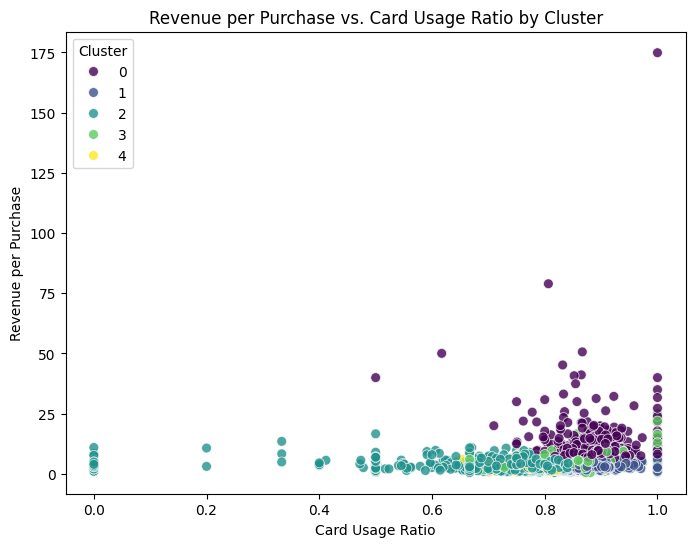

In [109]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Card_Usage_Ratio"],
    y=payment_behavior_df["Revenue_per_Purchase"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Revenue per Purchase vs. Card Usage Ratio by Cluster")
plt.xlabel("Card Usage Ratio")
plt.ylabel("Revenue per Purchase")
plt.legend(title="Cluster")
plt.show()


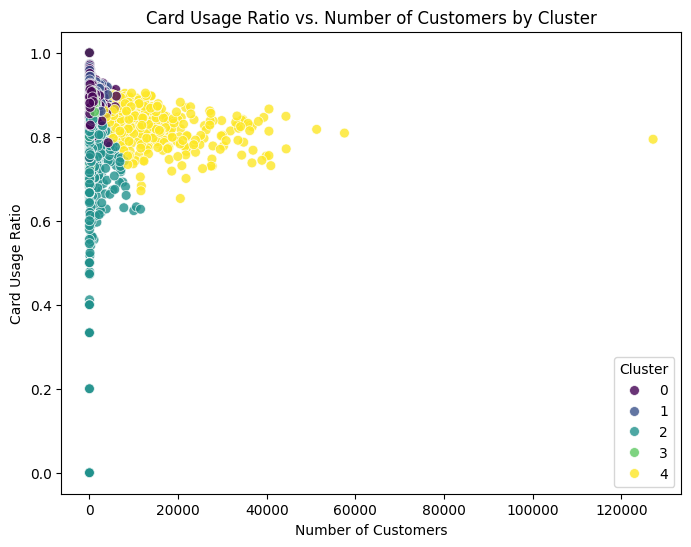

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Number_of_Customers"],
    y=payment_behavior_df["Card_Usage_Ratio"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Card Usage Ratio vs. Number of Customers by Cluster")
plt.xlabel("Number of Customers")
plt.ylabel("Card Usage Ratio")
plt.legend(title="Cluster")
plt.show()


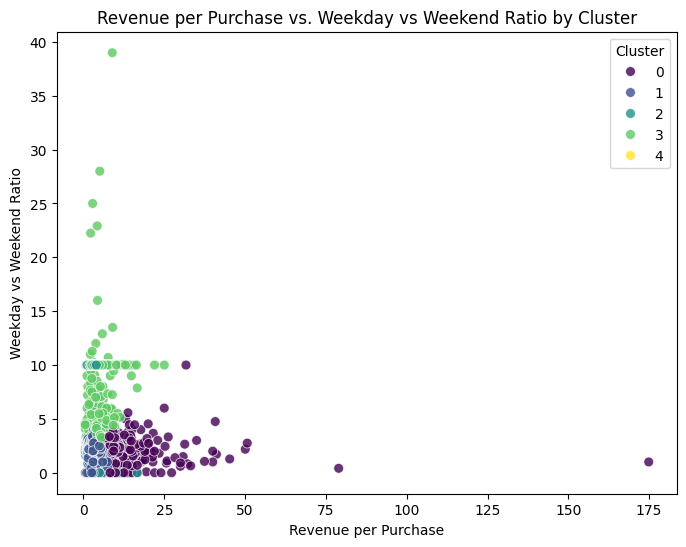

In [111]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Revenue_per_Purchase"],
    y=payment_behavior_df["Weekday_vs_Weekend_Ratio"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Revenue per Purchase vs. Weekday vs Weekend Ratio by Cluster")
plt.xlabel("Revenue per Purchase")
plt.ylabel("Weekday vs Weekend Ratio")
plt.legend(title="Cluster")
plt.show()


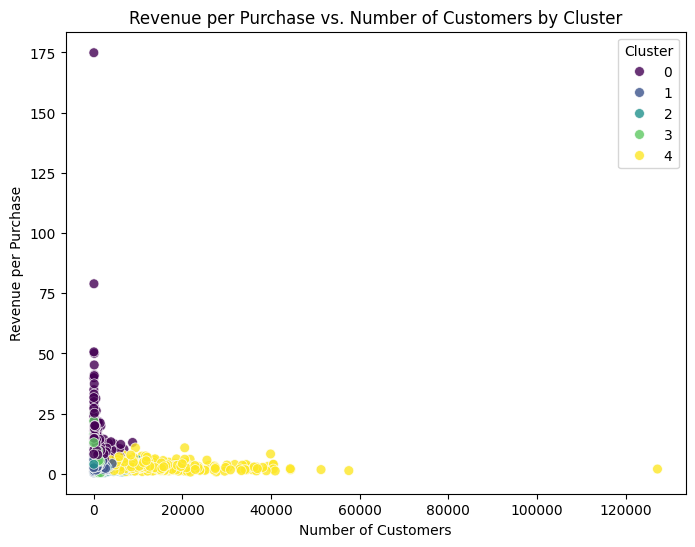

In [112]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Number_of_Customers"],
    y=payment_behavior_df["Revenue_per_Purchase"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Revenue per Purchase vs. Number of Customers by Cluster")
plt.xlabel("Number of Customers")
plt.ylabel("Revenue per Purchase")
plt.legend(title="Cluster")
plt.show()


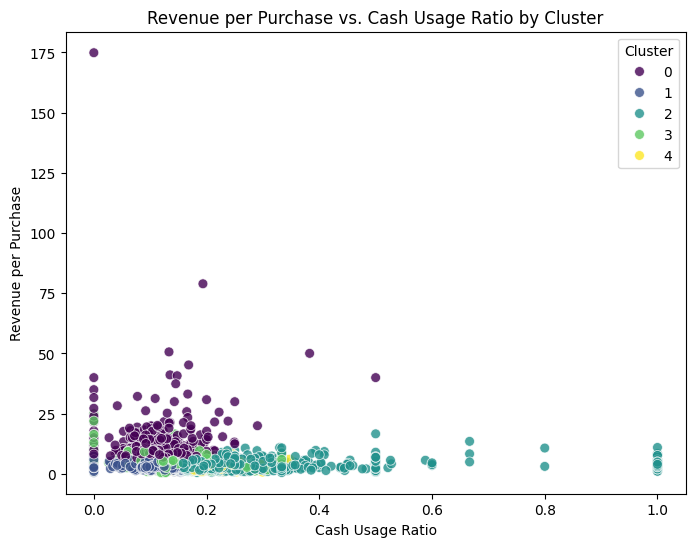

In [113]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Cash_Usage_Ratio"],
    y=payment_behavior_df["Revenue_per_Purchase"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Revenue per Purchase vs. Cash Usage Ratio by Cluster")
plt.xlabel("Cash Usage Ratio")
plt.ylabel("Revenue per Purchase")
plt.legend(title="Cluster")
plt.show()


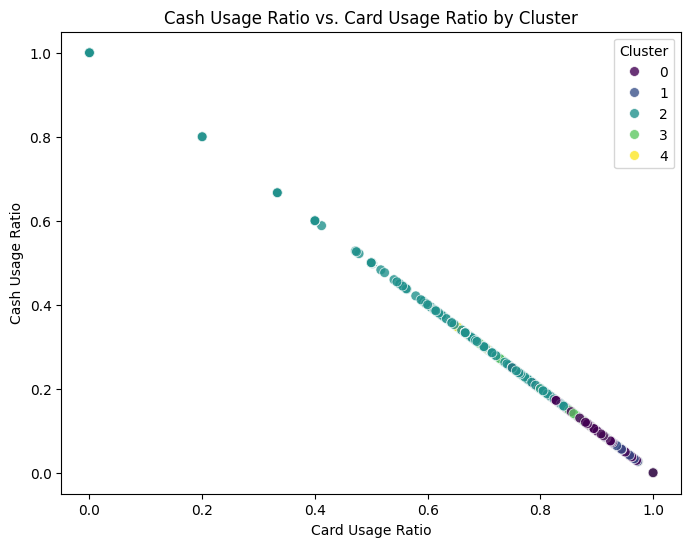

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=payment_behavior_df["Card_Usage_Ratio"],
    y=payment_behavior_df["Cash_Usage_Ratio"],
    hue=payment_behavior_df["payment_behavior_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Cash Usage Ratio vs. Card Usage Ratio by Cluster")
plt.xlabel("Card Usage Ratio")
plt.ylabel("Cash Usage Ratio")
plt.legend(title="Cluster")
plt.show()


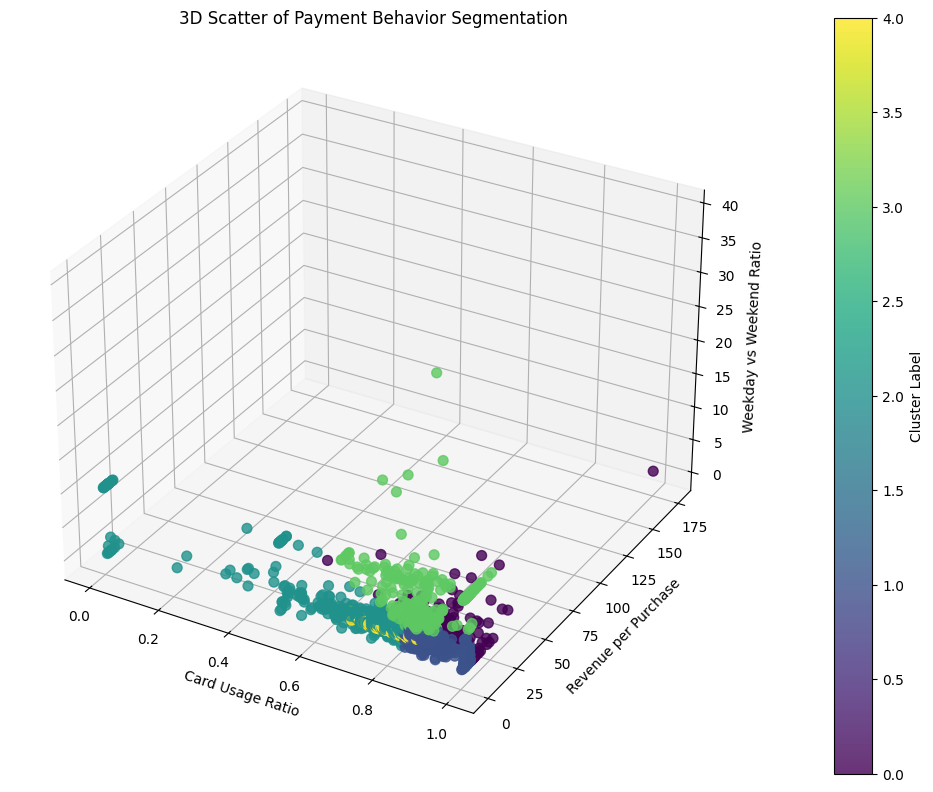

In [115]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    payment_behavior_df["Card_Usage_Ratio"],
    payment_behavior_df["Revenue_per_Purchase"],
    payment_behavior_df["Weekday_vs_Weekend_Ratio"],
    c=payment_behavior_df["payment_behavior_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("Card Usage Ratio")
ax.set_ylabel("Revenue per Purchase")
ax.set_zlabel("Weekday vs Weekend Ratio")
ax.set_title("3D Scatter of Payment Behavior Segmentation")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


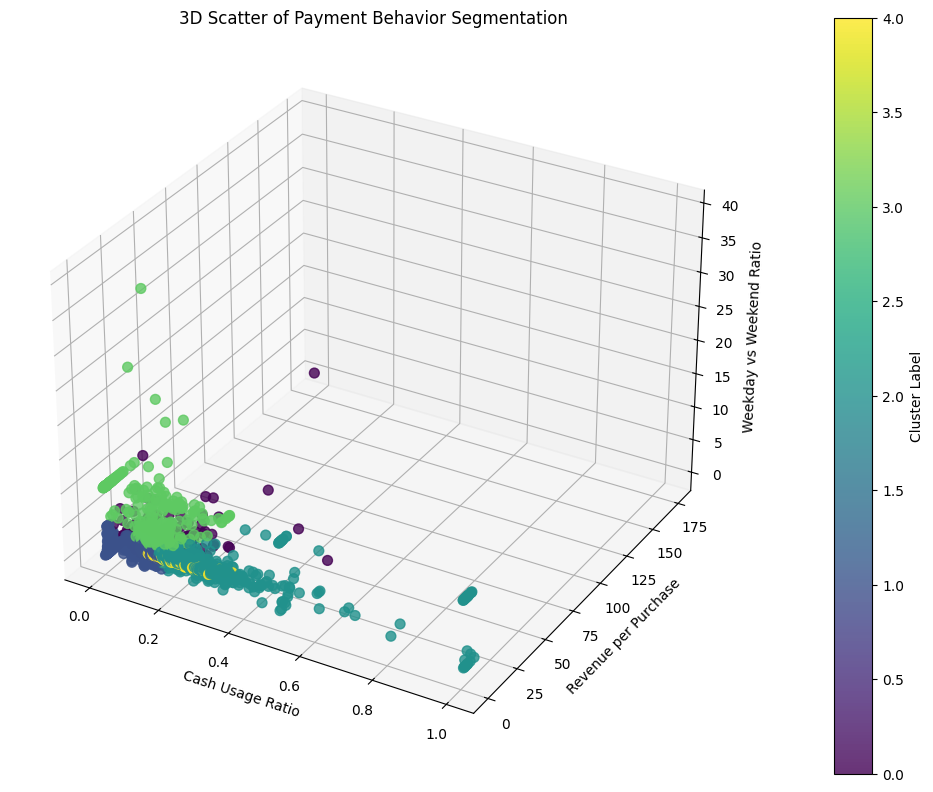

In [116]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    payment_behavior_df["Cash_Usage_Ratio"],
    payment_behavior_df["Revenue_per_Purchase"],
    payment_behavior_df["Weekday_vs_Weekend_Ratio"],
    c=payment_behavior_df["payment_behavior_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("Cash Usage Ratio")
ax.set_ylabel("Revenue per Purchase")
ax.set_zlabel("Weekday vs Weekend Ratio")
ax.set_title("3D Scatter of Payment Behavior Segmentation")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


In [117]:
# Flatten the multi-index columns
payment_summary.columns = ['_'.join(col) for col in payment_summary.columns]
payment_summary.reset_index(inplace=True)



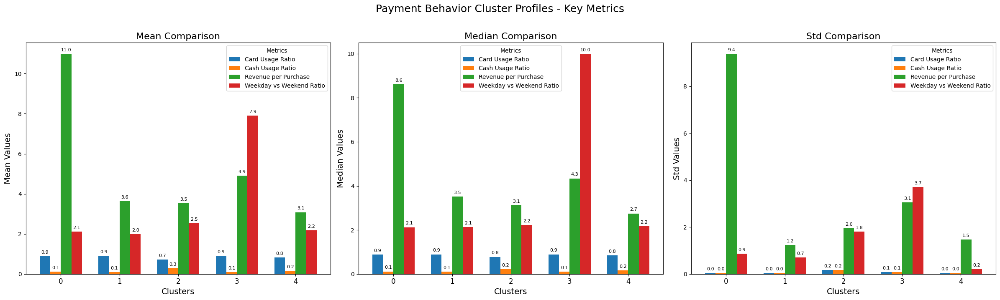

In [118]:
selected_metrics = [
    "Card_Usage_Ratio",
    "Cash_Usage_Ratio",
    "Revenue_per_Purchase",
    "Weekday_vs_Weekend_Ratio"
    
]

# Call your plotting function to visualize the Payment Behavior cluster profiles
mod.plot_cluster_metrics(
    payment_summary,
    selected_metrics,
    "Payment Behavior Cluster Profiles - Key Metrics",
    segmentation_column='payment_behavior_segmentation'
)

#### Cluster Labeling

**Cluster 0: "Premium Card-Favored Products"**  
**Label:** Premium Card-Favored Products  

**Description:**  
- **Revenue & Value:** These products generate the highest revenue per purchase, indicating premium pricing or high-value transactions.  
- **Payment Method:** Sales are predominantly made via card payments, with very high card usage ratios and minimal cash transactions.  
- **Sales Timing:** There is a clear weekday purchase preference, suggesting these products are often bought during business hours or by professional consumers.  

**Key Takeaway:**  
These products are high-value and are favored by customers who use cards, reflecting an upscale or convenience-driven purchase behavior.  

---

**Cluster 1: "Consistent Card-Purchased Products"**  
**Label:** Consistent Card-Purchased Products  

**Description:**  
- **Revenue & Volume:** These products show moderate revenue per purchase, reflecting steady, reliable sales performance.  
- **Payment Method:** Card payments are the primary method, though the ratios are slightly less extreme than in Cluster 0.  
- **Sales Timing:** They exhibit a balanced weekday/weekend ratio, suggesting consistent demand regardless of the day, though with a slight weekday tilt.  

**Key Takeaway:**  
These products maintain stable sales through card transactions, representing core offerings with dependable performance.  

---

**Cluster 2: "Cash-Dominant Products"**  
**Label:** Cash-Dominant Products  

**Description:**  
- **Revenue & Value:** Products in this cluster have lower-to-moderate revenue per purchase, which may indicate lower price points or everyday essentials.  
- **Payment Method:** They are characterized by a higher proportion of cash transactions, setting them apart from the predominantly card-driven clusters.  
- **Sales Timing:** The weekday vs. weekend purchase ratio is balanced, indicating no strong temporal buying pattern.  

**Key Takeaway:**  
These products appeal to segments that prefer cash transactions, which may reflect traditional buying patterns or regional payment preferences.  

---

**Cluster 3: "Weekday-Focused Card Products"**  
**Label:** Weekday-Focused Card Products  

**Description:**  
- **Revenue & Volume:** These products generate lower revenue per purchase compared to the premium clusters, suggesting smaller transaction sizes.  
- **Payment Method:** Sales occur mainly via card payments, with minimal cash usage.  
- **Sales Timing:** A distinctly high weekday-to-weekend ratio indicates that these products are purchased almost exclusively during weekdays, hinting at a work-related or business-oriented demand.  

**Key Takeaway:**  
These products serve a niche market with weekday-centric, card-based transactions, possibly linked to professional or B2B purchases.  

---

**Cluster 4: "Mass-Market Hybrid Payment Products"**  
**Label:** Mass-Market Hybrid Payment Products  

**Description:**  
- **Revenue & Volume:** Products here display moderate-to-low revenue per purchase, typical of mass-market or everyday items.  
- **Payment Method:** They have a mixed payment profile, with a significant share of both card and cash transactions, reflecting a broader customer base.  
- **Sales Timing:** The weekday vs. weekend ratio is relatively balanced, indicating steady demand throughout the week.  

**Key Takeaway:**  
These products cater to the mass market, appealing to a diverse set of customers with flexible payment preferences and consistent performance across different days.  


In [119]:
# Define a mapping dictionary based on the cluster analysis
cluster_mapping = {
    0: "Premium Card-Favored Products",
    1: "Consistent Card-Purchased Products",
    2: "Cash-Dominant Products",
    3: "Weekday-Focused Card Products",
    4: "Mass-Market Hybrid Payment Products"
}

# Apply the mapping to create a new column with meaningful labels
product_df["payment_behavior_segmentation"] = product_df["payment_behavior_segmentation"].map(cluster_mapping)

# Display the updated DataFrame
product_df.head()


,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,5
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,5
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",Consistent Card-Purchased Products,1,3
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,5
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,2023-09-30,0,1777,4077,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à 

### Geographical EDA

In [120]:
geographical_segmentation_df["geographical_segmentation"] = product_df["geographical_segmentation"]
# Distribution of purchase timing clusters
print(geographical_segmentation_df["geographical_segmentation"].value_counts())

geographical_segmentation
3    630
0    576
2    475
7    381
5    380
4    352
6    331
1    320
Name: count, dtype: int64


In [121]:
# Aggregate key geographical metrics by cluster
geographical_summary = geographical_segmentation_df.groupby("geographical_segmentation").agg({
    "City_Bron_Purchases_Proportion": ["mean", "median", "std"],
    "City_Décines_Purchases_Proportion": ["mean", "median", "std"],
    "City_Meyzieu_Purchases_Proportion": ["mean", "median", "std"],
    "City_Mions_Purchases_Proportion": ["mean", "median", "std"],
    "City_Vaulx-en-Velin_Purchases_Proportion": ["mean", "median", "std"],
    "Total_Revenue": ["mean", "median", "std"],
    "Total_Quantity": ["mean", "median", "std"],
    "Avg_Revenue": ["mean", "median", "std"],
    "Avg_Quantity": ["mean", "median", "std"]
})

geographical_summary


City_Bron_Purchases_Proportion                     City_Décines_Purchases_Proportion                     City_Meyzieu_Purchases_Proportion                     City_Mions_Purchases_Proportion                     City_Vaulx-en-Velin_Purchases_Proportion                     Total_Revenue                          Total_Quantity                         Avg_Revenue                      Avg_Quantity                    
                                       mean                median     std                   mean                 median     std                   mean                 median     std                  mean                median     std                      mean                     median     std         mean       median        std           mean        median       std          mean      median     std         mean       median     std   
geographical_segmentation                                                                                                                                                                                                                                                                                                                                                                                                                                
0                                    0.211943             0.234179  0.099887              0.181831              0.192578  0.080954              0.203633              0.133627  0.206652             0.205641             0.222746  0.094320                 0.196951                  0.199817  0.093913   7797.771111   4958.685   8607.368726   2407.579201    1363.28   2818.289263    3.096157  2.712004   1.617406   0.857201    1.015906  0.312134
1                                    0.122669             0.061023  0.136394              0.106039              0.083999  0.110941              0.051097              0.004457  0.070203             0.148690             0.132523  0.149195                 0.571506                  0.500000  0.275849   3399.683344    475.385   6804.250994   1009.679344     105.00   2290.501472    5.133425  4.094542   4.121710   1.033389    1.062500  0.346242
2                                    0.170197             0.208333  0.151878              0.088712              0.083333  0.091782              0.028577              0.000000  0.043953             0.630400             0.525253  0.275300                 0.082113                  0.052500  0.089455   3353.332589    602.580   6132.898292    951.213053     141.00   1891.326883    4.682188  4.082178   2.538240   1.083048    1.045662  0.181451
3                                    0.517620             0.401112  0.240325              0.121176              0.146665  0.086426              0.036962              0.033360  0.040749             0.204080             0.250000  0.127888                 0.120162                  0.139428  0.083995   4531.866571   2083.795   6471.758158   1320.044635     601.00   1914.465197    4.223152  3.885218   1.959869   1.081149    1.062617  0.186886
4                                    0.253895             0.260773  0.087140              0.189141              0.183684  0.080587              0.110244              0.103124  0.052648             0.237870             0.242787  0.086769                 0.208851                  0.203972  0.076258  10239.059489   6143.230  12215.728206   5458.685455    3070.00   9016.810374    3.461564  3.045814   1.773604   1.598889    1.357918  0.706116
5                                    0.255642             0.255233  0.060807              0.197006              0.191841  0.040372              0.111910              0.102959  0.047259             0.241784             0.246054  0.055660                 0.193658                  0.191718  0.042775  83326.351632  56742.425  82358.850755  31122.191789   18995.00  45837.875791    3.680179  3.277913   1.959261   1.109886    1.100082  0.442794
6                                    0.144965   

In [122]:
# Flatten the multi-indexed columns
geographical_summary.columns = ['_'.join(col) for col in geographical_summary.columns]
geographical_summary.reset_index(inplace=True)

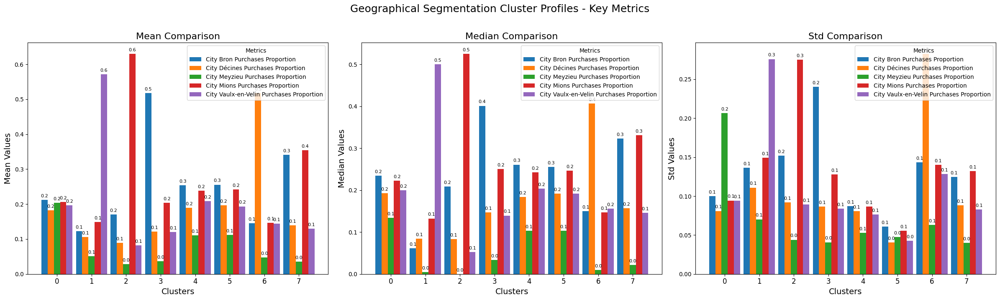

In [123]:
# Define the selected metrics (adjust the list based on your priorities)
selected_metrics = [
    "City_Bron_Purchases_Proportion",
    "City_Décines_Purchases_Proportion",
    "City_Meyzieu_Purchases_Proportion",
    "City_Mions_Purchases_Proportion",
    "City_Vaulx-en-Velin_Purchases_Proportion"
]

# Plot cluster profiles using the selected metrics
mod.plot_cluster_metrics(
    geographical_summary,
    selected_metrics,
    "Geographical Segmentation Cluster Profiles - Key Metrics",
    segmentation_column="geographical_segmentation"
)


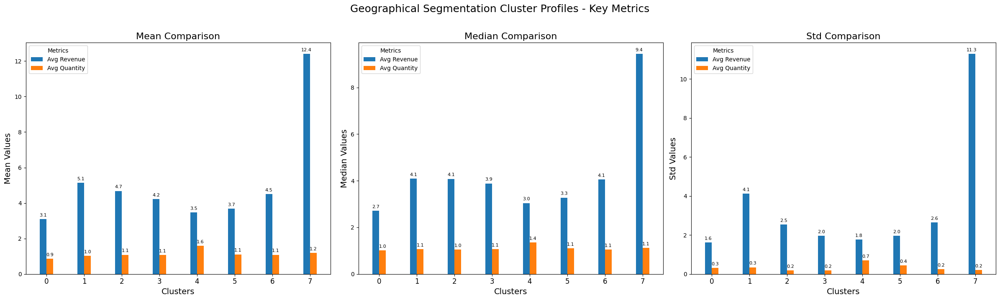

In [124]:
# Define the selected metrics (adjust the list based on your priorities)
selected_metrics = [
   
    "Avg_Revenue",
   
    "Avg_Quantity"
]

# Plot cluster profiles using the selected metrics
mod.plot_cluster_metrics(
    geographical_summary,
    selected_metrics,
    "Geographical Segmentation Cluster Profiles - Key Metrics",
    segmentation_column="geographical_segmentation"
)


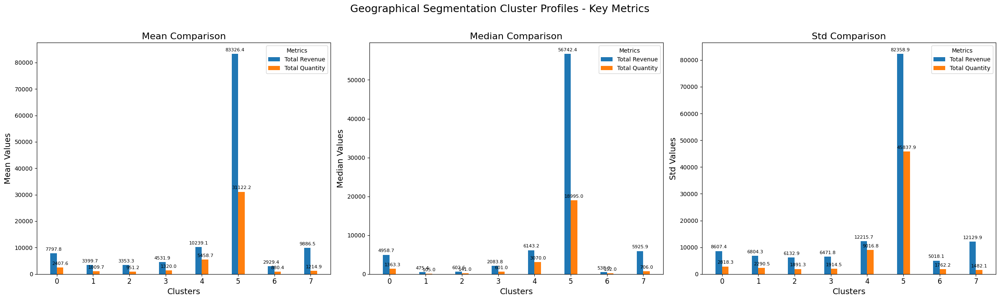

In [125]:


# Define the selected metrics (adjust the list based on your priorities)
selected_metrics = [
 "Total_Revenue", "Total_Quantity"
]

# Plot cluster profiles using the selected metrics
mod.plot_cluster_metrics(
    geographical_summary,
    selected_metrics,
    "Geographical Segmentation Cluster Profiles - Key Metrics",
    segmentation_column="geographical_segmentation"
)


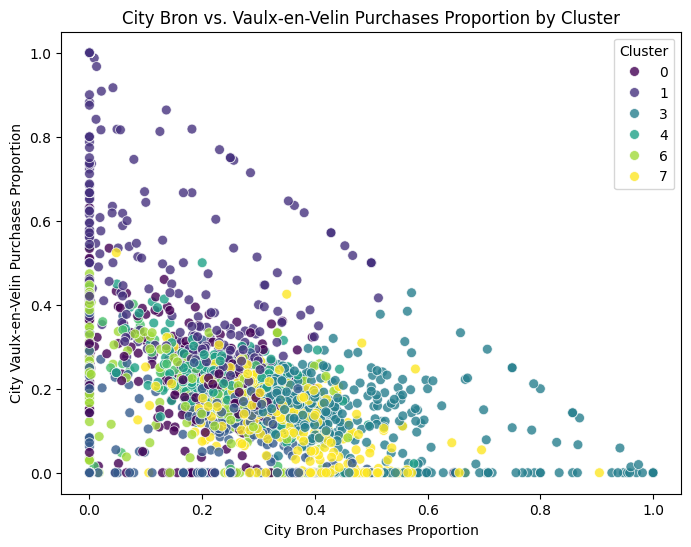

In [126]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=geographical_segmentation_df["City_Bron_Purchases_Proportion"],
    y=geographical_segmentation_df["City_Vaulx-en-Velin_Purchases_Proportion"],
    hue=geographical_segmentation_df["geographical_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("City Bron vs. Vaulx-en-Velin Purchases Proportion by Cluster")
plt.xlabel("City Bron Purchases Proportion")
plt.ylabel("City Vaulx-en-Velin Purchases Proportion")
plt.legend(title="Cluster")
plt.show()


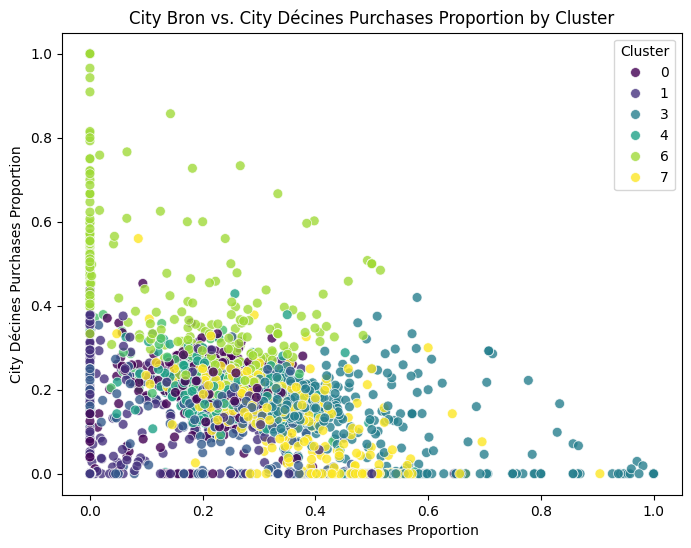

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=geographical_segmentation_df,
    x="City_Bron_Purchases_Proportion",
    y="City_Décines_Purchases_Proportion",
    hue="geographical_segmentation",
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("City Bron vs. City Décines Purchases Proportion by Cluster")
plt.xlabel("City Bron Purchases Proportion")
plt.ylabel("City Décines Purchases Proportion")
plt.legend(title="Cluster")
plt.show()


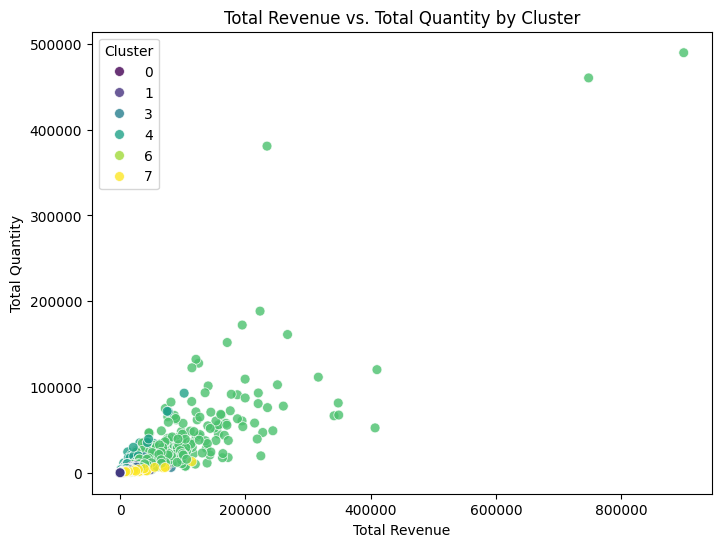

In [128]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=geographical_segmentation_df,
    x="Total_Revenue",
    y="Total_Quantity",
    hue="geographical_segmentation",
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Total Revenue vs. Total Quantity by Cluster")
plt.xlabel("Total Revenue")
plt.ylabel("Total Quantity")
plt.legend(title="Cluster")
plt.show()


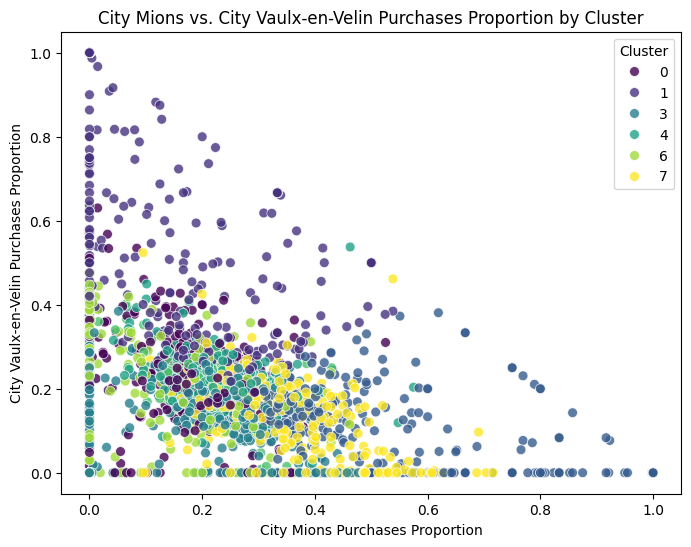

In [129]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=geographical_segmentation_df,
    x="City_Mions_Purchases_Proportion",
    y="City_Vaulx-en-Velin_Purchases_Proportion",
    hue="geographical_segmentation",
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("City Mions vs. City Vaulx-en-Velin Purchases Proportion by Cluster")
plt.xlabel("City Mions Purchases Proportion")
plt.ylabel("City Vaulx-en-Velin Purchases Proportion")
plt.legend(title="Cluster")
plt.show()


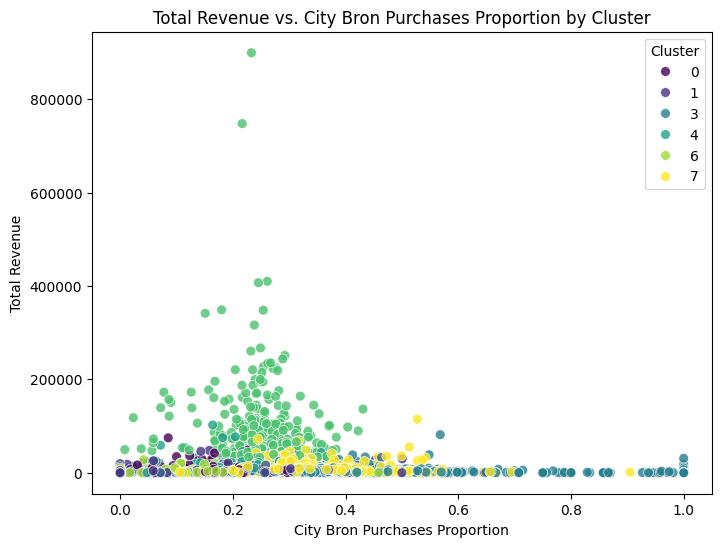

In [130]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=geographical_segmentation_df["City_Bron_Purchases_Proportion"],
    y=geographical_segmentation_df["Total_Revenue"],
    hue=geographical_segmentation_df["geographical_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Total Revenue vs. City Bron Purchases Proportion by Cluster")
plt.xlabel("City Bron Purchases Proportion")
plt.ylabel("Total Revenue")
plt.legend(title="Cluster")
plt.show()


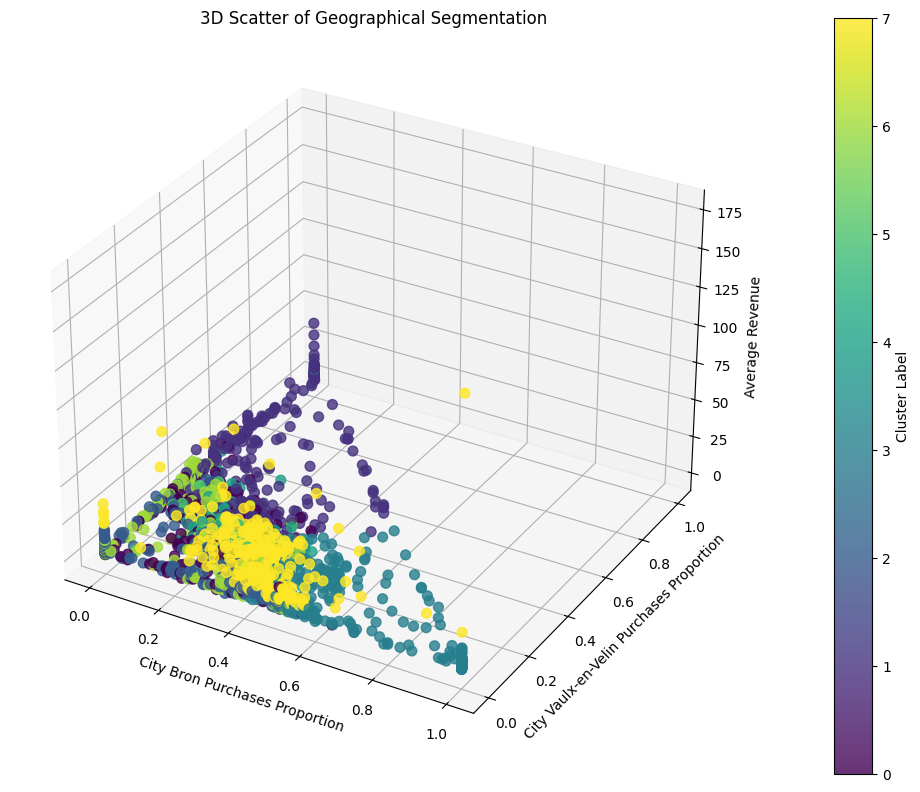

In [131]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    geographical_segmentation_df["City_Bron_Purchases_Proportion"],
    geographical_segmentation_df["City_Vaulx-en-Velin_Purchases_Proportion"],
    geographical_segmentation_df["Avg_Revenue"],
    c=geographical_segmentation_df["geographical_segmentation"],  # cluster labels
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("City Bron Purchases Proportion")
ax.set_ylabel("City Vaulx-en-Velin Purchases Proportion")
ax.set_zlabel("Average Revenue")
ax.set_title("3D Scatter of Geographical Segmentation")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


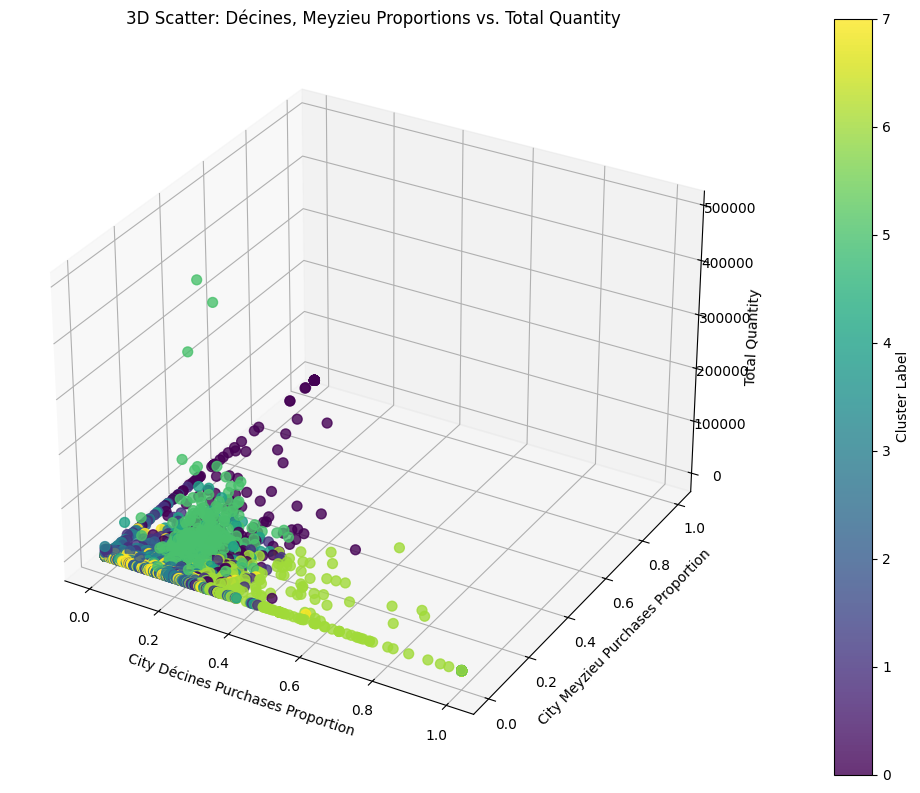

In [132]:
from mpl_toolkits.mplot3d import Axes3D  # necessary for 3D plotting
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    geographical_segmentation_df["City_Décines_Purchases_Proportion"],
    geographical_segmentation_df["City_Meyzieu_Purchases_Proportion"],
    geographical_segmentation_df["Total_Quantity"],
    c=geographical_segmentation_df["geographical_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("City Décines Purchases Proportion")
ax.set_ylabel("City Meyzieu Purchases Proportion")
ax.set_zlabel("Total Quantity")
ax.set_title("3D Scatter: Décines, Meyzieu Proportions vs. Total Quantity")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


In [133]:
# List the city proportion columns (adjust the names if needed)
city_columns = [
    "City_Bron_Purchases_Proportion",
    "City_Décines_Purchases_Proportion",
    "City_Meyzieu_Purchases_Proportion",
    "City_Mions_Purchases_Proportion",
    "City_Vaulx-en-Velin_Purchases_Proportion"
]

# Compute the average proportion of purchases for each city within each cluster
cluster_city_summary_mean = geographical_segmentation_df.groupby("geographical_segmentation")[city_columns].mean()

# Optionally, compute the median as well
cluster_city_summary_median = geographical_segmentation_df.groupby("geographical_segmentation")[city_columns].median()

print("Average City Proportions by Cluster:")
print(cluster_city_summary_mean)
print("\nMedian City Proportions by Cluster:")
print(cluster_city_summary_median)


Average City Proportions by Cluster:
                           City_Bron_Purchases_Proportion  City_Décines_Purchases_Proportion  City_Meyzieu_Purchases_Proportion  City_Mions_Purchases_Proportion  City_Vaulx-en-Velin_Purchases_Proportion
geographical_segmentation                                                                                                                                                                                 
0                                     0.211943                         0.181831                           0.203633                          0.205641                              0.196951                
1                                     0.122669                         0.106039                           0.051097                          0.148690                              0.571506                
2                                     0.170197                         0.088712                           0.028577                          0.630400   

In [134]:
import pandas as pd

# Suppose cluster_city_summary_mean is indexed by cluster label and columns are city proportion columns
# For example:
# cluster_city_summary_mean.columns = [
#   "City_Bron_Purchases_Proportion", 
#   "City_Décines_Purchases_Proportion", 
#   "City_Meyzieu_Purchases_Proportion", 
#   "City_Mions_Purchases_Proportion", 
#   "City_Vaulx-en-Velin_Purchases_Proportion"
# ]

# 1. Identify the city with the highest proportion for each cluster
max_city_per_cluster = cluster_city_summary_mean.idxmax(axis=1)

# 2. Identify the city with the lowest proportion for each cluster
min_city_per_cluster = cluster_city_summary_mean.idxmin(axis=1)

print("City with the HIGHEST average proportion per cluster:")
print(max_city_per_cluster)
print("\nCity with the LOWEST average proportion per cluster:")
print(min_city_per_cluster)


City with the HIGHEST average proportion per cluster:
geographical_segmentation
0              City_Bron_Purchases_Proportion
1    City_Vaulx-en-Velin_Purchases_Proportion
2             City_Mions_Purchases_Proportion
3              City_Bron_Purchases_Proportion
4              City_Bron_Purchases_Proportion
5              City_Bron_Purchases_Proportion
6           City_Décines_Purchases_Proportion
7             City_Mions_Purchases_Proportion
dtype: object

City with the LOWEST average proportion per cluster:
geographical_segmentation
0    City_Décines_Purchases_Proportion
1    City_Meyzieu_Purchases_Proportion
2    City_Meyzieu_Purchases_Proportion
3    City_Meyzieu_Purchases_Proportion
4    City_Meyzieu_Purchases_Proportion
5    City_Meyzieu_Purchases_Proportion
6    City_Meyzieu_Purchases_Proportion
7    City_Meyzieu_Purchases_Proportion
dtype: object


In [135]:
def rank_city_proportions(row):
    # Sort the row in descending order by proportion
    sorted_row = row.sort_values(ascending=False)
    return sorted_row

# Apply this function to each row in cluster_city_summary_mean
cluster_city_rankings = cluster_city_summary_mean.apply(rank_city_proportions, axis=1)

print("Descending City Proportion Rankings for Each Cluster:")
print(cluster_city_rankings)


Descending City Proportion Rankings for Each Cluster:
                           City_Bron_Purchases_Proportion  City_Décines_Purchases_Proportion  City_Meyzieu_Purchases_Proportion  City_Mions_Purchases_Proportion  City_Vaulx-en-Velin_Purchases_Proportion
geographical_segmentation                                                                                                                                                                                 
0                                     0.211943                         0.181831                           0.203633                          0.205641                              0.196951                
1                                     0.122669                         0.106039                           0.051097                          0.148690                              0.571506                
2                                     0.170197                         0.088712                           0.028577                    

In [136]:
max_city_per_cluster = cluster_city_summary_mean.idxmax(axis=1)
print("Dominant city for each cluster:\n", max_city_per_cluster)


Dominant city for each cluster:
 geographical_segmentation
0              City_Bron_Purchases_Proportion
1    City_Vaulx-en-Velin_Purchases_Proportion
2             City_Mions_Purchases_Proportion
3              City_Bron_Purchases_Proportion
4              City_Bron_Purchases_Proportion
5              City_Bron_Purchases_Proportion
6           City_Décines_Purchases_Proportion
7             City_Mions_Purchases_Proportion
dtype: object


In [137]:
cluster_counts = geographical_segmentation_df["geographical_segmentation"].value_counts()
print(cluster_counts)


geographical_segmentation
3    630
0    576
2    475
7    381
5    380
4    352
6    331
1    320
Name: count, dtype: int64


In [138]:
# If each row has a 'Total_Revenue' for that product
revenue_contribution = geographical_segmentation_df.groupby("geographical_segmentation")["Total_Revenue"].sum()
print("Total Revenue Contribution by Cluster:\n", revenue_contribution)


Total Revenue Contribution by Cluster:
 geographical_segmentation
0     4491516.16
1     1087898.67
2     1592832.98
3     2855075.94
4     3604148.94
5    31664013.62
6      969619.62
7     3766743.54
Name: Total_Revenue, dtype: float64


#### Cluster Labeling

**Geographical Segmentation Clusters**

**Cluster 0: Balanced Regional Mix**  
**Description:**  
Products in this cluster have a very balanced distribution across multiple cities (Bron, Décines, Meyzieu, Mions, and Vaulx-en-Velin), with proportions hovering around 0.2 for all. Revenue contribution is substantial (4.49 million), showing that these products are popular consistently across the region, not skewed toward any specific city.  

**Key Reasoning:**  
- Even distribution across cities.  
- Good overall revenue indicating balanced regional popularity.  

---

**Cluster 1: Vaulx-en-Velin Specialists**  
**Description:**  
Products in this cluster predominantly cater to Vaulx-en-Velin, with over 57% of purchases coming from there, significantly higher than other cities. Revenue is moderate (1.08 million), highlighting specialized yet moderately popular products within this specific geographical niche.  

**Key Reasoning:**  
- High specialization in Vaulx-en-Velin.  
- Moderate revenue indicating targeted but niche popularity.  

---

**Cluster 2: Mions-Centric Products**  
**Description:**  
Products strongly favored in Mions (63% purchases). Despite lower shares from other cities, revenue remains moderate (1.59 million), suggesting strong loyalty and possibly specialized offerings in Mions.  

**Key Reasoning:**  
- Clear dominance of Mions in terms of purchases.  
- Moderate revenue reflecting good local appeal.  

---

**Cluster 3: Bron-Focused Leaders**  
**Description:**  
Products primarily popular in Bron, with 52% purchase proportion. Notably high revenue (2.85 million) indicating these products are regionally important and particularly valued by consumers in Bron, possibly due to tailored marketing or product relevance.  

**Key Reasoning:**  
- Significant popularity in Bron.  
- High revenue indicating strong regional presence.  

---

**Cluster 4: Multi-City Moderate Performers**  
**Description:**  
Products moderately popular across all cities with Bron slightly leading (25%). They achieve strong combined revenue (3.60 million) reflecting consistent popularity and acceptance across multiple locations, indicating general regional appeal.  

**Key Reasoning:**  
- Moderate popularity across several cities.  
- Strong aggregate revenue highlighting broader regional market strength.  

---

**Cluster 5: Regional Best-Sellers**  
**Description:**  
This cluster stands out with extremely high total revenue (31.66 million), significantly surpassing other clusters. Distribution across cities is balanced but slightly leaning towards Bron (25%). This represents products that are regionally strong and drive major revenue, widely popular and crucial for regional business.  

**Key Reasoning:**  
- Highest overall revenue by a significant margin.  
- Strong presence in multiple cities, particularly Bron, indicating broad regional appeal.  

---

**Cluster 6: Décines Specialists**  
**Description:**  
Heavily focused on Décines, accounting for 51% of purchases, with modest revenue (0.97 million). Likely niche products strongly preferred in Décines, but less impactful regionally.  

**Key Reasoning:**  
- Décines strongly dominates purchase proportions.  
- Lower revenue suggests niche appeal.  

---

**Cluster 7: Mions-Bron Dual Appeal**  
**Description:**  
Products in this cluster show dual appeal predominantly in Mions (35%) and Bron (34%), with significant revenue contribution (3.77 million). This dual-city dominance suggests strategic relevance or tailored appeal specifically to these two cities.  

**Key Reasoning:**  
- Clear dominance in two cities (Mions and Bron).  
- Good overall revenue indicating combined city strength.  


In [139]:
# Define a mapping dictionary based on the geographical segmentation analysis
geo_cluster_mapping = {
    0: "Balanced Regional Mix",
    1: "Vaulx-en-Velin Specialists",
    2: "Mions-Centric Products",
    3: "Bron-Focused Leaders",
    4: "Multi-City Moderate Performers",
    5: "Regional Best-Sellers",
    6: "Décines Specialists",
    7: "Mions-Bron Dual Appeal"
}

# Apply the mapping to create a new column with meaningful names
product_df["geographical_segmentation"] = product_df["geographical_segmentation"].map(geo_cluster_mapping)

# Display the updated DataFrame
product_df.head()


,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,Regional Best-Sellers
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,Regional Best-Sellers
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",Consistent Card-Purchased Products,1,Bron-Focused Leaders
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,0,Regional Best-Sellers
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,202

### Overall Product Segmentation EDA

In [140]:
product_segmentation_df["product_segmentation"] = product_df["product_segmentation"]
# Distribution of purchase timing clusters
print(product_segmentation_df["product_segmentation"].value_counts())

product_segmentation
0    848
4    848
1    781
3    582
2    386
Name: count, dtype: int64


In [141]:
# Example: Summarize all columns with mean, median, and std
# Adjust or subset columns as needed
product_summary = product_segmentation_df.groupby("product_segmentation").agg({
    "Count_of_Purchases": ["mean", "median", "std"],
    "Total_Quantity": ["mean", "median", "std"],
    "Total_Revenue": ["mean", "median", "std"],
    "Days_Since_Last_Purchase": ["mean", "median", "std"],
    "Number_of_Customers": ["mean", "median", "std"],
    "Avg_Quantity": ["mean", "median", "std"],
    "Avg_Revenue": ["mean", "median", "std"],
    "Revenue_per_Purchase": ["mean", "median", "std"],
    "Quantity_per_Purchase": ["mean", "median", "std"],
    "Promotion_Nationale_Count": ["mean", "median", "std"],
    "Promotion_Magasin_Count": ["mean", "median", "std"],
    "Revenue_per_Day_Since_Last_Purchase": ["mean", "median", "std"],
    "Quantity_per_Day_Since_Last_Purchase": ["mean", "median", "std"],
    "Weekday_vs_Weekend_Ratio": ["mean", "median", "std"],
    "Morning_Proportion": ["mean", "median", "std"],
    "Afternoon_Proportion": ["mean", "median", "std"],
    "Evening_Proportion": ["mean", "median", "std"],
    "Repeat_Purchase_Rate": ["mean", "median", "std"],
    "Revenue_per_Customer": ["mean", "median", "std"],
    "Quantity_per_Customer": ["mean", "median", "std"],
    "Card_Usage_Ratio": ["mean", "median", "std"],
    "Cash_Usage_Ratio": ["mean", "median", "std"],
    "City_Bron_Purchases_Proportion": ["mean", "median", "std"],
    "City_Décines_Purchases_Proportion": ["mean", "median", "std"],
    "City_Meyzieu_Purchases_Proportion": ["mean", "median", "std"],
    "City_Mions_Purchases_Proportion": ["mean", "median", "std"],
    "City_Vaulx-en-Velin_Purchases_Proportion": ["mean", "median", "std"]
})

product_summary


Count_of_Purchases                       Total_Quantity                       Total_Revenue                          Days_Since_Last_Purchase                    Number_of_Customers                      Avg_Quantity                     Avg_Revenue                     Revenue_per_Purchase                     Quantity_per_Purchase                     Promotion_Nationale_Count                     Promotion_Magasin_Count                     Revenue_per_Day_Since_Last_Purchase                             Quantity_per_Day_Since_Last_Purchase                            Weekday_vs_Weekend_Ratio                     Morning_Proportion                     Afternoon_Proportion                     Evening_Proportion                     Repeat_Purchase_Rate                     Revenue_per_Customer                       Quantity_per_Customer                     Card_Usage_Ratio                     Cash_Usage_Ratio                     City_Bron_Purchases_Proportion            \
                            mean         median      std           mean       median      std           mean       median        std                mean           median     std             mean         median     std          mean       median     std        mean      median     std            mean           median     std             mean           median     std               mean           median     std                mean          median     std                      mean                    median         std                      mean                    median         std                mean             median     std           mean          median     std            mean           median     std           mean          median     std            mean           median     std            mean           median      std              mean           median     std          mean         median     std          mean         median     std                 mean                median    
product_segmentation                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
0                       15154.764151     7998.5  23605.222802  17346.661639   8774.5  33592.436902  44509.479163  23321.090  65625.310520         26.299528           0.0   58.864841      7787.541274     4670.0  9494.623396   1.165139    1.118779  0.466580    3.313524  3.039860  1.635106        3.313524       3.039860  1.635106        1.165139        1.118779  0.466580         906.082547          0.0   2876.830946        1352.023585       664.0  3047.571431             32456.335696             14521.100000  59131.757447             13078.924015              5374.500000  29601.386173         2.289729          2.199175  0.828614      0.364162       0.354929  0.081879       0.389721        0.391006  0.059923      0.246118       0.248751  0.060722       0.224092        0.217469  0.085660        5.969623        5.316817   3.130042        2.118536        1.962249  1.058046     0.807464      0.834516  0.114033     0.192536      0.165484  0.114033            0.238191             0.252038   
1                        1327.247

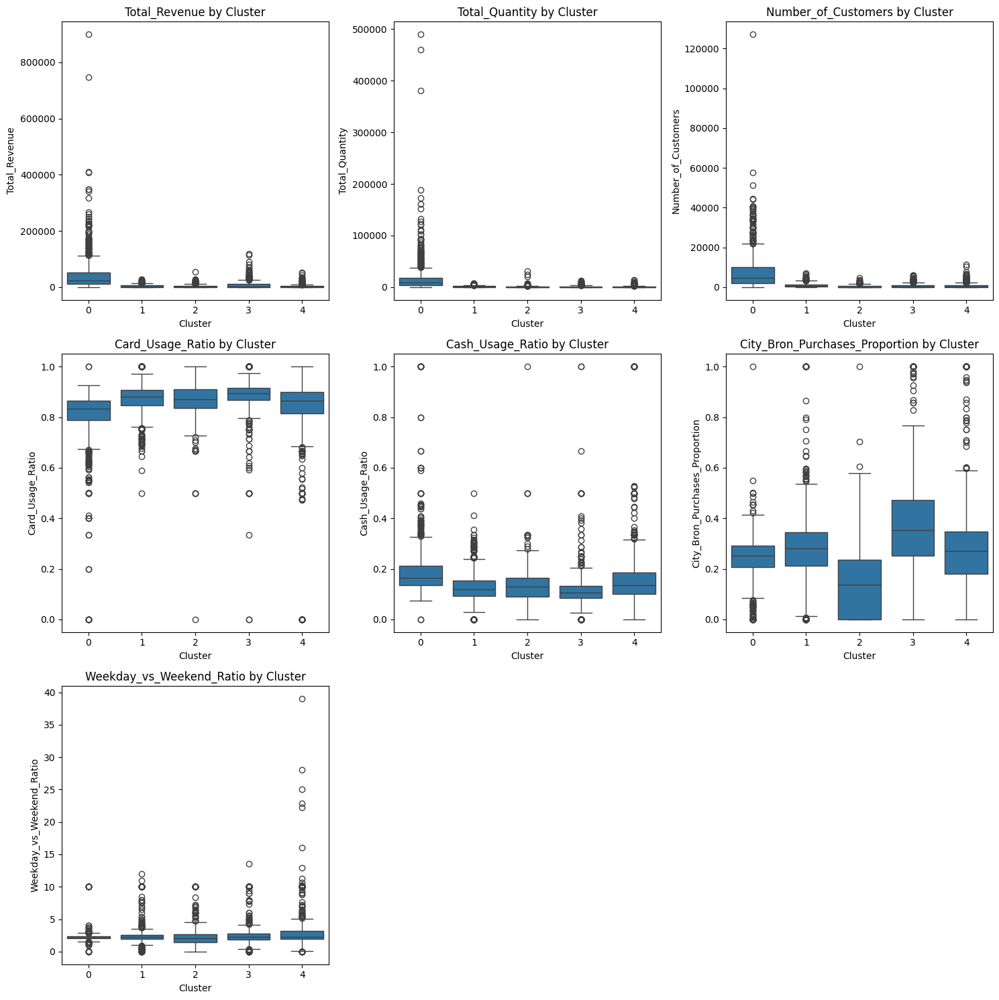

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Choose a subset of features to visualize with boxplots
features = [
    "Total_Revenue",
    "Total_Quantity",
    "Number_of_Customers",
    "Card_Usage_Ratio",
    "Cash_Usage_Ratio",
    "City_Bron_Purchases_Proportion",
    "Weekday_vs_Weekend_Ratio"
    # Add or remove as needed
]

n_cols = 3
n_rows = math.ceil(len(features) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.boxplot(
        data=product_segmentation_df,
        x="product_segmentation",
        y=feature,
        ax=axes[i]
    )
    axes[i].set_title(f"{feature} by Cluster")
    axes[i].set_xlabel("Cluster")
    axes[i].set_ylabel(feature)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


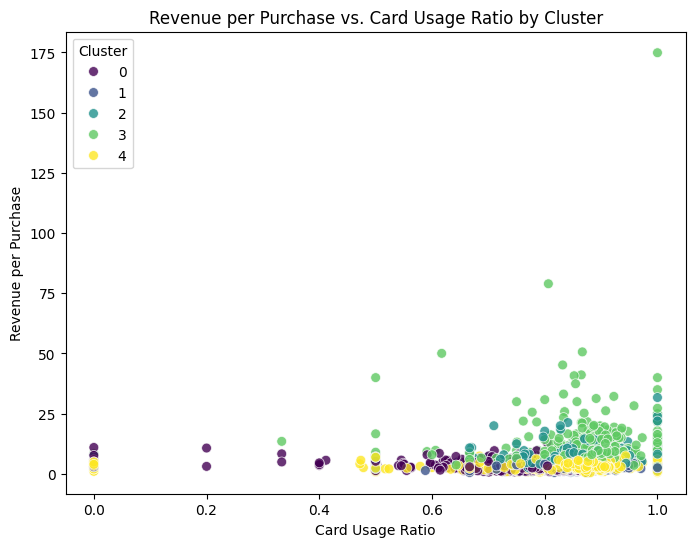

In [143]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x=product_segmentation_df["Card_Usage_Ratio"],
    y=product_segmentation_df["Revenue_per_Purchase"],
    hue=product_segmentation_df["product_segmentation"],
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Revenue per Purchase vs. Card Usage Ratio by Cluster")
plt.xlabel("Card Usage Ratio")
plt.ylabel("Revenue per Purchase")
plt.legend(title="Cluster")
plt.show()


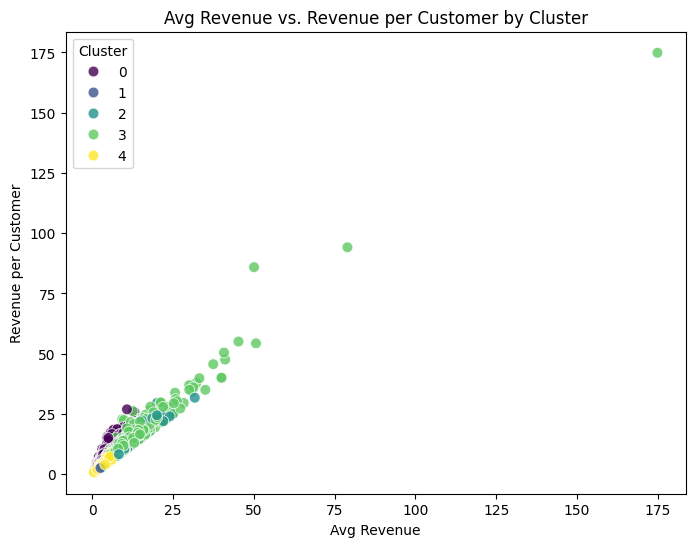

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=product_segmentation_df,
    x="Avg_Revenue",
    y="Revenue_per_Customer",
    hue="product_segmentation",
    palette="viridis",
    s=60,
    alpha=0.8
)
plt.title("Avg Revenue vs. Revenue per Customer by Cluster")
plt.xlabel("Avg Revenue")
plt.ylabel("Revenue per Customer")
plt.legend(title="Cluster")
plt.show()


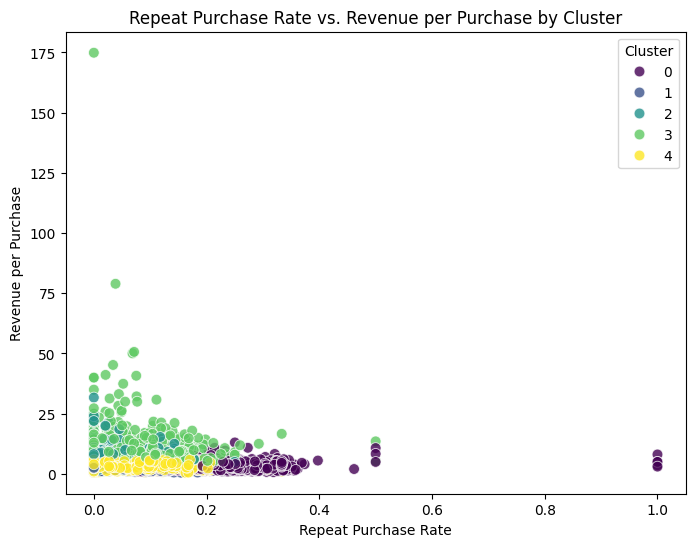

In [145]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=product_segmentation_df,
    x="Repeat_Purchase_Rate",
    y="Revenue_per_Purchase",
    hue="product_segmentation",
    palette="viridis",
    s=60,
    alpha=0.8
)
plt.title("Repeat Purchase Rate vs. Revenue per Purchase by Cluster")
plt.xlabel("Repeat Purchase Rate")
plt.ylabel("Revenue per Purchase")
plt.legend(title="Cluster")
plt.show()


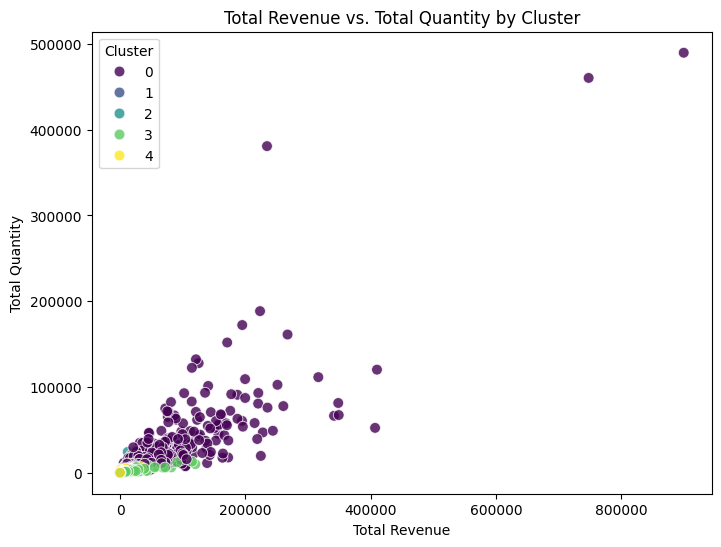

In [146]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=product_segmentation_df,
    x="Total_Revenue",
    y="Total_Quantity",
    hue="product_segmentation",
    palette="viridis",
    s=60,
    alpha=0.8
)
plt.title("Total Revenue vs. Total Quantity by Cluster")
plt.xlabel("Total Revenue")
plt.ylabel("Total Quantity")
plt.legend(title="Cluster")
plt.show()


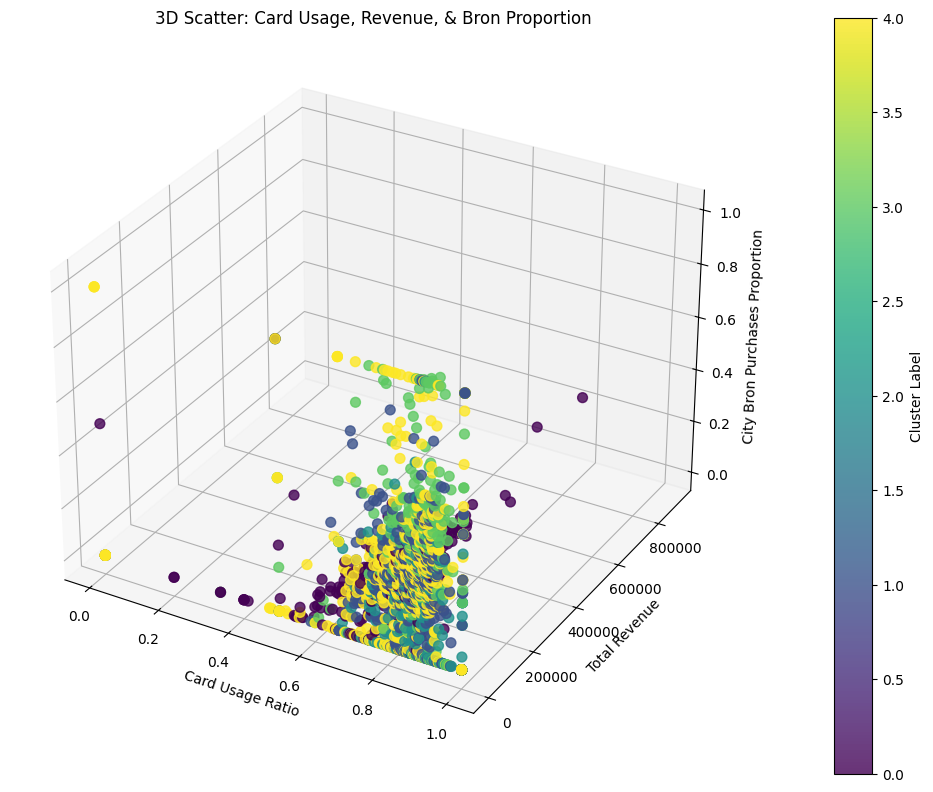

In [147]:
from mpl_toolkits.mplot3d import Axes3D  # required for 3D plotting
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    product_segmentation_df["Card_Usage_Ratio"],
    product_segmentation_df["Total_Revenue"],
    product_segmentation_df["City_Bron_Purchases_Proportion"],
    c=product_segmentation_df["product_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("Card Usage Ratio")
ax.set_ylabel("Total Revenue")
ax.set_zlabel("City Bron Purchases Proportion")
ax.set_title("3D Scatter: Card Usage, Revenue, & Bron Proportion")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")
plt.tight_layout()
plt.show()


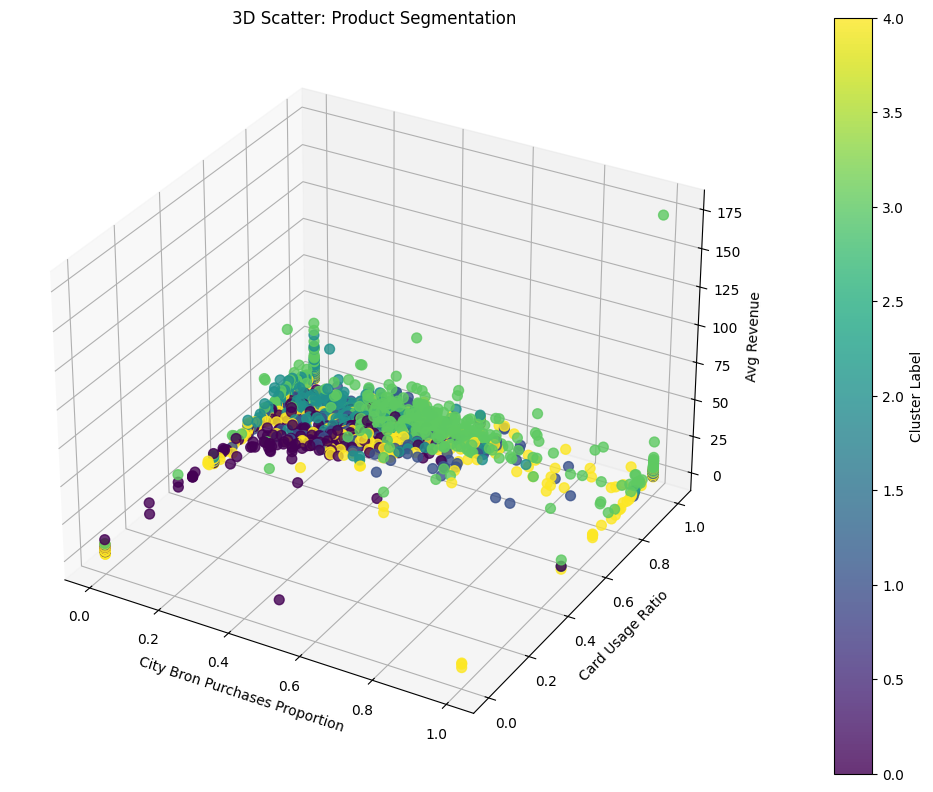

In [148]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    product_segmentation_df["City_Bron_Purchases_Proportion"],
    product_segmentation_df["Card_Usage_Ratio"],
    product_segmentation_df["Avg_Revenue"],
    c=product_segmentation_df["product_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("City Bron Purchases Proportion")
ax.set_ylabel("Card Usage Ratio")
ax.set_zlabel("Avg Revenue")
ax.set_title("3D Scatter: Product Segmentation")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")

plt.tight_layout()
plt.show()


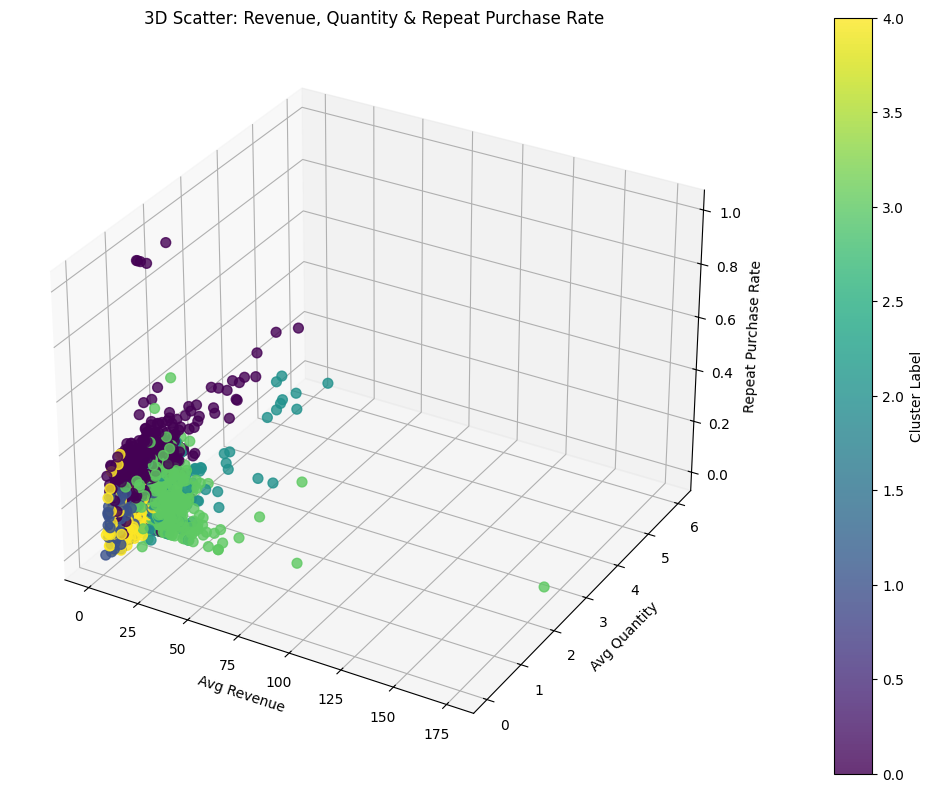

In [149]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    product_segmentation_df["Avg_Revenue"],
    product_segmentation_df["Avg_Quantity"],
    product_segmentation_df["Repeat_Purchase_Rate"],
    c=product_segmentation_df["product_segmentation"],
    cmap="viridis",
    s=50,
    alpha=0.8
)

ax.set_xlabel("Avg Revenue")
ax.set_ylabel("Avg Quantity")
ax.set_zlabel("Repeat Purchase Rate")
ax.set_title("3D Scatter: Revenue, Quantity & Repeat Purchase Rate")

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Cluster Label")
plt.tight_layout()
plt.show()


In [151]:
# Flatten the multi-indexed columns
product_summary.columns = ['_'.join(col) for col in product_summary.columns]
product_summary.reset_index(inplace=True)

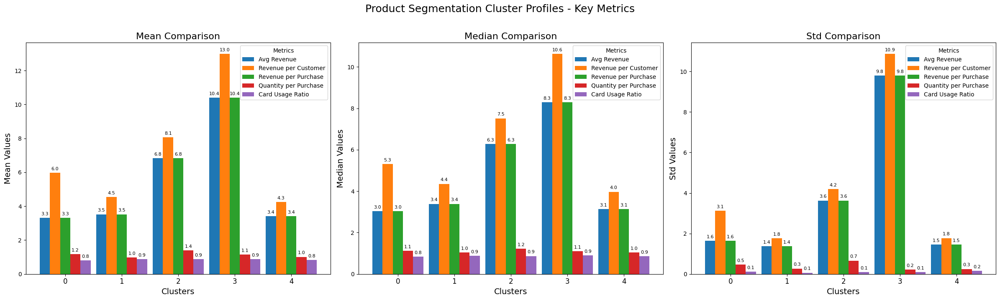

In [152]:
# Select key metrics for visualization:
selected_metrics = [
    "Avg_Revenue",
    "Revenue_per_Customer",
    "Revenue_per_Purchase",
    "Quantity_per_Purchase",
    "Card_Usage_Ratio",
   
]

# Plot cluster profiles using the selected metrics:
mod.plot_cluster_metrics(
    product_summary,
    selected_metrics,
    "Product Segmentation Cluster Profiles - Key Metrics",
    segmentation_column="product_segmentation"
)

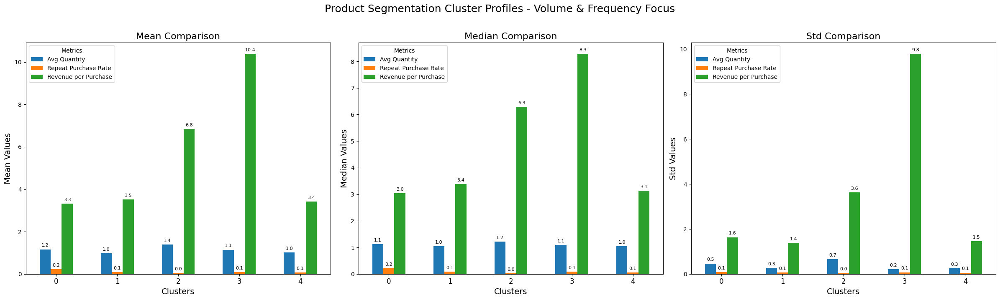

In [153]:
selected_metrics_alt = [
  
  
    "Avg_Quantity",
    "Repeat_Purchase_Rate",
    "Revenue_per_Purchase",

]

mod.plot_cluster_metrics(
    product_summary,
    selected_metrics_alt,
    "Product Segmentation Cluster Profiles - Volume & Frequency Focus",
    segmentation_column="product_segmentation"
)


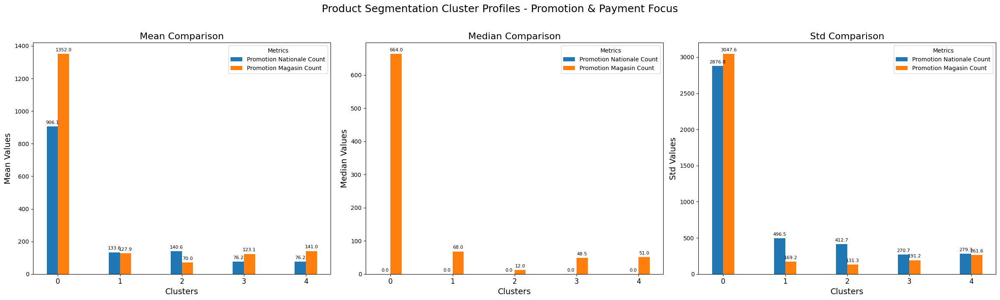

In [154]:
selected_metrics_alt2 = [
    "Promotion_Nationale_Count",
    "Promotion_Magasin_Count",
]

mod.plot_cluster_metrics(
    product_summary,
    selected_metrics_alt2,
    "Product Segmentation Cluster Profiles - Promotion & Payment Focus",
    segmentation_column="product_segmentation"
)


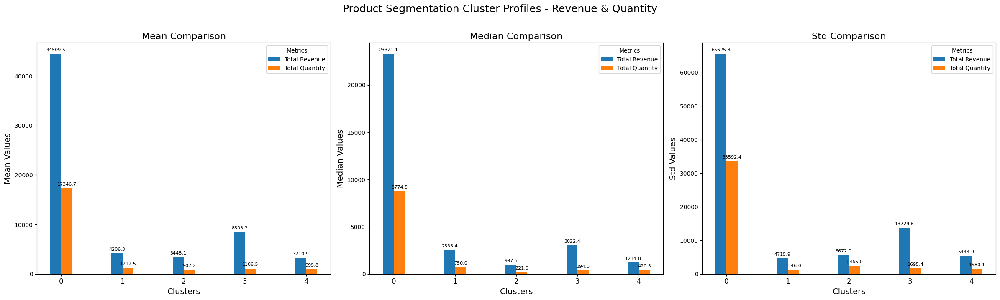

In [155]:
selected_metrics = [
    "Total_Revenue",
    "Total_Quantity"
]

mod.plot_cluster_metrics(
    product_summary,
    selected_metrics,
    "Product Segmentation Cluster Profiles - Revenue & Quantity",
    segmentation_column="product_segmentation"
)


#### Cluster Labeling

**Cluster 0: High-Value & Promotion-Driven Products**  
**Description:**  
- This cluster dominates in both total revenue and total quantity sold. The mean revenue (44509.5) and total quantity (17346.7) significantly surpass other clusters.  
- It exhibits extremely high promotion sensitivity (national promotions mean: 906.1, magasin promotions mean: 1352.0), indicating products frequently sold under promotional offers.  
- Has a relatively balanced card and cash usage, but card usage is notably high (around 81%).  
- Customers buy these products frequently (high count of purchases mean: 15154.7), indicating products are staples or highly popular items purchased repeatedly, likely influenced by promotional incentives.  
- Shows higher proportions of sales in Bron and consistent sales throughout weekdays and weekends.  

---

**Cluster 1: Moderate-Value Regular Essentials**  
**Description:**  
- This group represents moderate total revenue (4206.3) and quantity (1212.5), reflecting everyday products purchased regularly.  
- Moderate sensitivity to promotions (national promotions: 133.6, magasin promotions: 127.9), indicating promotions occasionally drive sales but aren't the sole influencer.  
- Card usage remains high (around 87.5%), while cash usage is lower, suggesting convenience-driven purchasing behavior.  
- Exhibits a balanced geographical distribution, but lower total revenue indicates essential items rather than luxury products.  
- Moderate repeat purchase rates and balanced sales throughout weekdays and weekends.  

---

**Cluster 2: Card-Preferred Premium Purchases**  
**Description:**  
- This cluster features relatively higher revenue per purchase (mean revenue per purchase: 6.8), though lower total revenue (3448.1) due to lower purchase frequency.  
- Products in this cluster are premium or higher-priced (high average revenue per customer: 8.1), typically purchased in smaller quantities per transaction but at a premium.  
- Highest card usage ratio among clusters (over 87%), indicating a strong customer preference for card transactions, likely due to higher ticket size.  
- Minimal influence from promotions (national promotions: 140.6, magasin promotions: 70.0), reflecting products whose purchases are less driven by discounts.  
- Sales are geographically concentrated slightly more toward Bron.  

---

**Cluster 3: Luxury or Special-Occasion Items**  
**Description:**  
- Exceptionally high average revenue metrics (mean revenue per customer: 13.0, mean revenue per purchase: 10.4), signaling luxury or high-value items purchased infrequently or for special occasions.  
- Products are rarely bought repeatedly (low repeat purchase rate), indicating special-purpose or luxury nature.  
- Despite having fewer promotions (national promotions mean: 76.2, magasin promotions mean: 123.1), high revenue per purchase suggests low sensitivity to discounts.  
- Highest weekday vs. weekend purchase ratio, possibly indicating planned, weekday shopping behavior.  
- Card usage remains prominently high due to the high-value nature of purchases.  

---

**Cluster 4: Low-Value, Convenience-Oriented Products**  
**Description:**  
- Lowest total and average revenue (3210.9), indicating low-value convenience or impulse products frequently bought in smaller quantities.  
- Moderate promotions but consistent magasin-level promotions (mean: 141.0), indicating localized offers.  
- High card usage (around 83%), but products still have a noticeable proportion of cash usage, consistent with low-priced impulse buys.  
- Moderate repeat rates (lower than high-value clusters), representing items frequently purchased due to convenience or immediate necessity.  
- Geographic distribution slightly skewed toward City Bron but otherwise balanced.  


In [156]:
# Define a mapping dictionary based on the cluster analysis
value_behavior_mapping = {
    0: "High-Value & Promotion-Driven Products",
    1: "Moderate-Value Regular Essentials",
    2: "Card-Preferred Premium Purchases",
    3: "Luxury or Special-Occasion Items",
    4: "Low-Value, Convenience-Oriented Products"
}

# Apply the mapping to create a new column with meaningful labels
product_df["product_segmentation"] = product_df["product_segmentation"].map(value_behavior_mapping)

# Display the updated DataFrame
product_df.head()


,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,Last_Purchase_Date,Days_Since_Last_Purchase,Promotion_Nationale_Count,Promotion_Magasin_Count,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Hierarchy_METIER,Hierarchy_SOUS_RAYON,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,City_Bron_Purchases,City_Décines_Purchases,City_Meyzieu_Purchases,City_Mions_Purchases,City_Vaulx-en-Velin_Purchases,Card_Purchase_Count,Cash_Purchase_Count,most_used_payment_type,Weekday_Purchases,Weekend_Purchases,Afternoon_Purchases,Evening_Purchases,Morning_Purchases,Revenue_per_Purchase,Quantity_per_Purchase,Revenue_per_Day_Since_Last_Purchase,Quantity_per_Day_Since_Last_Purchase,Weekday_vs_Weekend_Ratio,Morning_Proportion,Afternoon_Proportion,Evening_Proportion,Revenue_per_Customer,Quantity_per_Customer,Card_Usage_Ratio,Cash_Usage_Ratio,City_Bron_Proportion,City_Mions_Proportion,City_Bron_Purchases_Proportion,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,2023-09-30,0,4536,3877,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à assaisonner,FD - Crudité,10012,6306,3108,8128,6549,28329,5774,CARD,23688,10415,13861,9513,10729,1.261476,1.099962,43020.10000,37512.000000,2.274412,0.314606,0.406445,0.278949,2.535217,2.210619,0.830689,0.169311,0.293581,0.238337,0.293581,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,2023-04-30,153,1189,1670,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,3619,1988,873,2556,1838,9286,1588,CARD,7299,3575,4267,2706,3901,3.345012,1.106551,237.73634,78.644706,2.041678,0.358746,0.392404,0.248850,5.924049,1.959713,0.853964,0.146036,0.332812,0.235056,0.332812,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,2023-09-30,0,0,7,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Poêlée et Wok,92,65,20,75,41,255,38,CARD,179,114,112,72,109,3.928430,1.068259,1151.03000,313.000000,1.570175,0.372014,0.382253,0.245734,4.622610,1.257028,0.870307,0.129693,0.313993,0.255973,0.313993,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",Consistent Card-Purchased Products,Moderate-Value Regular Essentials,Bron-Focused Leaders
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,2023-09-30,0,1628,3495,Weekday,Afternoon,Fruits et légumes,Fraîche découpe,Prêt à cuire,FD - Mono légume,8325,4280,2648,7021,5163,23441,3996,CARD,18898,8539,10739,7645,9053,1.670547,1.133578,45834.79000,31101.990000,2.213140,0.329956,0.391406,0.278638,3.275785,2.222841,0.854357,0.145643,0.303422,0.255895,0.303422,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-

### Contingency across product segmentations

In [157]:
import pandas as pd
from scipy.stats import chi2_contingency

In [158]:
segmentation_columns = [
    "sales_performance_segmentation", 
    "customer_engagement_segmentation", 
    "purchase_timing_segmentation", 
    "payment_behavior_segmentation", 
    "geographical_segmentation", 
    "product_segmentation"
]

for i in range(len(segmentation_columns)):
    for j in range(i+1, len(segmentation_columns)):
        col1 = segmentation_columns[i]
        col2 = segmentation_columns[j]
        ct = pd.crosstab(product_df[col1], product_df[col2])
        chi2, p, dof, expected = chi2_contingency(ct)
        
        print(f"Contingency Table between {col1} and {col2}:")
        print(ct)
        print("Chi-square test:")
        print(f"  Chi2 = {chi2:.2f}, p = {p:.4f}, dof = {dof}")
        print("Expected Frequencies:")
        print(expected)
        print("-" * 50)


Contingency Table between sales_performance_segmentation and customer_engagement_segmentation:
customer_engagement_segmentation                 Core Revenue Drivers  High-Value Niche Performers  Low-Engagement, Marginal Products
sales_performance_segmentation                                                                                                       
High-Performance Fast-Moving Products                     506                       72                              13               
Moderate-Performance, Potential Growth Products           457                      343                             668               
Slow-Moving, Low-Demand Products                          210                      363                             813               
Chi-square test:
  Chi2 = 954.54, p = 0.0000, dof = 4
Expected Frequencies:
[[201.23164006 133.4682148  256.30014514]
 [499.84441219 331.52510885 636.63047896]
 [471.92394775 313.00667634 601.06937591]]
--------------------------------

**1. Sales Performance vs. Customer Engagement**  
**What It Says:**  
The chi-square test (Chi2 ≈ 954.54, p < 0.0001) shows a strong association between sales performance and customer engagement segmentation.  

**Insights:**  
- High-Performance Fast-Moving Products overwhelmingly fall into the “Core Revenue Drivers” category.  
- Moderate-Performance, Potential Growth Products are more evenly distributed, with a notable number in “Low-Engagement, Marginal Products.”  
- Slow-Moving, Low-Demand Products are mostly low-engagement.  

**Implication:**  
Products with fast-moving, high sales performance tend to engage customers strongly, suggesting that these products are crucial revenue drivers.  

---

**2. Sales Performance vs. Purchase Timing**  
**What It Says:**  
With a chi-square (≈ 2511.84, p < 0.0001), there is a significant link between sales performance and purchase timing.  

**Insights:**  
- High-performance products are predominantly concentrated in the "High Volume, Evening-Dominant, Weekday Preference" cluster.  
- Lower-performing products are in clusters with more balanced or moderate timing.  

**Implication:**  
The time-of-day and weekday/weekend patterns can serve as an additional indicator of overall sales performance.  

---

**3. Sales Performance vs. Payment Behavior**  
**What It Says:**  
The test (Chi2 ≈ 2010.40, p < 0.0001) indicates that sales performance is significantly related to payment behavior.  

**Insights:**  
- High-performance products tend to fall into a cluster dominated by “Mass-Market Hybrid Payment Products.”  
- Lower-performing products show more diverse payment patterns (e.g., a mix of cash-dominant and weekday-focused card usage).  

**Implication:**  
Payment methods are closely tied to product sales performance. This could influence marketing and sales channel strategies.  

---

**4. Sales Performance vs. Geographical Segmentation**  
**What It Says:**  
A significant association (Chi2 ≈ 1859.42, p < 0.0001) is observed between sales performance and geographical segmentation.  

**Insights:**  
- High-performance products are heavily concentrated in certain geographical clusters (e.g., “Regional Best-Sellers”).  
- Moderate- and low-performance products have different geographic patterns.  

**Implication:**  
Geographic location is an important factor in product performance. Targeted regional strategies are recommended.  

---

**5. Sales Performance vs. Product Segmentation**  
**What It Says:**  
The chi-square test (≈ 3176.59, p < 0.0001) shows a significant relationship between sales performance and product segmentation.  

**Insights:**  
- “High-Performance Fast-Moving Products” are predominantly “High-Value & Promotion-Driven Products.”  

**Implication:**  
Product positioning is closely linked to sales performance.  

---

**6. Customer Engagement vs. Purchase Timing**  
**What It Says:**  
A significant association exists (Chi2 ≈ 862.17, p < 0.0001) between customer engagement and purchase timing segmentation.  

**Insights:**  
- “Core Revenue Drivers” are more common in a cluster characterized by high volume and evening-dominance.  
- “Low-Engagement, Marginal Products” tend to fall into clusters with morning or mixed timing.  

**Implication:**  
Purchase timing patterns reflect the level of customer engagement.  

---

**7. Customer Engagement vs. Payment Behavior**  
**What It Says:**  
The chi-square (≈ 2724.45, p < 0.0001) indicates a significant relationship between these segmentation methods.  

**Insights:**  
- “Core Revenue Drivers” are distributed differently among payment behavior clusters than “High-Value Niche Performers” or “Low-Engagement, Marginal Products.”  

**Implication:**  
Payment behavior adds another layer of understanding to customer engagement.  

---

**8. Customer Engagement vs. Geographical Segmentation**  
**What It Says:**  
A highly significant association (Chi2 ≈ 2307.76, p < 0.0001) exists, indicating customer engagement is strongly tied to purchase location.  

**Insights:**  
- Core Revenue Drivers are more prevalent in specific geographical segments, with the highest concentration in the “Regional Best-Sellers” cluster rather than in “Bron-Focused Leaders.
- Other engagement groups spread differently.  

**Implication:**  
Region-specific strategies are necessary to optimize customer engagement.  

---

**9. Customer Engagement vs. Product Segmentation**  
**What It Says:**  
The chi-square test (≈ 3134.08, p < 0.0001) shows these two segmentation schemes are not independent.  

**Insights:**  
- “Core Revenue Drivers” are heavily skewed toward “High-Value & Promotion-Driven Products.”  

**Implication:**  
Product positioning is crucial for understanding and increasing customer engagement.  

---

**10. Purchase Timing vs. Payment Behavior**  
**What It Says:**  
With Chi2 ≈ 2860.01 (p < 0.0000), there is a significant association between purchase timing and payment behavior.  

**Insights:**  
- Evening-dominant clusters may lean toward cash or hybrid payment methods.  

**Implication:**  
Timing and payment methods together reveal customer behavior and preferences.  

---

**11. Purchase Timing vs. Geographical Segmentation**  
**What It Says:**  
The association (Chi2 ≈ 2259.32, p < 0.0000) indicates that purchase timing patterns differ by region.  

**Insights:**  
- High-volume, evening-dominant segments are more prevalent in regions like “Regional Best-Sellers” or “Vaulx-en-Velin Specialists.”  

**Implication:**  
Localized marketing and inventory strategies should consider purchase timing by region.  

---

**12. Purchase Timing vs. Product Segmentation**  
**What It Says:**  
The chi-square (≈ 1720.33, p < 0.0000) indicates a significant association between purchase timing and product segmentation.  

**Insights:**  
- Different product segments show distinct purchase timing patterns.  

**Implication:**  
Tailor promotions and availability based on timing patterns for each product segment.  

---

**13. Payment Behavior vs. Geographical Segmentation**  
**What It Says:**  
With Chi2 ≈ 4178.30 (p < 0.0000), payment behavior is strongly linked with geography.  

**Insights:**  
- Different geographical segments exhibit distinct payment behavior profiles.  

**Implication:**  
Payment options and promotions should be tailored to regional preferences.  

---

**14. Payment Behavior vs. Product Segmentation**  
**What It Says:**  
The test (Chi2 ≈ 2997.90, p < 0.0000) shows product segmentation and payment behavior are significantly related.  

**Insights:**  
- “Premium Card-Favored Products” concentrate in certain segments, while “Cash-Dominant Products” appear in others.  

**Implication:**  
Refine product positioning and pricing based on payment preferences.  

---

**15. Geographical Segmentation vs. Product Segmentation**  
**What It Says:**  
The chi-square (Chi2 ≈ 3229.60, p < 0.0000) indicates that geographical and product segmentation are significantly associated.  

**Insights:**  
- A product segment may dominate in “Bron-Focused Leaders” while others appear in “Mions-Centric Products” or “Vaulx-en-Velin Specialists.”  

**Implication:**  
Use this relationship to guide regional marketing and distribution strategies.  

---

**Overall Conclusion**  
Every contingency table reveals a statistically significant association (p < 0.0001) between the segmentation schemes.  

**Key Takeaways:**  
- Sales performance, customer engagement, purchase timing, payment behavior, geographical, and product segmentation are all interrelated.  
- Observed frequencies deviate from expected ones, meaning these segmentations reflect real, overlapping behavioral differences.  

**Business Implications:**  
- High-performing products are likely to be core revenue drivers, purchased at specific times, using certain payment methods, and concentrated in key regions.  
- These findings support targeted marketing, localized distribution, payment-based promotions, and refined product positioning strategies.  


### Saving Final Product DF with Labels

In [165]:
import joblib
joblib.dump(product_df, './Data/product_labeled_df.joblib')

['./Data/product_labeled_df.joblib']

In [2]:
import joblib
product_labeled_df = joblib.load('./Data/product_labeled_df.joblib')

In [3]:
product_labeled_df.head()

,Count_of_Purchases,Total_Quantity,Total_Revenue,Avg_Quantity,Avg_Revenue,Number_of_Customers,Repeat_Customers,Repeat_Purchase_Rate,Avg_Purchase_Frequency,Average_Share_Of_Wallet,...,City_Décines_Purchases_Proportion,City_Meyzieu_Purchases_Proportion,City_Mions_Purchases_Proportion,City_Vaulx-en-Velin_Purchases_Proportion,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,product_segmentation,geographical_segmentation
Product_Name,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,1.099962,1.261476,16969,4548,0.268018,2.009724,0.022722,...,0.184910,0.091136,0.238337,0.192036,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers
Légumes vapeur 500gr,10874,12032.64,36373.66,1.106551,3.345012,6140,1468,0.239088,1.771010,0.035902,...,0.182821,0.080283,0.235056,0.169027,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers
poêlée Gourmande 525gr,293,313.00,1151.03,1.068259,3.928430,249,8,0.032129,1.176707,0.034042,...,0.221843,0.068259,0.255973,0.139932,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",Consistent Card-Purchased Products,Moderate-Value Regular Essentials,Bron-Focused Leaders
Champ. émincés 145 Gr,27437,31101.99,45834.79,1.133578,1.670547,13992,3775,0.269797,1.960906,0.023131,...,0.155994,0.096512,0.255895,0.188177,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers
Champ. Eminces 530 Gr,25600,28428.00,95731.63,1.110469,3.739517,13059,3714,0.284402,1.960334,0.043818,...,0.179336,0.056563,0.284805,0.165586,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,High-Value & Promotion-Driven Products,Regional Best-Sellers


In [4]:
product_labeled_df.shape

(3445, 58)

In [5]:
product_labeled_df.columns

Index(['Count_of_Purchases', 'Total_Quantity', 'Total_Revenue', 'Avg_Quantity',
       'Avg_Revenue', 'Number_of_Customers', 'Repeat_Customers',
       'Repeat_Purchase_Rate', 'Avg_Purchase_Frequency',
       'Average_Share_Of_Wallet', 'Last_Purchase_Date',
       'Days_Since_Last_Purchase', 'Promotion_Nationale_Count',
       'Promotion_Magasin_Count', 'Most_Purchased_Day_Category',
       'Most_Purchased_Time_Of_Day', 'Hierarchy_METIER',
       'Hierarchy_SOUS_RAYON', 'Hierarchy_FAMILLE', 'Hierarchy_SOUS_FAMILLE',
       'City_Bron_Purchases', 'City_Décines_Purchases',
       'City_Meyzieu_Purchases', 'City_Mions_Purchases',
       'City_Vaulx-en-Velin_Purchases', 'Card_Purchase_Count',
       'Cash_Purchase_Count', 'most_used_payment_type', 'Weekday_Purchases',
       'Weekend_Purchases', 'Afternoon_Purchases', 'Evening_Purchases',
       'Morning_Purchases', 'Revenue_per_Purchase', 'Quantity_per_Purchase',
       'Revenue_per_Day_Since_Last_Purchase',
       'Quantity_per_Day_Since

In [6]:
# Define the columns you want to keep
important_columns = [
    'Count_of_Purchases',
    'Total_Quantity',
    'Total_Revenue',
    'Repeat_Purchase_Rate',
    'Days_Since_Last_Purchase',
    'most_used_payment_type',
    'sales_performance_segmentation',
    'customer_engagement_segmentation',
    'purchase_timing_segmentation',
    'payment_behavior_segmentation',
    'product_segmentation',
    'geographical_segmentation',
    'Hierarchy_METIER',
    'Hierarchy_SOUS_RAYON',
    'Hierarchy_FAMILLE',
    'Hierarchy_SOUS_FAMILLE',
    'Most_Purchased_Day_Category',
    'Most_Purchased_Time_Of_Day',
    'Quantity_per_Purchase',
    'Revenue_per_Purchase',
    'Revenue_per_Customer',
    'Quantity_per_Customer',
    'Average_Share_Of_Wallet',
    'Avg_Purchase_Frequency'
]

# Create the new dataframe
df_business = product_labeled_df[important_columns]
# Display the first few rows of the new dataframe
df_business.head()


,Count_of_Purchases,Total_Quantity,Total_Revenue,Repeat_Purchase_Rate,Days_Since_Last_Purchase,most_used_payment_type,sales_performance_segmentation,customer_engagement_segmentation,purchase_timing_segmentation,payment_behavior_segmentation,...,Hierarchy_FAMILLE,Hierarchy_SOUS_FAMILLE,Most_Purchased_Day_Category,Most_Purchased_Time_Of_Day,Quantity_per_Purchase,Revenue_per_Purchase,Revenue_per_Customer,Quantity_per_Customer,Average_Share_Of_Wallet,Avg_Purchase_Frequency
Product_Name,,,,,,,,,,,,,,,,,,,,,
Carotte rapée 250 gr KG,34103,37512.00,43020.10,0.268018,0,CARD,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,...,Prêt à assaisonner,FD - Crudité,Weekday,Afternoon,1.099962,1.261476,2.535217,2.210619,0.022722,2.009724
Légumes vapeur 500gr,10874,12032.64,36373.66,0.239088,153,CARD,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,...,Prêt à cuire,FD - Poêlée et Wok,Weekday,Afternoon,1.106551,3.345012,5.924049,1.959713,0.035902,1.771010
poêlée Gourmande 525gr,293,313.00,1151.03,0.032129,0,CARD,"Moderate-Performance, Potential Growth Products","Low-Engagement, Marginal Products","Highest Volume, Morning-Dominant, Strong Weekd...",Consistent Card-Purchased Products,...,Prêt à cuire,FD - Poêlée et Wok,Weekday,Afternoon,1.068259,3.928430,4.622610,1.257028,0.034042,1.176707
Champ. émincés 145 Gr,27437,31101.99,45834.79,0.269797,0,CARD,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,...,Prêt à cuire,FD - Mono légume,Weekday,Afternoon,1.133578,1.670547,3.275785,2.222841,0.023131,1.960906
Champ. Eminces 530 Gr,25600,28428.00,95731.63,0.284402,0,CARD,High-Performance Fast-Moving Products,Core Revenue Drivers,"High Volume, Evening-Dominant, Weekday Preference",Mass-Market Hybrid Payment Products,...,Prêt à cuire,FD - Mono légume,Weekday,Afternoon,1.110469,3.739517,7.330701,2.176890,0.043818,1.960334


In [8]:
import joblib
joblib.dump(df_business, './Data/product_insights.joblib')

['./Data/product_insights.joblib']

### Cluster details

In [175]:
import joblib
cluster_df = joblib.load('./Data/label_details.joblib')

In [176]:
# Apply left alignment to all text columns
styled_df = cluster_df.style.set_properties(**{'text-align': 'left'})

# Display the styled DataFrame (if using Jupyter Notebook)
styled_df


,Label,Description
0,High-Performance Fast-Moving Products,"This group represents products characterized by very high average revenue, large quantities sold, and frequent purchases (high 'Count of Purchases'). These products have minimal 'days since last purchase,' indicating they sell regularly and consistently. They also have significant engagement with promotional activities, evident from high values in both national and store promotions. High standard deviation across these metrics suggests some diversity within this group, indicating both flagship and slightly less consistent but still top-performing products. These products represent essential, high-demand items that strongly drive revenue and volume."
1,"Slow-Moving, Low-Demand Products","This group shows characteristics of extremely low performance, including low total revenue, small quantities sold, and very few purchase occurrences. They have significantly longer 'days since last purchase,' implying infrequent restocking or low customer demand. Moreover, they respond minimally to promotional activities, as seen in the negligible promotional metrics. Low variability (low standard deviation) highlights consistently poor product performance. This group represents products potentially near end-of-life or those that may require re-evaluation of their market relevance."
2,"Moderate-Performance, Potential Growth Products","This group comprises products positioned between high-performance and slow-moving categories. They exhibit moderate revenue and quantities sold, with occasional and steady purchase frequency. Their 'days since last purchase' metric is lower than the slow-moving group, indicating moderate customer interest and consistent replenishment, though not as frequently as the high-performing group. They have moderate responsiveness to promotions, suggesting promotional strategies could positively influence sales. Products in this group represent opportunities for targeted marketing strategies to drive growth, possibly converting them into higher-performing products over time."
3,"Highest Volume, Morning-Dominant, Strong Weekday Preference","This cluster has the highest mean and median for Count_of_Purchases, Total_Quantity, and Total_Revenue, making them the top performers in terms of overall sales. A high Morning_Proportion (around 0.7–0.8) indicates these purchases predominantly occur in the early part of the day. A high Weekday_vs_Weekend_Ratio (> 3 on average) shows a strong skew toward weekday transactions. These are the most active, morning-focused products (depending on context), and they transact heavily on weekdays."
4,"Moderate Volume, Afternoon-Dominant, Weekday Preference","This cluster shows moderate levels of Count_of_Purchases, Total_Quantity, and Total_Revenue—higher than the lowest volume cluster but below the highest volume clusters. A high Afternoon_Proportion (~0.6) indicates a clear preference for midday or afternoon transactions. The Weekday_vs_Weekend_Ratio is around 2–2.5, indicating they still purchase more on weekdays, but not as strongly skewed as the highest volume cluster. This cluster is moderately active, most purchases happen in the afternoon, and they lean toward weekdays over weekends."
5,"High Volume, Evening-Dominant, Weekday Preference","This cluster is second-highest in Count_of_Purchases, Total_Quantity, and Total_Revenue, just below the top-performing cluster but well above lower-performing ones. A high Evening_Proportion (~0.5–0.6) indicates that these purchases are heavily concentrated in the evening. The Weekday_vs_Weekend_Ratio is typically around 2, showing a clear tilt toward weekday purchasing but less extreme than the highest volume cluster. These are high-volume transactions occurring mainly in the evenings, still favoring weekdays."
6,"Low Volume, Balanced Timing, Mixed Weekday-Weekend","This group shows the lowest mean and median for Count_of_Purchases, Total_Quantity, and Total_Revenue among all clusters. The prop